# Tienda de juguetes

## Materia: Series de tiempo

### Integrantes:

##### Guerrero Paisano Jesedh.
##### Huerta Ramírez Michel Adolfo.
##### Maravilla Perez Vianey.
##### Mondolla Cervantes Erin.
##### Perea Samaniego Jesus Giovanni.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from typing import Dict, Tuple, Union, List
from statsmodels.graphics.tsaplots import plot_acf
import re
import random
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import pickle
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
from scipy import stats
import copy
from tabulate import tabulate

In [2]:
# Abre el archivo y se guarda en un DataFrame
data = pd.read_csv(r"C:\Users\DELL\Desktop\Universidad\ESCOM\Semestre5\AnalisisSeriesTiempo\Proyecto\Tiendas\sales.csv")
df = data.copy(deep=True)
df.head(10)

,Sale_ID,Date,Store_ID,Product_ID,Units
0,1,2017-01-01,24,4,1
1,2,2017-01-01,28,1,1
2,3,2017-01-01,6,8,1
3,4,2017-01-01,48,7,1
4,5,2017-01-01,44,18,1
5,6,2017-01-01,1,31,1
6,7,2017-01-01,40,7,1
7,8,2017-01-01,19,2,1
8,9,2017-01-01,38,21,1
9,10,2017-01-01,21,8,1


In [3]:
print(f"Numero de registros : {len(df)}")

Numero de registros : 829262


In [4]:
# Importacion de las tablas de dimensiones
dimensions_names = ['inventory', 'products', 'stores']
inventory = pd.read_csv(r"C:\Users\DELL\Desktop\Universidad\ESCOM\Semestre5\AnalisisSeriesTiempo\Proyecto\Tiendas\inventory.csv")
products = pd.read_csv(r"C:\Users\DELL\Desktop\Universidad\ESCOM\Semestre5\AnalisisSeriesTiempo\Proyecto\Tiendas\products.csv")
stores = pd.read_csv(r"C:\Users\DELL\Desktop\Universidad\ESCOM\Semestre5\AnalisisSeriesTiempo\Proyecto\Tiendas\stores.csv")

## Preprocesamiento

In [5]:
# Cambiar el tipo de dato de columnas a string para evitar que al consultar estadisticos se hagan operaciones sobre ellas

# Cambiar el tipo de dato de la columna 'fecha' a tipo fecha
df['Date'] = pd.to_datetime(df['Date'])
type(df['Date'][0])

# Conversión de las columnas ID de cada tabla de dimensiones a tipo string
columnas_a_convertir = ['Sale_ID', 'Store_ID', 'Product_ID']
df[columnas_a_convertir] = df[columnas_a_convertir].astype(str)

inventory['Store_ID'] = inventory['Store_ID'].astype(str)
inventory['Product_ID'] = inventory['Product_ID'].astype(str)

products['Product_ID'] = products['Product_ID'].astype(str)

stores['Store_ID'] = stores['Store_ID'].astype(str)

In [6]:
# Supresión del símbolo monetario
products['Product_Price'] = products['Product_Price'].str.replace('$', '')
products['Product_Price'] = products['Product_Price'].astype(float)

products['Product_Cost'] = products['Product_Cost'].str.replace('$', '')
products['Product_Cost'] = products['Product_Cost'].astype(float)

C:\Users\DELL\AppData\Local\Temp\ipykernel_13588\46134702.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  products['Product_Price'] = products['Product_Price'].str.replace('$', '')
C:\Users\DELL\AppData\Local\Temp\ipykernel_13588\46134702.py:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  products['Product_Cost'] = products['Product_Cost'].str.replace('$', '')


In [7]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Product_ID        35 non-null     object 
 1   Product_Name      35 non-null     object 
 2   Product_Category  35 non-null     object 
 3   Product_Cost      35 non-null     float64
 4   Product_Price     35 non-null     float64
dtypes: float64(2), object(3)
memory usage: 1.5+ KB


In [8]:
# Creacion de funciones de análisis de outliers

# Verificacion de outliers
def verificacionOutliers(nameDataFrame, nameTSeries):
        # Grafico de caja de la serie de tiempo
    nameDataFrame[nameTSeries].plot(kind='box', title=f'{nameTSeries} - Outliers', figsize=(12,6), grid=True)
    plt.show()

    # Para saber los cuartiles. La funcion recibe como parametro una serie de pandas
    cuartiles = nameDataFrame[nameTSeries].quantile([0.25, 0.5, 0.75])
    print("Cuartiles: ")
    print(cuartiles)
    #cuartiles = cuartiles.to_list()
    cuartiles = np.array(cuartiles)
    # print(type(cuartiles)) #Serie de pandas
    percentiles = nameDataFrame[nameTSeries].quantile(np.arange(0.1, 1.0, 0.1))
    percentiles = np.array(percentiles)
    print("Percentiles: ")
    print(percentiles)
    
    # Convertimos la Serie de Pandas en un numpy array
    ts = np.array(nameDataFrame[nameTSeries])

    # Determinacion de los outliers
    # Conocer cuáles son los valores outliers ligeros y cuáles son extremos
    mediana = cuartiles[1]
    IQ = cuartiles[-1]-cuartiles[0]
    # print(IQ)
    lif = cuartiles[0]-(1.5*IQ) 
    uif = cuartiles[2]+(1.5*IQ)
    lof = cuartiles[0]-(3.0*IQ)
    uof = cuartiles[2]+(3.0*IQ)

    print("Limites intercuartilicos")
    print("lof: ", lof)
    print("lif: ", lif)    
    print("uif: ", uif)
    print("uof: ", uof)

    # Conocer los outliers
    outliersModerados = []
    outliersExtremos = []
    for dato in ts:
        if (dato<lif and dato>lof) or (dato>uif and dato<uof):
            outliersModerados.append(dato)
        if(dato<lof) or (dato>uof):
            outliersExtremos.append(dato)

    print("Outliers moderados: ", sorted(set(outliersModerados)))
    print(f"Hay {len(outliersModerados)} registros correspondientes a los outliers moderados")
    registersModerateOutliers = nameDataFrame[nameDataFrame[nameTSeries].isin(outliersModerados)]
    #print(registersModerateOutliers)# Seleccionar filas que contienen los valores de la lista outliersModerados
    #nameDataFrame[np.where(nameDataFrame[nameTSeries]==outliersModerados)]
    print("Outliers extremos: ", sorted(set(outliersExtremos)))
    print(f"Hay {len(outliersExtremos)} registros correspondientes a los outliers extremos.")
    registersExtremeOutliers = nameDataFrame[nameDataFrame[nameTSeries].isin(outliersExtremos)]
    #print(registersExtremeOutliers) # Seleccionar filas que contienen los valores de la lista outliersExtremos
    #nameDataFrame[np.where(nameDataFrame[nameTSeries]==outliersExtremos)]

    return registersModerateOutliers, registersExtremeOutliers

In [9]:
# Definición de una función para neutralizar los outliers.
def eliminacion_outliers(column_original):
    column = copy.deepcopy(column_original)
    print("\n", column.name.upper(), "\n")

    # Calculating quantiles
    quartiles = column.quantile([0.25, 0.5, 0.75])
    quartiles = np.array(quartiles)
    percentiles = column.quantile(np.arange(0.1, 1.0, 0.1))
    percentiles = np.array(percentiles)
    IQ = quartiles[-1] - quartiles[0]
    lif = quartiles[0] - (1.5 * IQ)
    uif = quartiles[2] + (1.5 * IQ)
    lof = quartiles[0] - (3.0 * IQ)
    uof = quartiles[2] + (3.0 * IQ)
    print("Quartiles:", quartiles)
    print("Percentiles: ", percentiles)
    print("Lower outer fence: ", lof)
    print("Lower inner fence: ", lif)
    print("Upper inner fence: ", uif)
    print("Upper outer fence: ", uof)

    # Identifying moderated and extreme outliers
    moderated_outliers = []
    extreme_outliers = []
    for i in range(len(column)):
        v = column.iloc[i]
        if (v < lif and v > lof) or (v > uif and v < uof):
            moderated_outliers.append(v)
        if (v < lof) or (v > uof):
            extreme_outliers.append(v)

    # Imputation with percentil 1 and 9
    column[column < lif] = percentiles[0]
    column[column > uif] = percentiles[-1]

    # Identifying moderated and extreme outliers
    moderated_outliers_after = []
    extreme_outliers_after = []
    for i in range(len(column)):
        v = column.iloc[i]
        if (v < lif and v > lof) or (v > uif and v < uof):
            moderated_outliers_after.append(v)
        if (v < lof) or (v > uof):
            extreme_outliers_after.append(v)

    res = [
        [len(moderated_outliers), len(moderated_outliers_after)],
        [len(extreme_outliers), len(extreme_outliers_after)],
    ]
    print(
        tabulate(
            res,
            headers=["Before", "After"],
            tablefmt="fancy_grid",
            numalign="center",
            showindex=["# Moderated outliers", "# Extreme outliers"],
        )
    )

    plt.rcParams["figure.figsize"] = [3, 3]
    df_aux = pd.concat(
        [column_original.rename("before"), column.rename(" after")], axis=1
    )
    ax = df_aux.plot(kind="box", title=column.name, grid=True)
    plt.show()

    return column

In [10]:
# Funcion para elegir colores de forma aleatoria
def generar_color_hex_aleatorio():
    # Generar componentes RGB aleatorios
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)

    # Convertir los componentes a formato hexadecimal
    hex_color = '#{:02x}{:02x}{:02x}'.format(r, g, b)

    return hex_color

In [11]:
# Histograma de frecuencias por columna
#column_namess = ['Date', 'Store_ID', 'Product_ID', 'Units']
#for column in column_namess:
#            print(column)
#            counts = df[column].value_counts()
#            print(counts)
#            print()   
#            
#            color = generar_color_hex_aleatorio()
#            
#            #define subplots
#            fig, ax = plt.subplots(1, 1, figsize=(30,8))
#            fig.tight_layout()
#            #sum = df_store.groupby(time_column_name)[grouping_feature].sum()
#            
#            
#            ax.hist(df[column].values, color=color, edgecolor='k')
#    #print(promedio)
#
#    #percent = round((len(df_state) / len(df)) * 100, 2)
#    
#    # Graficos
#            nombreGrafico = f"{column} - {grouping_feature}"
#            ax.title.set_text(nombreGrafico)
#            plt.show()

## Para Series de Tiempo

In [12]:
def time_series_nst_plot(df, feature_name, time_column_name, grouping_feature, specific_value, percent_test = 0.2): 
   
    # Genereación del dataframe filtrado
    df_city = df[df[feature_name] == specific_value]
    df_city = df_city.sort_values(by=time_column_name)
    #print(df_city.head(5))
    df_city = df_city.groupby(time_column_name)[grouping_feature].sum()
    df_city = df_city.reset_index() # Solo por si el date es el índice del dataframe
    
    # Dividimos a nuestro nuevo dataframe en conjunto de entrenamiento y de prueba

    # Porcentaje del Conjunto de Prueba.
    test_perc = percent_test
    total_obs = len(df_city)
    # Obtención del índice final para el Conjunto de Entrenamiento.
    limit_index = int((1 - test_perc) * total_obs)
    
    # Partición del Conjunto de Datos.
    df_train = df_city.iloc[:limit_index]
    df_test = df_city.iloc[limit_index:]
    print("Registros en el df_train: ", len(df_train))
    print("Registros en el df_test: ", len(df_test))
    
    # Visualización del Conjunto de Entrenamiento.
    print("\nRegistros finales del conjunto de entrenamiento")
    print(df_train.tail(3))
    
    # Visualización del Conjunto de Prueba.
    print("\nRegistros iniciales del conjunto de prueba")
    print(df_test.head(3))
    
    # Crear una figura y un conjunto de ejes
    fig, ax = plt.subplots(figsize=(20,7))

    # Generar el gráfico
    ax.plot(df_train[time_column_name], df_train[grouping_feature])

    # Ajustar el tamaño del gráfico al espacio disponible
    fig.tight_layout()

    # Obtener los límites de los meses
    meses = pd.to_datetime(df_train[time_column_name].dt.strftime('%Y-%m'))

    # Trazar líneas verticales al inicio de cada mes
    for mes in meses:
        ax.axvline(x=mes, color='red', linestyle='--')

    nombreGrafico = f"{grouping_feature} by {feature_name} {specific_value}"
    ax.title.set_text(nombreGrafico)

    ## Agregar una línea vertical para cada año
    #for year in pd.unique(df_train.index.year):
    #    ax.axvline(pd.Timestamp(year=year, month=1, day=1), color='red', linestyle='--', linewidth=0.8)

    # Mostrar el gráfico
    plt.show()
    
    return df_train, df_test

In [13]:
# Procurar que el indice de la serie de tiempo estacionario sea la columna de fecha
def time_series_st_plot(df_st, time_column_name, grouping_feature, specific_value): 
    
    # Crear una figura y un conjunto de ejes
    fig, ax = plt.subplots(figsize=(20,7))

    #df_train_st_copy['Date'] = pd.to_datetime(df_train_st_copy['Date'])

    # Generar el gráfico
    ax.plot(df_st[time_column_name],df_st[grouping_feature])

    # Ajustar el tamaño del gráfico al espacio disponible
    fig.tight_layout()

    # Para trazar las lineas verticales mensuales
    df_st_copy = df_st.copy()
    #df_st_copy = df_st_copy.reset_index()
    meses = pd.to_datetime(df_st_copy[time_column_name].dt.strftime('%Y-%m'))

    # Trazar líneas verticales al inicio de cada mes
    for mes in meses:
        ax.axvline(x=mes, color='red', linestyle='--')
        
    # Nombre del grafico
    nombreGrafico = f"Stationary - {grouping_feature} by {specific_value}"
    ax.title.set_text(nombreGrafico)

    # Mostrar el gráfico
    plt.show()

### Estacionariedad

In [14]:
# Método de Diferencias.
def diffs_method(serie, diff_type, cycles = 0):
    for t in diff_type:
        if t == 'inc':
            serie = serie.diff()
        elif t == 'cyc':
            serie = serie.diff(periods = cycles)
    
    return serie

In [15]:
# Funcion para hacer estacionarias todas las columnas numéricas del dataframe
def make_stationary(serie, diff_type, cycle = 12):
    # Realizamos una copia del Dataframe de train
    serie_st = serie.copy()

    # Recorremos cada una de las columnas
    columns = serie_st.select_dtypes(include=[np.number]).columns #Solo nos quedamos con las columnas nuericas
    for name in columns[:]:
        # Proceso de Normalización y Generación de Series Estacionarias.
        serie_st[name] = diffs_method(serie_st[name], diff_type, cycle)
    
    # Borramos NaNs
    serie_st = serie_st.dropna()
    
    return serie_st

## Análisis exploratorio de los datos

In [16]:
# Creación de una clase para hacer el análisis exploratorio por cada columna del DataFrame
class EDA_Feature():
    def __init__(self):
        pass

    def checkOutliers(self, df, column_name):
        print("Feature : ", column_name)
        moderate, extreme = verificacionOutliers(df, column_name)
        return moderate, extreme
    
    # Funcion para elegir colores de forma aleatoria
    def generar_color_hex_aleatorio(self):
        # Generar componentes RGB aleatorios
        r = random.randint(0, 255)
        g = random.randint(0, 255)
        b = random.randint(0, 255)

        # Convertir los componentes a formato hexadecimal
        hex_color = '#{:02x}{:02x}{:02x}'.format(r, g, b)

        return hex_color
    
    def frequency(self, df, column_names):
        for column in column_names:
            print(column)
            counts = df[column].value_counts()
            print(counts)
            print()   
            
            color = self.generar_color_hex_aleatorio()
            
            # Graficos
            fig, ax = plt.subplots(1, 1, figsize=(30,8))
            fig.tight_layout()
            num_bars = len(df[column].unique())
            ax.hist(df[column].values, color=color, edgecolor='k', bins = num_bars)
            nombreGrafico = f"{column}"
            ax.title.set_text(nombreGrafico)
            plt.show()

    def grouping(self, df, sorted_column_names, targetColumn, procedure = 1, graph = 0):
        if procedure: 
            if procedure == 1:
                dfGrouped = df.groupby(sorted_column_names)[targetColumn].sum().sort_values(ascending=False)
            elif procedure == 2:
                dfGrouped = df.groupby(sorted_column_names)[targetColumn].count().sort_values(ascending=False)
            elif procedure == 3:
                dfGrouped = df.groupby(sorted_column_names)[targetColumn].max().sort_values(ascending=False)
            else:
                pass
        #pd.set_option('display.max_rows', None)
        print(dfGrouped.head(20))
        
        
        if graph != 0: 

            # Crear la figura y los ejes
            fig, ax = plt.subplots(figsize=(12,9))
            
            #Gráfica de barras
            if graph == 1:
                # Crear una lista de colores utilizando la función color_palette
                colores = sns.color_palette("husl", len(dfGrouped))

                # Graficar los valores por grupo con diferentes colores
                dfGrouped.plot(kind='bar', color=colores)

                plt.title(f"Total of {targetColumn}")
                plt.xlabel(f"{sorted_column_names}")
                plt.ylabel(f"{targetColumn}")
                # Ajustar el espacio de despliegue
                plt.tight_layout()
                plt.show()
                
            #Gráfico de pastel
            elif graph == 2:

                # Crear una lista de colores utilizando la función color_palette
                colores = sns.color_palette("pastel", len(dfGrouped))

                dfGrouped.plot(kind='pie', autopct='%1.1f%%', colors=colores)

                plt.title(f'Distribution of {targetColumn} vs {sorted_column_names}')
                plt.ylabel('')
                
                # Crear la leyenda
                plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
                # A1justar el espacio de despliegue
                plt.tight_layout()
                plt.show()

        return dfGrouped

In [17]:
# Exploración estadística de la tabla de hechos: "Sales"
df.describe()

,Units
count,829262.000000
mean,1.315103
std,0.830701
min,1.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,30.000000


In [18]:
# Verificamos si existen valores nulos
print(df.isnull().sum())

Sale_ID       0
Date          0
Store_ID      0
Product_ID    0
Units         0
dtype: int64


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829262 entries, 0 to 829261
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   Sale_ID     829262 non-null  object        
 1   Date        829262 non-null  datetime64[ns]
 2   Store_ID    829262 non-null  object        
 3   Product_ID  829262 non-null  object        
 4   Units       829262 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 31.6+ MB


In [20]:
# Analisis de los valores maximos y mínimos de las columnas numericas

#Ordenamos el dataframe
df = df.sort_values('Date')

# Eleccion de las columnas numéricas
df_numeric = df.select_dtypes('number')
numericColumns = df_numeric.columns

# Obtener los valores mínimos de todas las columnas
min_values = df.apply(min)
print("Valores Minimos")
print(min_values)
print()


# Obtener los valores máximos de todas las columnas
max_values = df.apply(max)
print("Valores Maximos")
print(max_values)
print()

Valores Minimos
Sale_ID                         1
Date          2017-01-01 00:00:00
Store_ID                        1
Product_ID                      1
Units                           1
dtype: object

Valores Maximos
Sale_ID                     99999
Date          2018-09-30 00:00:00
Store_ID                        9
Product_ID                      9
Units                          30
dtype: object



### Análisis general 

Date
2018-04-30    3101
2018-04-29    2464
2018-03-30    2461
2017-12-24    2450
2018-06-17    2416
              ... 
2017-01-16     631
2017-08-29     621
2017-09-12     609
2017-03-07     608
2017-01-03     603
Name: Date, Length: 638, dtype: int64



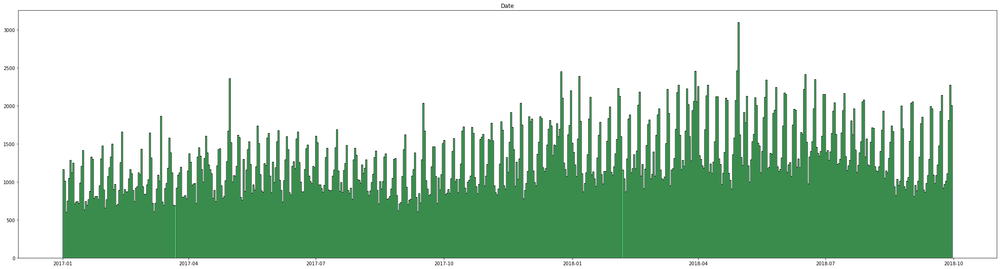

Store_ID
31    29024
9     24482
17    23533
30    23384
7     21300
37    19551
4     18924
39    18809
46    18739
14    18157
41    18018
10    17695
45    17668
13    16991
6     16864
28    16764
38    16580
42    16553
22    16494
3     16331
34    16324
47    16276
21    16111
33    16049
25    16034
1     15926
19    15776
2     15698
16    15499
32    15264
29    14998
8     14969
36    14956
18    14875
44    14868
12    14644
15    14618
49    14594
35    14592
24    14588
50    14569
48    14166
43    14110
23    13998
27    13957
11    13643
20    13501
5     13217
26    12805
40    12776
Name: Store_ID, dtype: int64



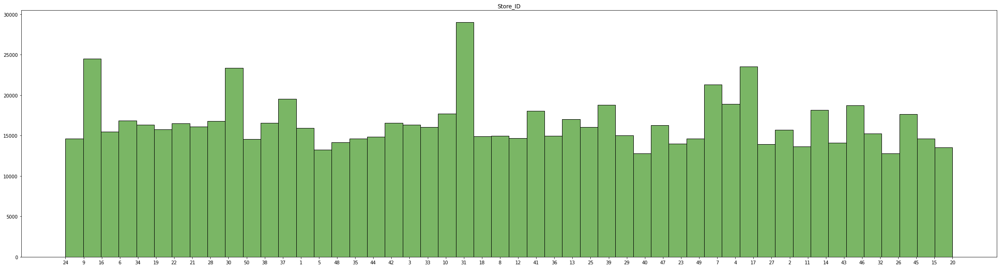

Product_ID
6     72988
8     68083
25    64834
3     54078
1     48497
18    48030
31    41559
19    39293
30    38703
2     32250
9     28181
7     26203
14    24507
21    24378
10    24311
24    23709
17    21648
15    20776
27    20736
13    15543
16    12143
11    11205
34    10494
23     7820
12     6812
32     6088
26     6067
33     6034
29     5328
5      4269
4      3700
22     3002
28     2812
35     2599
20     2582
Name: Product_ID, dtype: int64



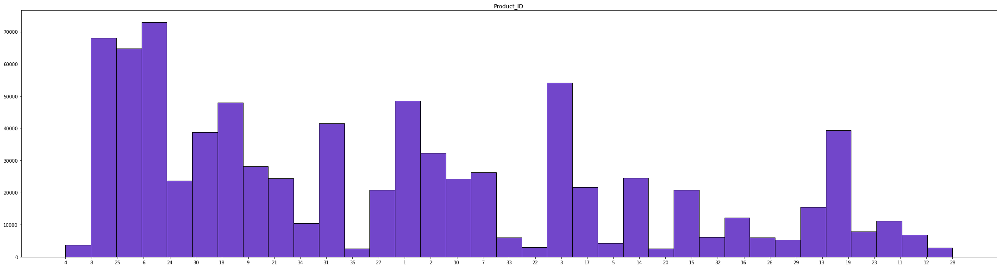

Units
1     689023
3      65638
2      54576
4      13117
6       2808
5       2628
7        779
9        203
8        180
10        96
11        36
12        35
13        25
15        18
17        13
21        12
16        12
19        11
18        10
20        10
14         9
24         7
22         7
23         5
30         2
27         1
25         1
Name: Units, dtype: int64



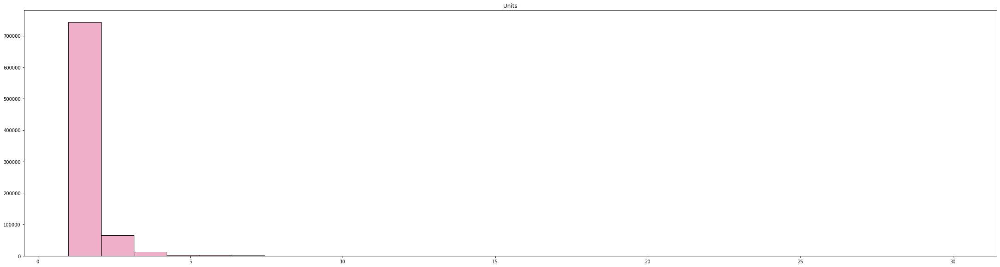

In [21]:
# Histograma de frecuencias generales
eda = EDA_Feature()
column_names = ['Date', 'Store_ID', 'Product_ID', 'Units']
eda.frequency(df, column_names)

### Units

Agrupacion

Procedure:  
    1 - Suma  
    2 - Conteo  
    3 - Max  

Graph:  
    1 - Lineal  
    2 - Pastel  

##### De manera general, ¿cuáles son las TIENDAS y LUGARES DEL PAIS en que se venden más productos?

Feature :  Units


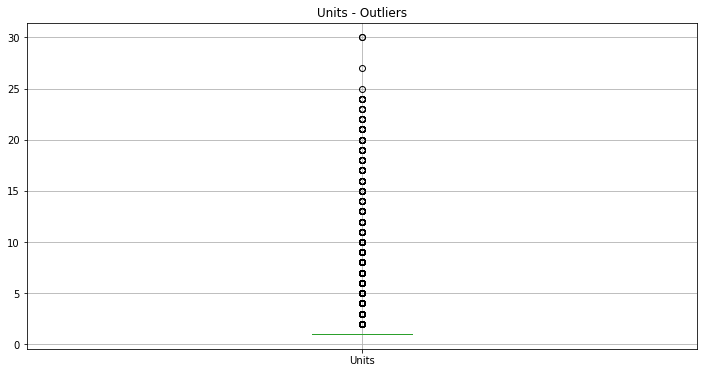

Cuartiles: 
0.25    1.0
0.50    1.0
0.75    1.0
Name: Units, dtype: float64
Percentiles: 
[1. 1. 1. 1. 1. 1. 1. 1. 3.]
Limites intercuartilicos
lof:  1.0
lif:  1.0
uif:  1.0
uof:  1.0
Outliers moderados:  []
Hay 0 registros correspondientes a los outliers moderados
Outliers extremos:  [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 30]
Hay 140239 registros correspondientes a los outliers extremos.
Total de registros : 829262


In [22]:
# Revisión de outliers
eda = EDA_Feature()
moderate, extreme = eda.checkOutliers(df,numericColumns[-1])
print(f'Total de registros : {len(df)}')

Store_ID
31    20741
9     13730
17    13646
30    12858
7     10979
37    10810
42    10208
14    10196
10    10157
39     9982
6      9271
47     9230
33     8998
41     8625
38     8605
28     8478
46     8389
36     8160
2      8048
49     7961
Name: Units, dtype: int64


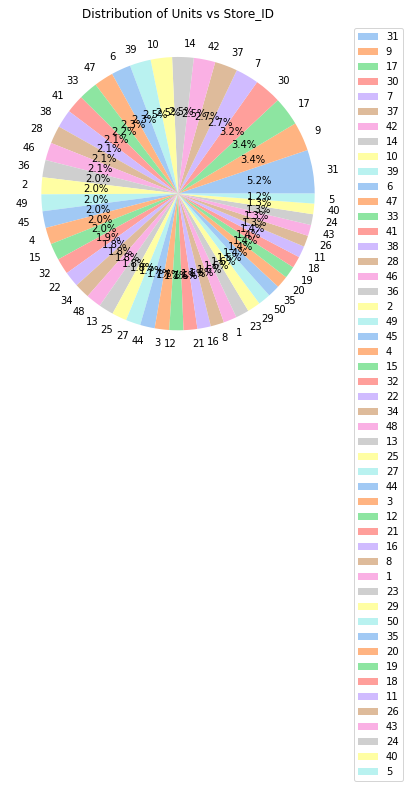

In [23]:
# Analisis general sin considerar el producto
# TIENDAS en que se venden más productos
df_grouped = eda.grouping(df = extreme, sorted_column_names="Store_ID", targetColumn = "Units", procedure = 1, graph = 2)
df_grouped = df_grouped.reset_index()

##### Ubicación de las tiendas con mayores unidades vendidas

In [24]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Store"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
df_aux = stores[['Store_ID', 'Store_Name', 'Store_City', 'Store_Location']]

# Importar las columnas seleccionadas basadas en el Store_id
df_grouped = pd.merge(df_grouped, df_aux, on='Store_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_grouped.head(10)

,Store_ID,Units,Store_Name,Store_City,Store_Location
0,31,20741,Maven Toys Ciudad de Mexico 2,Cuidad de Mexico,Airport
1,9,13730,Maven Toys Ciudad de Mexico 1,Cuidad de Mexico,Downtown
2,17,13646,Maven Toys Toluca 1,Toluca,Downtown
3,30,12858,Maven Toys Guadalajara 3,Guadalajara,Airport
4,7,10979,Maven Toys Monterrey 2,Monterrey,Downtown
5,37,10810,Maven Toys Ciudad de Mexico 3,Cuidad de Mexico,Residential
6,42,10208,Maven Toys Hermosillo 3,Hermosillo,Commercial
7,14,10196,Maven Toys Guanajuato 1,Guanajuato,Downtown
8,10,10157,Maven Toys Campeche 1,Campeche,Downtown
9,39,9982,Maven Toys Xalapa 2,Xalapa,Downtown


##### Fechas del año con mayores ventas

Date
2018-04-30    2775
2018-03-30    2052
2018-03-18    1747
2017-12-24    1718
2018-03-29    1645
2018-02-03    1623
2018-03-24    1574
2018-03-10    1573
2018-04-14    1563
2018-03-17    1560
2018-04-07    1539
2018-04-22    1528
2018-06-03    1506
2018-06-02    1495
2018-05-20    1478
2017-04-30    1456
2018-04-08    1448
2018-01-06    1441
2018-04-29    1426
2018-03-03    1417
Name: Units, dtype: int64


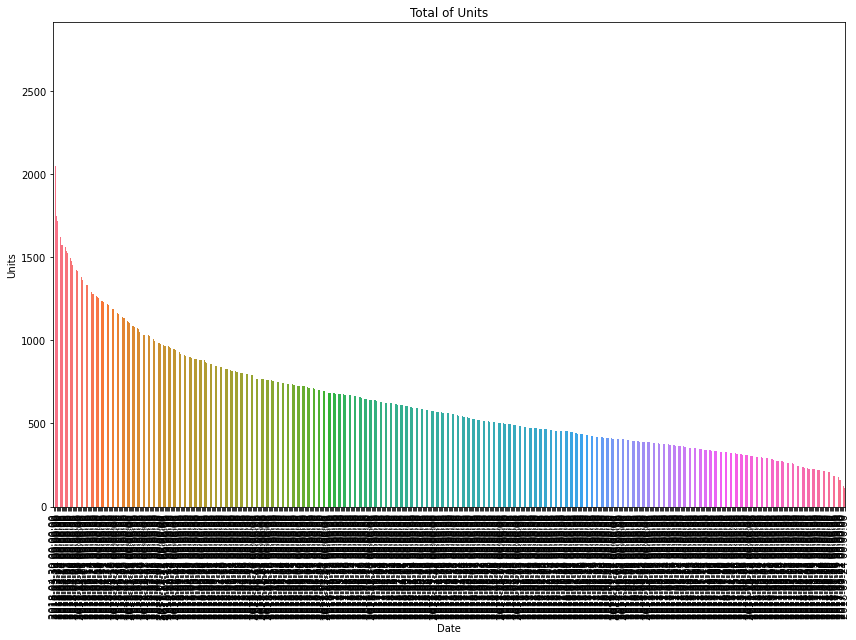

In [25]:
df_grouped = eda.grouping(df = extreme, sorted_column_names="Date", targetColumn = "Units", procedure = 1, graph = 1)
df_grouped = df_grouped.reset_index()

##### Meses del año con mayores ventas

Date
2018-03-31    29710
2017-12-31    26770
2018-04-30    26620
2018-06-30    24237
2018-07-31    23641
2018-05-31    23565
2018-02-28    21521
2018-01-31    21157
2017-11-30    18553
2017-06-30    17861
2017-04-30    17679
2017-10-31    17531
2017-07-31    17218
2018-08-31    16397
2018-09-30    16327
2017-05-31    15581
2017-09-30    14353
2017-03-31    13468
2017-08-31    13361
2017-01-31    13188
Name: Units, dtype: int64


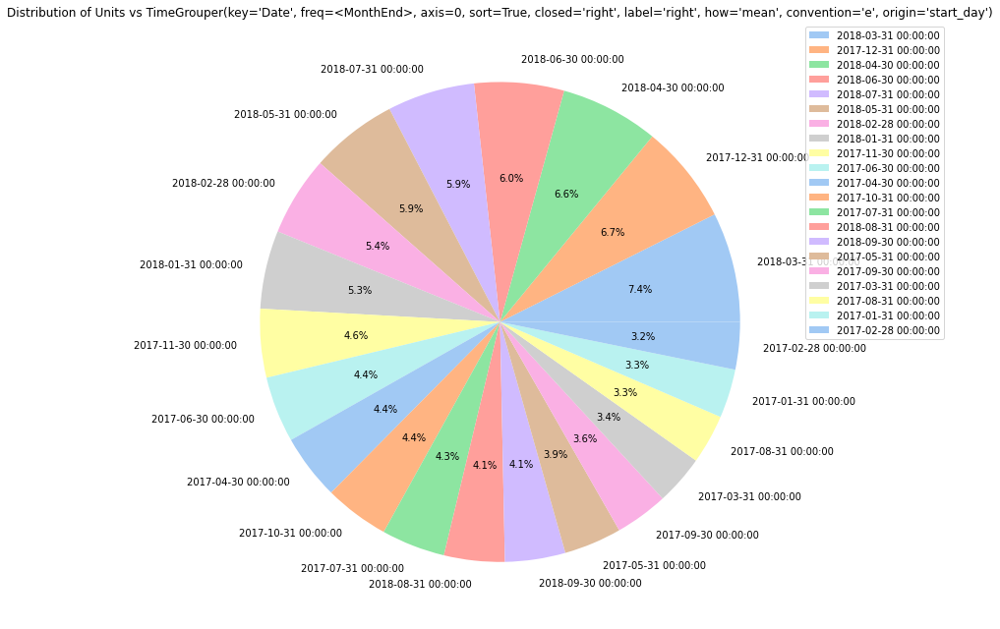

In [26]:
df_grouped = eda.grouping(df = df_grouped, sorted_column_names=pd.Grouper(key='Date', freq='M'), targetColumn = "Units", procedure = 1, graph = 2)

##### ¿Cuáles son las tiendas que más venden y en qué mes del año se vende más en cada ciudad?

In [27]:
df_grouped = eda.grouping(df = extreme, sorted_column_names=["Store_ID", pd.Grouper(key='Date', freq='M')], targetColumn = "Units", procedure = 1, graph = 0)
df_grouped = df_grouped.reset_index()

Store_ID  Date      
33        2018-04-30    1367
10        2017-12-31    1346
31        2018-07-31    1337
          2018-04-30    1325
          2018-03-31    1231
37        2018-03-31    1216
31        2017-06-30    1212
9         2018-06-30    1181
37        2018-04-30    1177
31        2017-07-31    1174
17        2017-12-31    1173
47        2017-07-31    1103
31        2017-11-30    1080
7         2018-04-30    1066
31        2017-10-31    1066
45        2018-03-31    1062
31        2018-06-30    1057
36        2017-12-31    1042
30        2018-05-31    1032
31        2018-05-31    1031
Name: Units, dtype: int64


##### Meses en que más se vende en cada ciudad

In [28]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Store"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
df_aux = stores[['Store_ID', 'Store_City']]

# Importar las columnas seleccionadas basadas en el Store_id
df_grouped = pd.merge(df_grouped, df_aux, on='Store_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_grouped.head(10)

,Store_ID,Date,Units,Store_City
0,33,2018-04-30,1367,Monterrey
1,10,2017-12-31,1346,Campeche
2,31,2018-07-31,1337,Cuidad de Mexico
3,31,2018-04-30,1325,Cuidad de Mexico
4,31,2018-03-31,1231,Cuidad de Mexico
5,37,2018-03-31,1216,Cuidad de Mexico
6,31,2017-06-30,1212,Cuidad de Mexico
7,9,2018-06-30,1181,Cuidad de Mexico
8,37,2018-04-30,1177,Cuidad de Mexico
9,31,2017-07-31,1174,Cuidad de Mexico


In [29]:
# Frecuencia por ciudad
store_month = eda.grouping(df = df_grouped, sorted_column_names=["Store_City", pd.Grouper(key='Date', freq='M')], targetColumn = "Units", procedure = 1, graph = 0)
store_month = store_month.reset_index()

Store_City        Date      
Cuidad de Mexico  2018-03-31    4399
                  2018-04-30    4000
Monterrey         2018-04-30    3684
Cuidad de Mexico  2018-06-30    3358
                  2018-07-31    3213
                  2018-05-31    3090
                  2017-12-31    3030
                  2018-02-28    2936
                  2017-04-30    2697
                  2017-06-30    2656
Guadalajara       2018-05-31    2535
Cuidad de Mexico  2017-11-30    2526
                  2018-01-31    2462
Monterrey         2018-06-30    2453
Guadalajara       2018-03-31    2441
                  2018-02-28    2255
Monterrey         2018-07-31    2252
                  2017-07-31    2200
                  2017-12-31    2198
                  2018-03-31    2185
Name: Units, dtype: int64


In [30]:
top_month_store = store_month.drop_duplicates(subset='Store_City', keep='first')
print(top_month_store)
#print(len(top_month_store))

           Store_City       Date  Units
0    Cuidad de Mexico 2018-03-31   4399
2           Monterrey 2018-04-30   3684
10        Guadalajara 2018-05-31   2535
26         Guanajuato 2018-03-31   1979
31           Campeche 2017-12-31   1912
33         Hermosillo 2018-06-30   1879
55             Toluca 2018-03-31   1525
56             Puebla 2018-05-31   1514
70           Mexicali 2018-03-31   1359
74             Xalapa 2018-05-31   1324
80          Chihuahua 2017-12-31   1266
99           Saltillo 2018-03-31   1116
112           Morelia 2017-12-31   1042
164           Pachuca 2018-03-31    819
170  Tuxtla Gutierrez 2017-12-31    805
172          Culiacan 2018-07-31    803
187          Santiago 2017-12-31    748
194   Ciudad Victoria 2018-03-31    733
207            Oaxaca 2018-01-31    687
227          Chetumal 2018-03-31    617
229      Chilpancingo 2018-05-31    614
239         Zacatecas 2018-03-31    585
258   San Luis Potosi 2018-01-31    523
264      Villahermosa 2018-06-30    505


##### ¿Cómo es el comportamiento de las unidades vendidas por estado?

In [31]:
#Ordenamos el dataframe
df = df.sort_values('Date')
df.head(10)

,Sale_ID,Date,Store_ID,Product_ID,Units
0,1,2017-01-01,24,4,1
1,2,2017-01-01,28,1,1
2,3,2017-01-01,6,8,1
3,4,2017-01-01,48,7,1
4,5,2017-01-01,44,18,1
5,6,2017-01-01,1,31,1
6,7,2017-01-01,40,7,1
7,8,2017-01-01,19,2,1
8,9,2017-01-01,38,21,1
9,10,2017-01-01,21,8,1


In [32]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Store"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
df_aux = stores[['Store_ID', 'Store_City']]

# Importar las columnas seleccionadas basadas en el Store_id
df_aux = pd.merge(df, df_aux, on='Store_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_aux.head(10)

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City
0,1,2017-01-01,24,4,1,Aguascalientes
1,2,2017-01-01,28,1,1,Puebla
2,3,2017-01-01,6,8,1,Mexicali
3,4,2017-01-01,48,7,1,Saltillo
4,5,2017-01-01,44,18,1,Puebla
5,6,2017-01-01,1,31,1,Guadalajara
6,7,2017-01-01,40,7,1,Toluca
7,8,2017-01-01,19,2,1,Puebla
8,9,2017-01-01,38,21,1,Chihuahua
9,10,2017-01-01,21,8,1,Santiago


C:\Users\DELL\AppData\Local\Temp\ipykernel_13588\177205588.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2, figsize=(20,8))


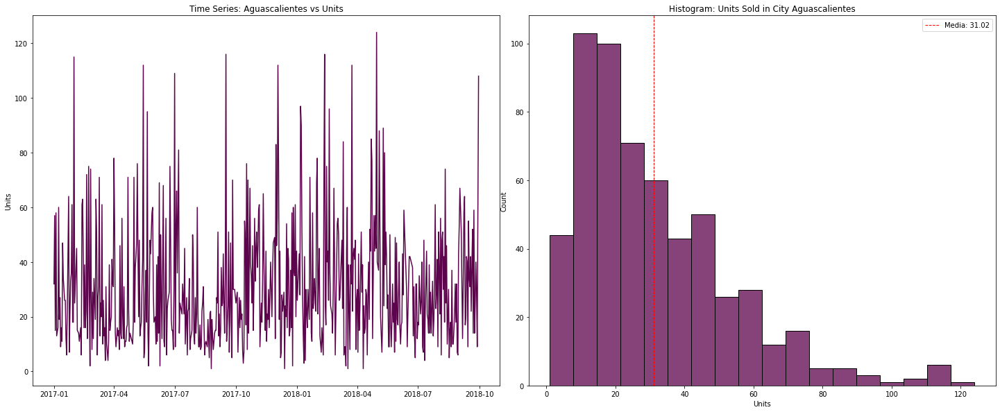

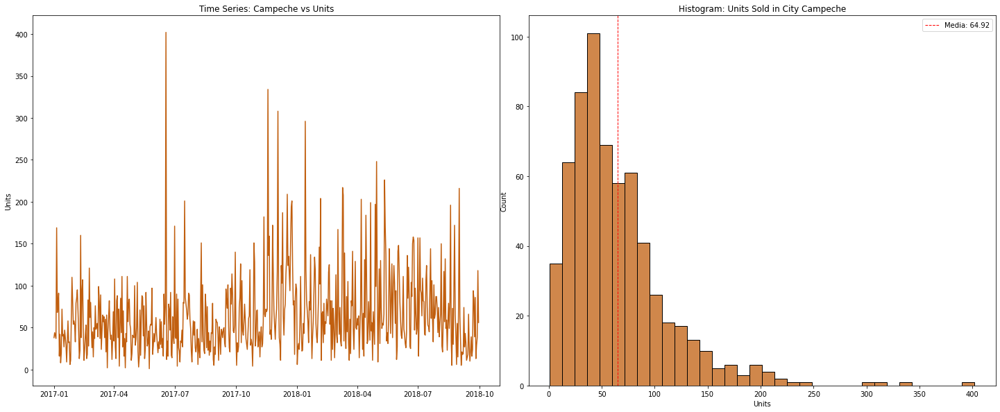

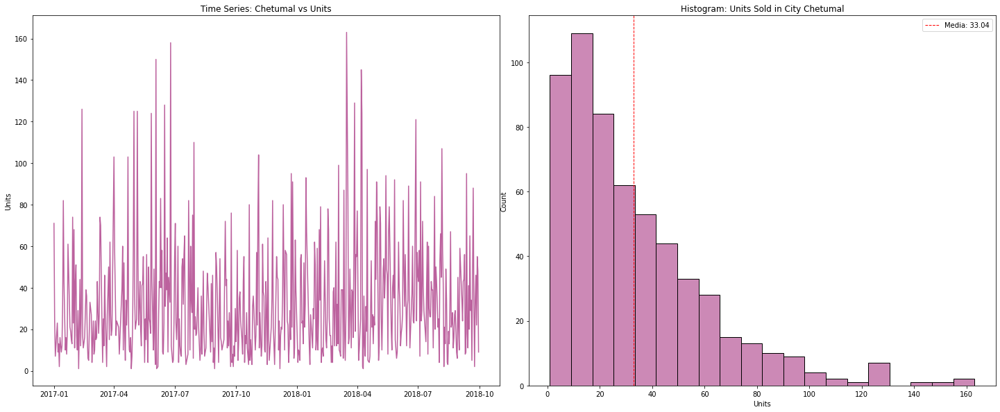

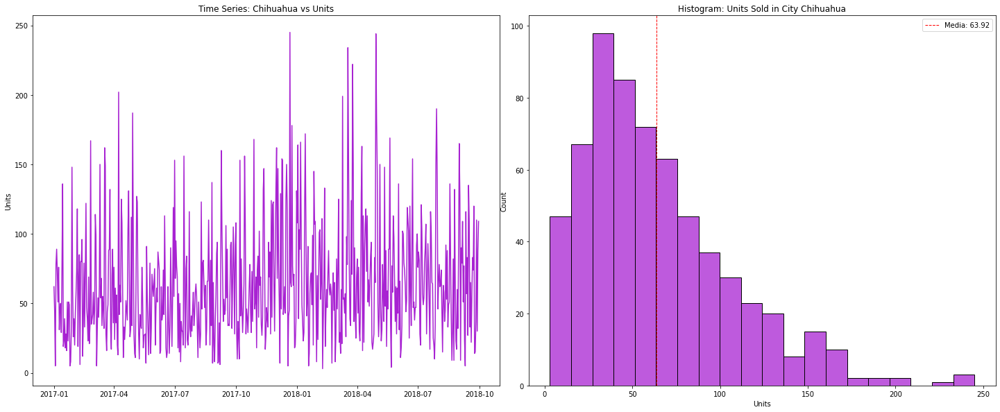

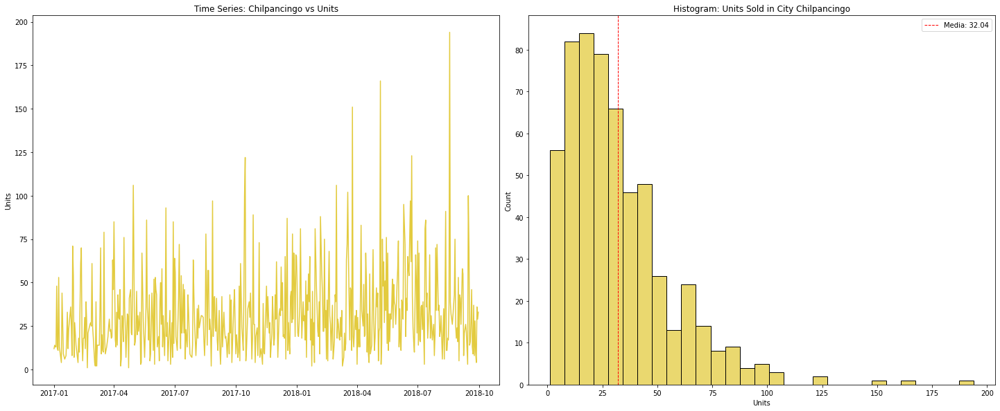

...

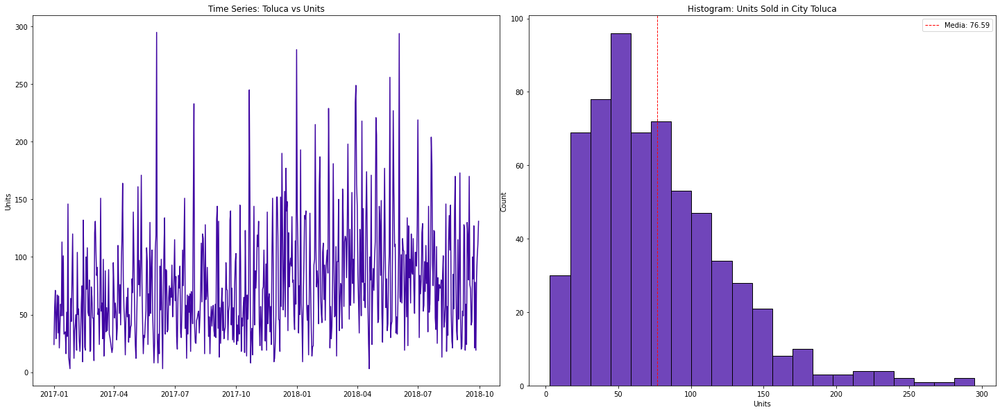

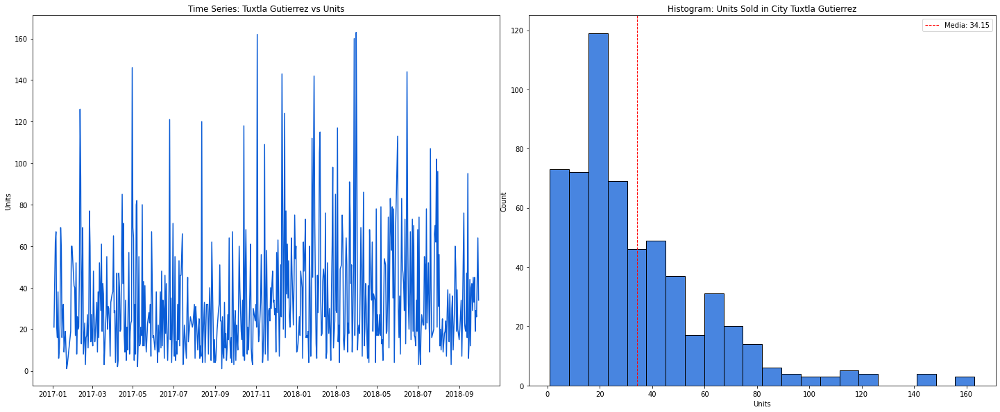

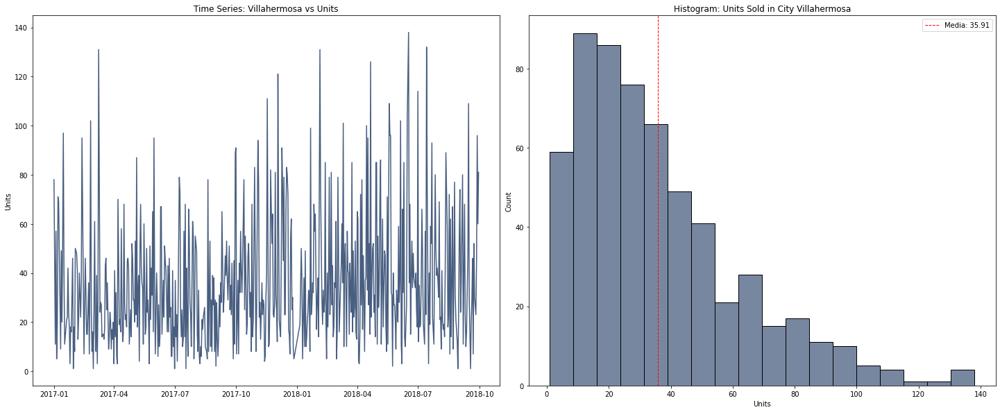

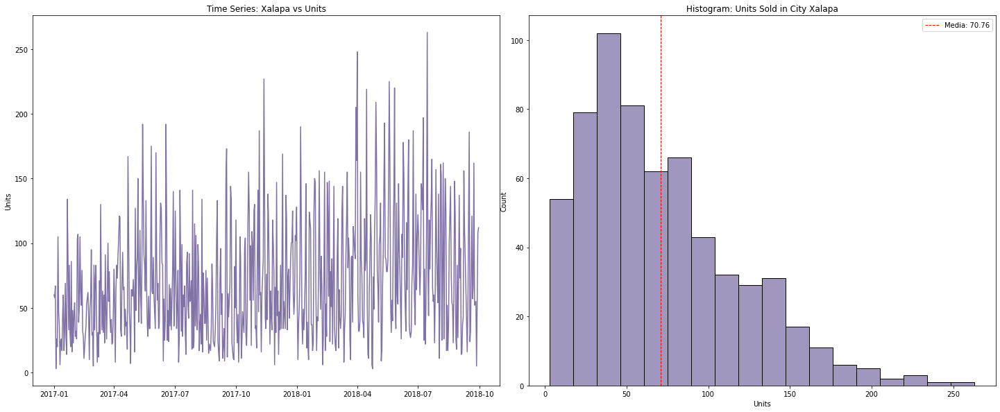

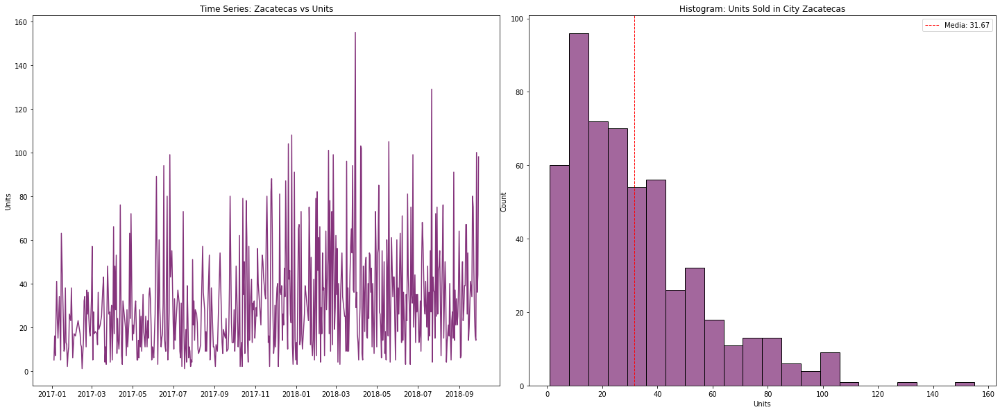

In [33]:
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Units'
unique_values_feature = np.sort(df_aux[feature_name].unique())

for i in range(1,len(unique_values_feature)+1):
    
    #define subplots
    fig, ax = plt.subplots(1, 2, figsize=(20,8))
    fig.tight_layout()
    
    color = generar_color_hex_aleatorio()
    
    df_store = df_aux[df_aux[feature_name] == unique_values_feature[i-1]]
    
    unique_dates = sorted(df_store[time_column_name].unique())
    sum = df_store.groupby(time_column_name)[grouping_feature].sum()
    #print(promedio)

    #percent = round((len(df_state) / len(df)) * 100, 2)
    
    # Graficos
    ax[0].set(title=f"Time Series: {unique_values_feature[i-1]} vs {grouping_feature}")
    ax[1].set(title=f"Histogram: {grouping_feature} Sold in City {unique_values_feature[i-1]}")
    _ = sns.lineplot(x=unique_dates, y=sum, ax= ax[0], color = color)
    _ = sns.histplot(x=sum, ax= ax[1], color = color)
    #print(len(unique_dates))
    #print(len(sum))
    media = (np.sum(sum)/len(sum))
    ax[1].axvline(media, color='red', linestyle='dashed', linewidth=1, label = "Media")
    ax[1].legend(labels=['Media: {}'.format(round(media,2))])

    
#print(unique_values_feature[len(unique_values_feature)-1])
plt.show()

### Operation_profit

El monto de unidades vendidas por sí solo es un indicador de actividad comercial constante, pero un gran número de unidades vendidas no necesariamente representan un gran margen de ganancias para la empresa. Más allá de las unidades vendidas, las ganancias por cada transacción y el acumulado de tales ventas nos permiten saber realmente los beneficios para la empresa de la actividad comercial de la empresa. Por ende, se optó por generar tal columna a partir de los costos y precio de ventas de los productos para obetener un indicador más claro sobre la situación de perdidas o ganancias de la empresa.

In [34]:
# Generación de la columna de ganancias por producto en la dimensión 'Stores'
products['Profit_per_unit'] = products['Product_Price'] - products['Product_Cost']
products.head(10)

,Product_ID,Product_Name,Product_Category,Product_Cost,Product_Price,Profit_per_unit
0,1,Action Figure,Toys,9.99,15.99,6.0
1,2,Animal Figures,Toys,9.99,12.99,3.0
2,3,Barrel O' Slime,Art & Crafts,1.99,3.99,2.0
3,4,Chutes & Ladders,Games,9.99,12.99,3.0
4,5,Classic Dominoes,Games,7.99,9.99,2.0
5,6,Colorbuds,Electronics,6.99,14.99,8.0
6,7,Dart Gun,Sports & Outdoors,11.99,15.99,4.0
7,8,Deck Of Cards,Games,3.99,6.99,3.0
8,9,Dino Egg,Toys,9.99,10.99,1.0
9,10,Dinosaur Figures,Toys,10.99,14.99,4.0


In [35]:
# Incorporación de la columna de Profit_per_unit en la columna de ventas para calcular el margen de ganancias por operación
diccionario_mapeo = dict(products[['Product_ID', 'Profit_per_unit']].values)
df_aux['Profit_per_unit'] = df_aux['Product_ID'].map(diccionario_mapeo)
df_aux.head(10)

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit
0,1,2017-01-01,24,4,1,Aguascalientes,3.0
1,2,2017-01-01,28,1,1,Puebla,6.0
2,3,2017-01-01,6,8,1,Mexicali,3.0
3,4,2017-01-01,48,7,1,Saltillo,4.0
4,5,2017-01-01,44,18,1,Puebla,5.0
5,6,2017-01-01,1,31,1,Guadalajara,1.0
6,7,2017-01-01,40,7,1,Toluca,4.0
7,8,2017-01-01,19,2,1,Puebla,3.0
8,9,2017-01-01,38,21,1,Chihuahua,3.0
9,10,2017-01-01,21,8,1,Santiago,3.0


In [36]:
# Generación de la columna de Operation_profit a partir de la columna de unidades vendidas y la ganancia por product
df_aux['Operation_profit'] = df_aux['Units'] * df_aux['Profit_per_unit']
df_aux.sample(10)

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit,Operation_profit
222604,222605,2017-07-22,21,16,1,Santiago,7.0,7.0
567490,567496,2018-04-09,45,8,1,Cuidad de Mexico,3.0,3.0
80778,80783,2017-03-22,17,1,1,Toluca,6.0,6.0
121440,121442,2017-04-29,30,2,1,Guadalajara,3.0,3.0
464013,464033,2018-02-01,24,9,1,Aguascalientes,1.0,1.0
382469,382445,2017-12-08,44,25,1,Puebla,1.0,1.0
563333,563334,2018-04-07,29,30,1,Xalapa,2.0,2.0
576022,576035,2018-04-15,40,25,2,Toluca,1.0,2.0
664629,664632,2018-06-10,12,21,1,Chetumal,3.0,3.0
789093,789093,2018-09-01,8,31,1,Pachuca,1.0,1.0


##### ¿Cuáles son las ciudades que mayores ganancias le generan a la marca? 

Store_City
Cuidad de Mexico    465558.0
Guadalajara         368930.0
Monterrey           346729.0
Hermosillo          263608.0
Guanajuato          235047.0
Puebla              229694.0
Mexicali            175048.0
Xalapa              163720.0
Saltillo            163248.0
Toluca              162702.0
Chihuahua           146868.0
Campeche            146339.0
Morelia              90484.0
Ciudad Victoria      83088.0
Villahermosa         74221.0
Santiago             72922.0
San Luis Potosi      68880.0
Aguascalientes       68642.0
Chetumal             67940.0
Chilpancingo         66558.0
Name: Operation_profit, dtype: float64


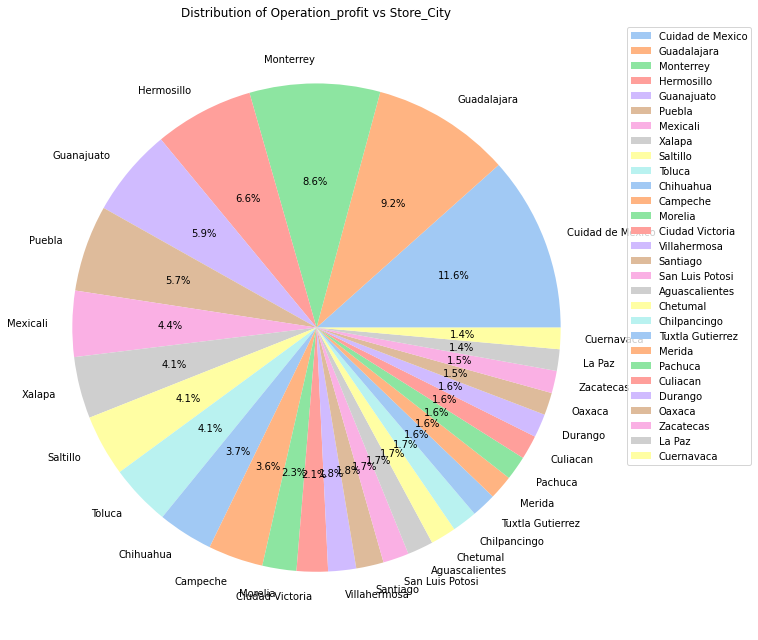

In [37]:
df_grouped = eda.grouping(df_aux, 'Store_City', 'Operation_profit', procedure = 1, graph = 2)
df_grouped = df_grouped.reset_index()

##### Meses con mayores ventas por ciudad

In [38]:
df_grouped = eda.grouping(df_aux, ['Store_City', pd.Grouper(key='Date', freq='M')], 'Operation_profit', procedure = 1, graph = 0)
df_grouped = df_grouped.reset_index()

Store_City        Date      
Cuidad de Mexico  2018-03-31    28534.0
                  2017-12-31    26853.0
                  2018-04-30    26427.0
                  2018-05-31    25443.0
                  2017-06-30    24627.0
                  2018-06-30    24370.0
                  2018-01-31    24283.0
                  2018-07-31    24032.0
                  2018-02-28    23682.0
                  2017-04-30    22647.0
                  2017-05-31    22597.0
                  2017-11-30    22515.0
                  2017-07-31    22217.0
Guadalajara       2017-12-31    21907.0
                  2018-05-31    21774.0
Monterrey         2018-04-30    21645.0
                  2018-07-31    20246.0
Guadalajara       2018-07-31    20024.0
Cuidad de Mexico  2017-10-31    19748.0
Monterrey         2017-12-31    19040.0
Name: Operation_profit, dtype: float64


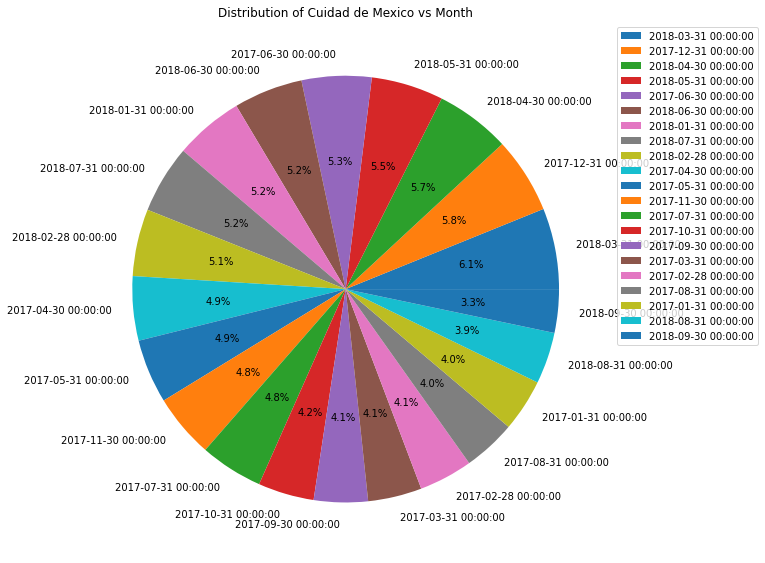

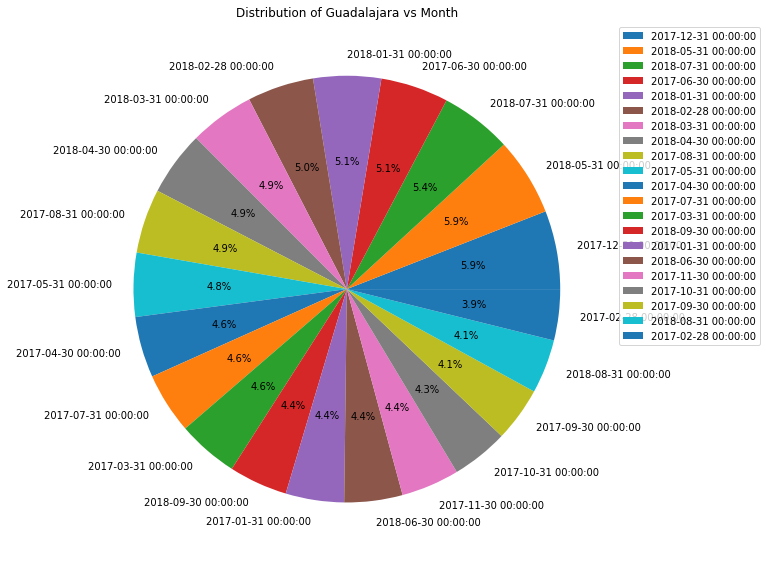

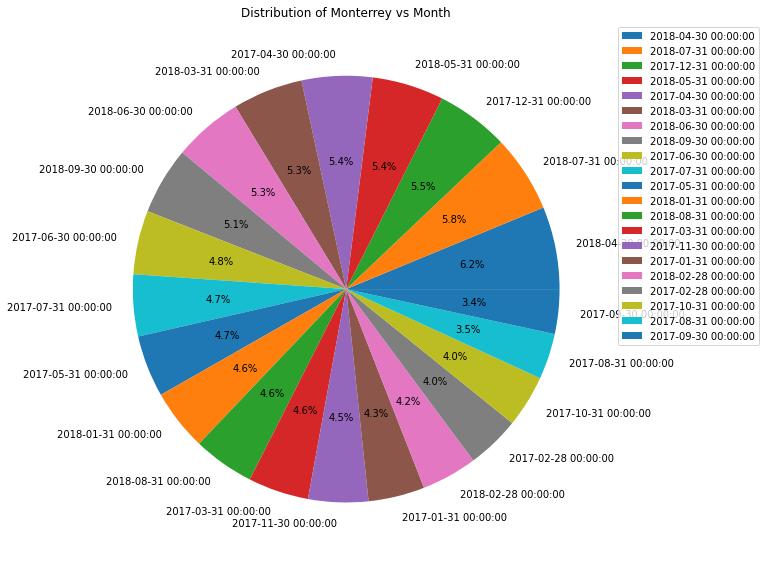

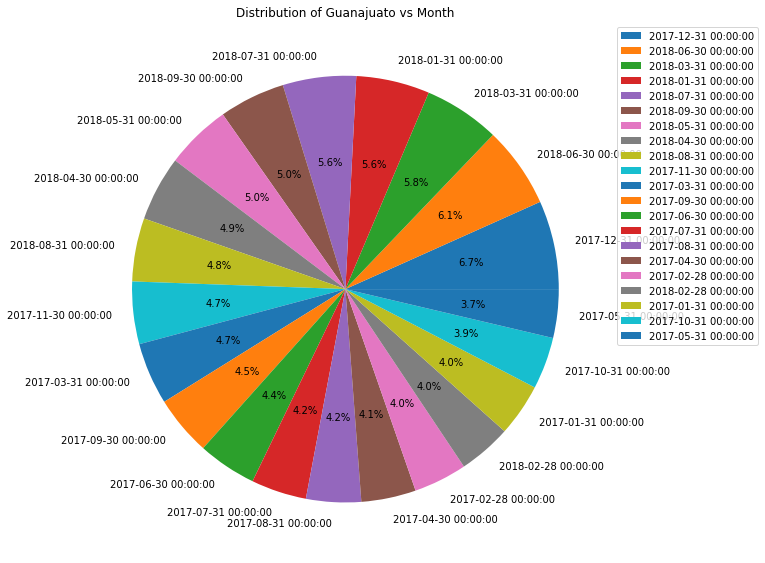

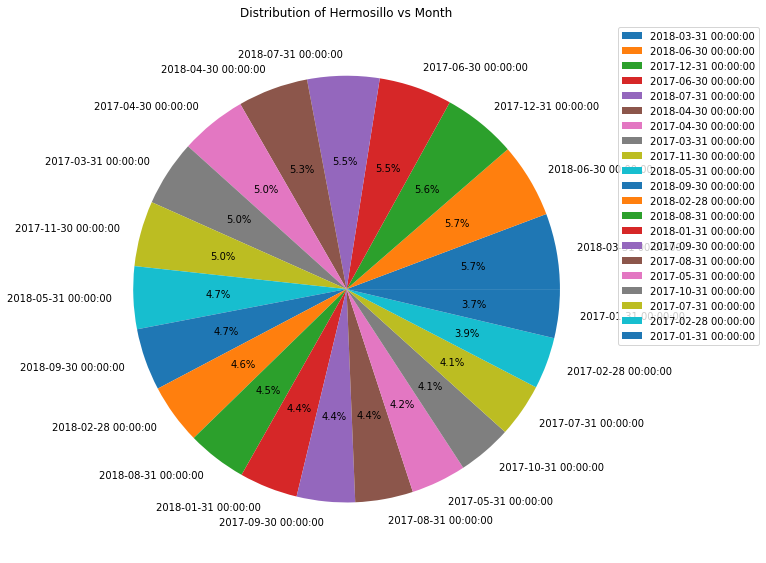

...

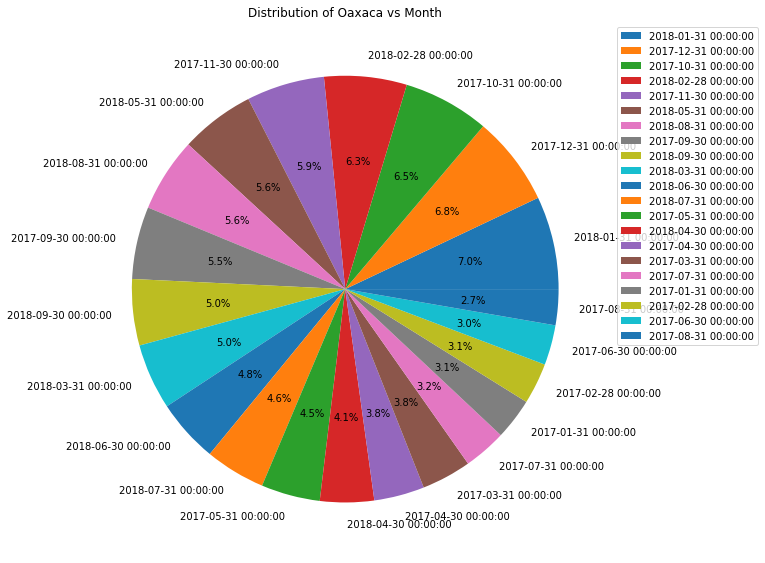

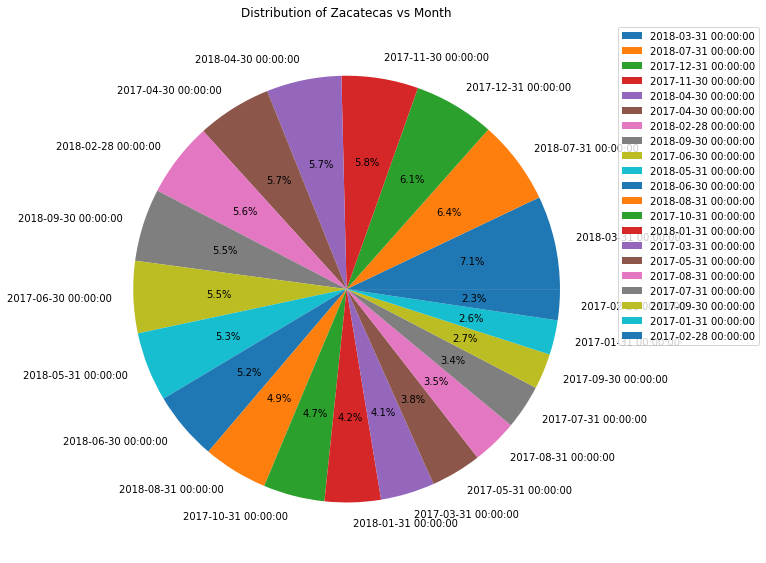

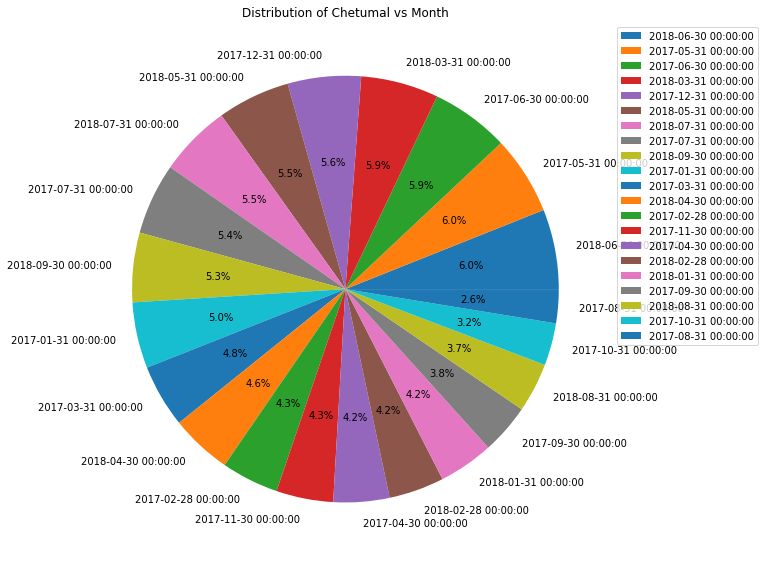

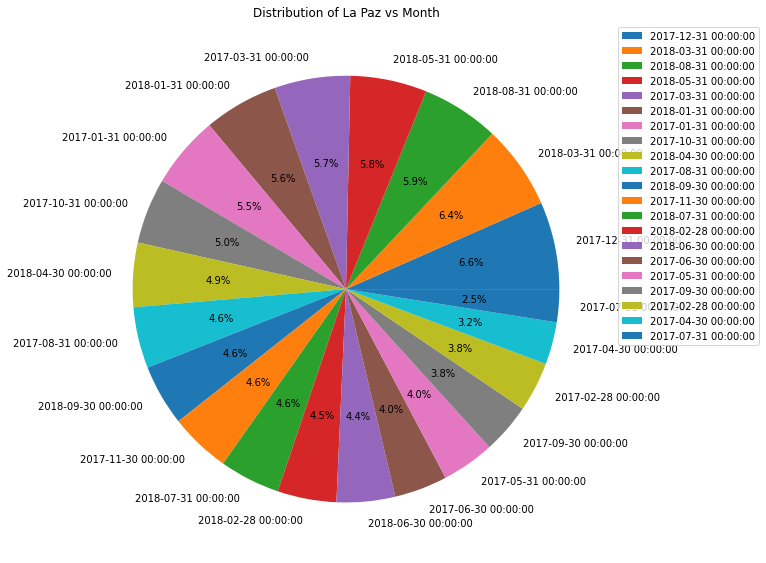

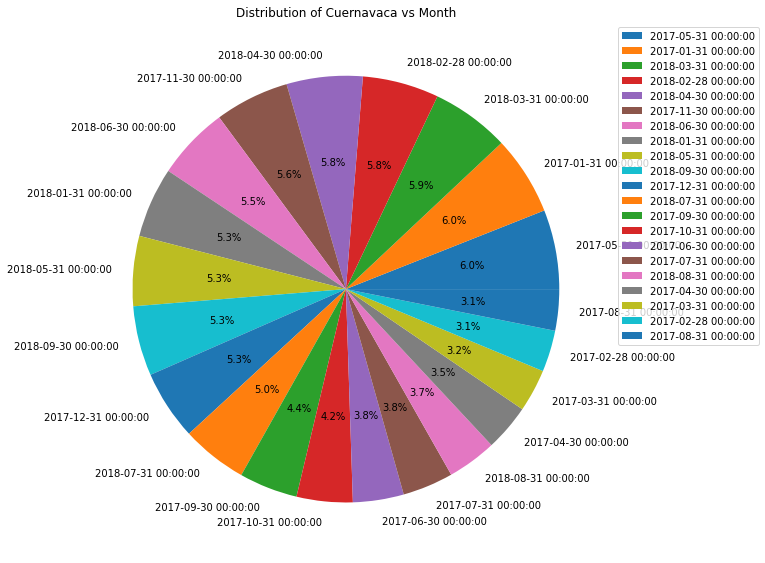

In [39]:
cities_unique = df_grouped['Store_City'].unique()
for city in cities_unique:
    df_sample = df_grouped[df_grouped['Store_City'] == city]
    # Crear una lista de colores utilizando la función color_palette
    colores = sns.color_palette("pastel", len(df_sample))

    fig, ax = plt.subplots(1, 1, figsize=(30,8))
    fig.tight_layout()
    # Plotear el diagrama de pastel
    plt.pie(df_sample['Operation_profit'].values, labels=df_sample['Date'], autopct='%1.1f%%')

    #df_sample['Date'].plot(kind='pie', autopct='%1.1f%%', colors=colores)

    plt.title(f'Distribution of {city} vs Month')
    plt.ylabel('')

    # Crear la leyenda
    plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
    # A1justar el espacio de despliegue
    #plt.tight_layout()
    plt.show()

¿A qué se debe el sesgo en la distribución de las unidades vendidas? OUTLIERS

In [40]:
# Eleccion de las columnas numéricas
df_numeric = df.select_dtypes('number')
numericColumns = df_numeric.columns
print(numericColumns)

Index(['Units'], dtype='object')


Feature :  Units


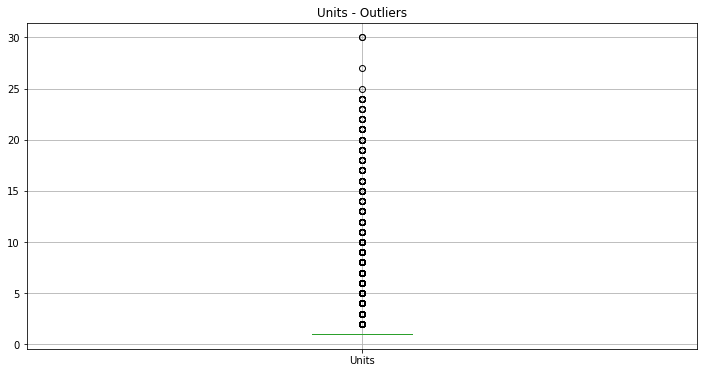

Cuartiles: 
0.25    1.0
0.50    1.0
0.75    1.0
Name: Units, dtype: float64
Percentiles: 
[1. 1. 1. 1. 1. 1. 1. 1. 3.]
Limites intercuartilicos
lof:  1.0
lif:  1.0
uif:  1.0
uof:  1.0
Outliers moderados:  []
Hay 0 registros correspondientes a los outliers moderados
Outliers extremos:  [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 30]
Hay 140239 registros correspondientes a los outliers extremos.
Total de registros : 829262


In [41]:
# Revisión de outliers
eda = EDA_Feature()
moderate, extreme = eda.checkOutliers(df,numericColumns[-1])
print(f'Total de registros : {len(df)}')

In [42]:
df['Units'].value_counts()

1     689023
3      65638
2      54576
4      13117
6       2808
5       2628
7        779
9        203
8        180
10        96
11        36
12        35
13        25
15        18
17        13
21        12
16        12
19        11
18        10
20        10
14         9
24         7
22         7
23         5
30         2
27         1
25         1
Name: Units, dtype: int64

In [43]:
porcentaje_outliers = len(extreme)/len(df)
print("El porcentaje de ventas que corresponde a los outliers es: ", round((porcentaje_outliers*100),2), "%")

El porcentaje de ventas que corresponde a los outliers es:  16.91 %


#### Observaciones

No existen outliers negativos. Todos los outliers representan unidades vendidas superiores al resto de las tiendas.
Dichos outliers superiores no son poco realistas. Por lo anterior, se ha decidido no eliminarlos en este momento, ya que aportan información importante sobre las tiendas, productos más vendidos y en qué fechas sucede esto. A partir de lo anterior, se podrían definir estrategias de mercadotecnia o inversión en las tiendas que menos se venden. De tal suerte que si se neutralizan los outliers, en este momento, se perdería tal información. 

## Ejemplo 1: Ciudades

- ¿Cuáles es la causa de que en algunas ciudades se esté generando una distribución anormal de los residuos?
(Ej. Ventas diferenciadas por tiendas, exitosa venta de un juguete, etc)

- ¿Cómo se espera que sean las ganancias provenientes de cada ciudad? ¿Cuál es la tendencia de las ganancias por ciudad?

### Caso 1: Oaxaca

Hipótesis 1: Número de tiendas

In [44]:
# Contar el numero de tiendas en cada estado
state_frequency = stores['Store_City'].value_counts()
print("Tiendas por ciudad")
print(state_frequency)

Tiendas por ciudad
Guadalajara         4
Monterrey           4
Cuidad de Mexico    4
Guanajuato          3
Puebla              3
Hermosillo          3
Toluca              2
Xalapa              2
Chihuahua           2
Campeche            2
Mexicali            2
Saltillo            2
Aguascalientes      1
Chilpancingo        1
Morelia             1
Durango             1
Oaxaca              1
Ciudad Victoria     1
Villahermosa        1
Merida              1
Santiago            1
Zacatecas           1
San Luis Potosi     1
Tuxtla Gutierrez    1
Chetumal            1
Cuernavaca          1
Pachuca             1
La Paz              1
Culiacan            1
Name: Store_City, dtype: int64


En Oaxaca solo hay una sucursal de la tienda, por ende, los outliers en los residuales solo provienen de una única fuente.

Hipótesis 2: Productos específicos

In [45]:
df_grouped = eda.grouping(df_aux, ['Store_City', 'Product_ID', 'Date'], 'Operation_profit', procedure = 1, graph = 0)
df_grouped = df_grouped.reset_index()

Store_City        Product_ID  Date      
Campeche          22          2017-06-18    2010.0
Hermosillo        6           2017-03-10    1544.0
Guanajuato        18          2018-03-10    1385.0
Monterrey         6           2017-01-28    1376.0
Morelia           14          2018-02-07    1200.0
Hermosillo        6           2018-04-16    1152.0
Monterrey         14          2018-04-30     990.0
Guadalajara       6           2017-01-02     984.0
Campeche          6           2017-07-16     976.0
Morelia           14          2017-11-29     945.0
                              2018-01-30     930.0
Hermosillo        6           2017-08-31     904.0
Campeche          6           2017-02-10     864.0
Morelia           14          2017-11-01     835.0
Mexicali          6           2017-01-08     824.0
Cuidad de Mexico  6           2017-04-19     800.0
Hermosillo        6           2017-01-30     784.0
Campeche          6           2017-09-25     768.0
Cuidad de Mexico  6           2017-02-05 

In [46]:
cities = df_aux['Store_City'].unique()
objetivo = 'Oaxaca'
grouping_feature = 'Operation_profit'

df_grouped = df_grouped[df_grouped['Store_City'] == objetivo]
df_grouped  = df_grouped.sort_values(grouping_feature, ascending = False)
#df_grouped.head(50)
print(df_grouped.head(10))
print(df_grouped.tail(10))
print(f"Ganancia promedio por venta en {objetivo}:", np.mean(df_grouped[grouping_feature]))

     Store_City Product_ID       Date  Operation_profit
92       Oaxaca         28 2018-08-31             567.0
170      Oaxaca          1 2018-08-23             492.0
273      Oaxaca          6 2017-03-06             432.0
1109     Oaxaca          7 2017-01-06             272.0
1632     Oaxaca         18 2017-09-06             235.0
1740     Oaxaca         23 2018-01-06             230.0
2062     Oaxaca         18 2018-03-10             215.0
2116     Oaxaca         14 2017-11-05             210.0
2134     Oaxaca          1 2017-01-18             210.0
2135     Oaxaca         18 2017-09-29             210.0
      Store_City Product_ID       Date  Operation_profit
77573     Oaxaca         30 2017-12-03               2.0
77281     Oaxaca         27 2018-06-29               2.0
77267     Oaxaca          3 2017-09-05               2.0
77247     Oaxaca         27 2018-06-21               2.0
77195     Oaxaca         19 2018-01-10               2.0
77120     Oaxaca          3 2017-11-08    

In [47]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Products"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
selected_features = products[['Product_ID', 'Product_Category']]

# Importar las columnas seleccionadas basadas en el Store_id
df_grouped = pd.merge(df_grouped, selected_features, on='Product_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_grouped.head(10)

,Store_City,Product_ID,Date,Operation_profit,Product_Category
0,Oaxaca,28,2018-08-31,567.0,Art & Crafts
1,Oaxaca,1,2018-08-23,492.0,Toys
2,Oaxaca,6,2017-03-06,432.0,Electronics
3,Oaxaca,7,2017-01-06,272.0,Sports & Outdoors
4,Oaxaca,18,2017-09-06,235.0,Toys
5,Oaxaca,23,2018-01-06,230.0,Toys
6,Oaxaca,18,2018-03-10,215.0,Toys
7,Oaxaca,14,2017-11-05,210.0,Games
8,Oaxaca,1,2017-01-18,210.0,Toys
9,Oaxaca,18,2017-09-29,210.0,Toys


In [48]:
df_grouped = eda.grouping(df_grouped, ['Store_City', 'Product_ID', 'Product_Category'], 'Operation_profit', procedure = 1, graph = 0)
df_grouped = df_grouped.reset_index()

Store_City  Product_ID  Product_Category 
Oaxaca      6           Electronics          6832.0
            18          Toys                 6405.0
            3           Art & Crafts         6310.0
            1           Toys                 6048.0
            8           Games                3720.0
            19          Art & Crafts         3126.0
            2           Toys                 2841.0
            14          Games                2740.0
            30          Games                1940.0
            7           Sports & Outdoors    1904.0
            34          Electronics          1855.0
            16          Games                1631.0
            28          Art & Crafts         1561.0
            11          Art & Crafts         1380.0
            17          Art & Crafts         1374.0
            24          Sports & Outdoors    1280.0
            25          Art & Crafts         1253.0
            10          Toys                 1192.0
            9         

In [49]:
df_grouped.head(5)

,Store_City,Product_ID,Product_Category,Operation_profit
0,Oaxaca,6,Electronics,6832.0
1,Oaxaca,18,Toys,6405.0
2,Oaxaca,3,Art & Crafts,6310.0
3,Oaxaca,1,Toys,6048.0
4,Oaxaca,8,Games,3720.0


In [50]:
df_grouped = eda.grouping(df_aux, ['Store_City', 'Product_ID'], 'Units', procedure = 2, graph = 0)
df_grouped = df_grouped.reset_index()

Store_City        Product_ID
Cuidad de Mexico  8             7634
                  6             7465
Guadalajara       6             6815
Monterrey         6             6411
Cuidad de Mexico  25            6198
Hermosillo        6             6036
Cuidad de Mexico  3             5990
Guadalajara       25            5849
Monterrey         8             5712
Cuidad de Mexico  1             5705
Monterrey         25            5325
Cuidad de Mexico  18            5236
Guadalajara       1             5120
Monterrey         31            4901
Puebla            6             4734
Guadalajara       8             4585
Guanajuato        8             4578
Guadalajara       3             4551
                  30            4529
Cuidad de Mexico  31            4491
Name: Units, dtype: int64


In [51]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Products"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
selected_features = products[['Product_ID', 'Product_Category']]

# Importar las columnas seleccionadas basadas en el Store_id
df_grouped = pd.merge(df_grouped, selected_features, on='Product_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_grouped.head(10)

,Store_City,Product_ID,Units,Product_Category
0,Cuidad de Mexico,8,7634,Games
1,Cuidad de Mexico,6,7465,Electronics
2,Guadalajara,6,6815,Electronics
3,Monterrey,6,6411,Electronics
4,Cuidad de Mexico,25,6198,Art & Crafts
5,Hermosillo,6,6036,Electronics
6,Cuidad de Mexico,3,5990,Art & Crafts
7,Guadalajara,25,5849,Art & Crafts
8,Monterrey,8,5712,Games
9,Cuidad de Mexico,1,5705,Toys


In [52]:
cities = df_aux['Store_City'].unique()
objetivo = 'Oaxaca'
grouping_feature = 'Units'

df_grouped = df_grouped[df_grouped['Store_City'] == objetivo]
df_grouped = df_grouped.sort_values(grouping_feature, ascending=False)
df_grouped.head(30)

,Store_City,Product_ID,Units,Product_Category
142,Oaxaca,3,1563,Art & Crafts
244,Oaxaca,18,1077,Toys
251,Oaxaca,8,1034,Games
253,Oaxaca,19,1021,Art & Crafts
299,Oaxaca,1,859,Toys
308,Oaxaca,25,837,Art & Crafts
314,Oaxaca,30,825,Games
325,Oaxaca,2,787,Toys
332,Oaxaca,6,773,Electronics
347,Oaxaca,31,744,Sports & Outdoors


In [53]:
df_grouped = eda.grouping(df_grouped, ['Product_Category'], 'Units', procedure = 1, graph = 0)
df_grouped = df_grouped.reset_index()

Product_Category
Toys                 4217
Art & Crafts         4190
Games                2470
Sports & Outdoors    1857
Electronics          1223
Name: Units, dtype: int64


Conclusiones: En este caso, los outliers se deben a ventas de gran margen de ganancias en días específicos. Los productos más vendidos no coinciden con los que mayores ganancias generan a la compañía. Lo anterior nos habla de las preferencias regionales y del nivel socioeconómico del target en el estado. Por ende, se recomienda aumentar el abastecimiento de juguetes de bajo costo y limitar un poco los juguetes de alto costo. Lo anterior, aunque probablemente no aumente las ganancias de forma sustancial, sí lo hará de forma creciente y abriría la posibilidad a una futura expansión. A partir de los últimos resultados, se recomienda que los jueguetes a que se den prioridad sean aquellos de la categoría Toys y los juegos de Art y Crafts; en terce lugar, los Games o juegos de mesa

### Caso 2: Monterrey

In [54]:
# Tiendas en Monterrey
df_mty = stores[stores['Store_City']=='Monterrey']
df_mty

,Store_ID,Store_Name,Store_City,Store_Location,Store_Open_Date
1,2,Maven Toys Monterrey 1,Monterrey,Residential,1995-04-27
6,7,Maven Toys Monterrey 2,Monterrey,Downtown,2003-12-25
32,33,Maven Toys Monterrey 3,Monterrey,Airport,2013-03-17
46,47,Maven Toys Monterrey 4,Monterrey,Commercial,2015-11-21


#### Propuesta de solución 1: Ajuste de un modelo de prediccion de ganancias para la ciudad

#### División en conjunto de entrenamiento y de prueba

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             533.0
508 2018-05-24             396.0
509 2018-05-25             268.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             527.0
511 2018-05-27            1093.0
512 2018-05-28             513.0


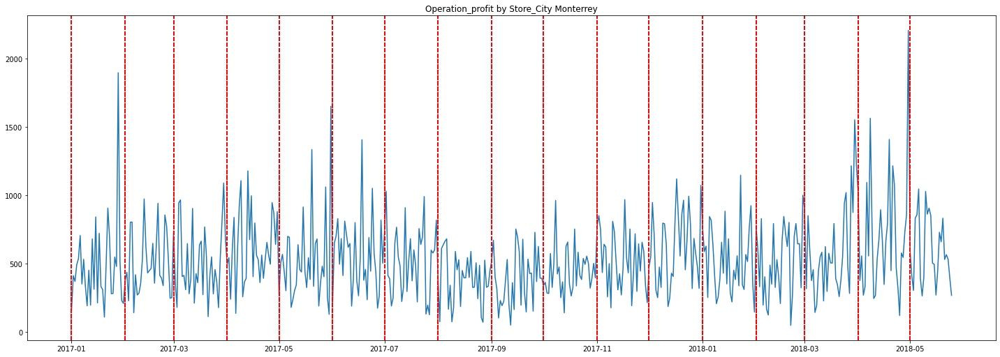

In [55]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Monterrey'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)


#### Estabilización de la varianza de la serie de tiempo

In [56]:
# Transformacion de raiz cuadrada
# df_train[grouping_feature] = np.sqrt(df_train[grouping_feature])
# df_test[grouping_feature] = np.sqrt(df_test[grouping_feature])

# Transformacion logaritmica
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Transformación de Box Cox
#Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.32620509676092196
0.5592470065536894


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [57]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 0.022010456843390445


#### Estacionariedad

In [58]:
# Generación de Parámetros
diff_type = ['inc']
cycle = 0

# Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
df_train_st = make_stationary(df_train, diff_type)
print(df_train_st.head(10))

         Date  Operation_profit
1  2017-01-02          5.834254
2  2017-01-03         -0.753164
3  2017-01-04          2.070810
4  2017-01-05          0.655239
5  2017-01-06          2.224337
6  2017-01-07         -5.310119
7  2017-01-08          3.013190
8  2017-01-09         -3.306573
9  2017-01-10         -3.440587
10 2017-01-11          5.517462


In [59]:
diff_type = ['inc']
cycle = 0
# Generamos una Serie Estacionaria para el Conjunto de Datos
# Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [60]:
# Recuerdemos que con una diferenciacion se pierde el primer registro
print(len(df_train))
print(len(df_train_st))

510
509


In [61]:
print(len(pd.concat([df_train['Operation_profit'].iloc[-(cycle + 1):], df_test['Operation_profit']])))
print(len(df_test_st))

129
128


#### Graficamos la serie estacionaria

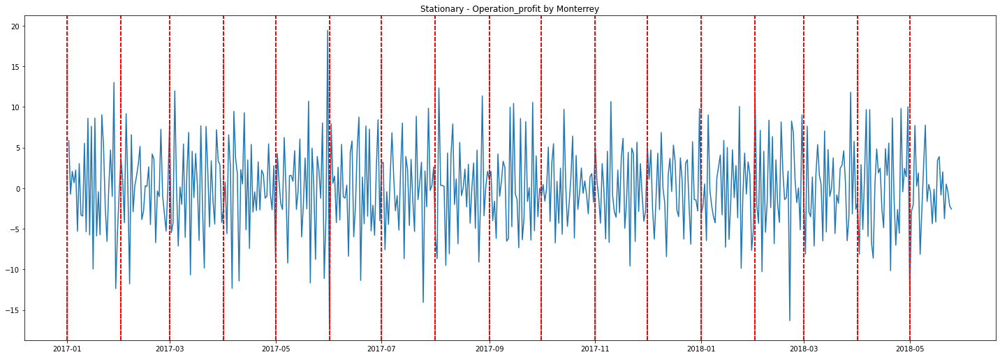

In [62]:
time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [63]:
result = adfuller(np.array(df_train_st[grouping_feature]))
print('Valor p:', result[1])

Valor p: 4.28386285746003e-22


In [64]:
ts_train = np.array(df_train_st[grouping_feature])

In [65]:
print(len(ts_train))

509


#### Determinación del orden p y q de la serie de tiempo

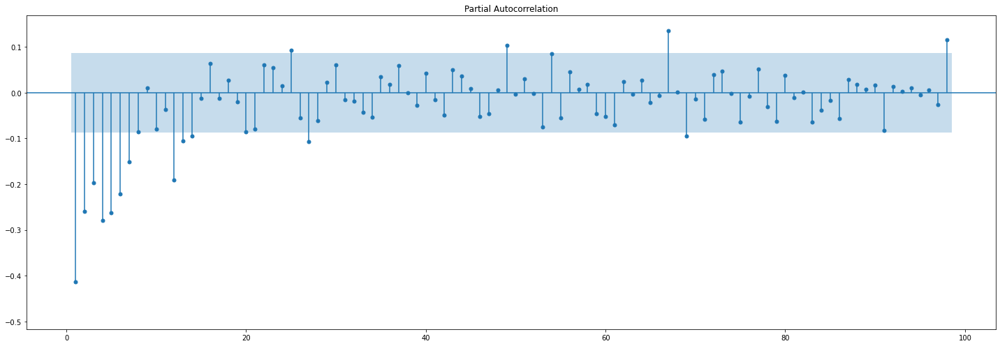

In [66]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=98, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

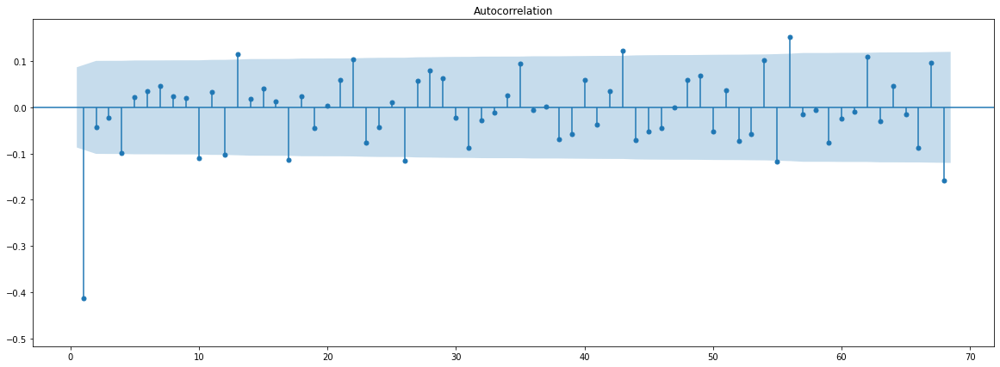

In [67]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=68, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [68]:
p = 98
d = 0
q = 68

In [69]:
model = ARIMA(ts_train, order=(p, d, q))

In [70]:
#arma = model.fit()

In [71]:
#arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

### Predicción

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             533.0
508 2018-05-24             396.0
509 2018-05-25             268.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             527.0
511 2018-05-27            1093.0
512 2018-05-28             513.0


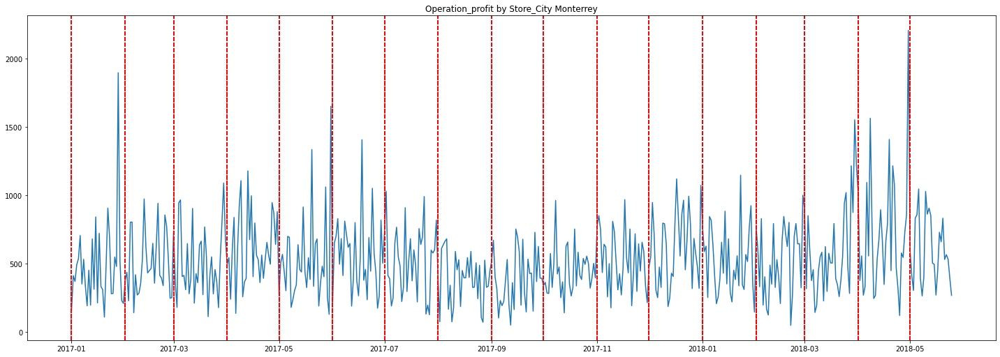

In [72]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Monterrey'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

In [73]:
# Estabilizacion de la varianza

# Transformacion de raiz cuadrada
# df_train[grouping_feature] = np.sqrt(df_train[grouping_feature])
# df_test[grouping_feature] = np.sqrt(df_test[grouping_feature])

# Transformacion logaritmica
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Transformación de Box Cox
# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.32620509676092196
0.5592470065536894


In [74]:
p = 98
d = 0
q = 68

In [75]:
def invert_serie(serie, aux_val):
    serie_ext = pd.concat([aux_val, serie], ignore_index = True)
    for i in range(len(serie_ext) - len(aux_val)):
        serie_ext.iloc[len(aux_val) + i] += serie_ext.iloc[i]
        
    return serie_ext

In [76]:
def arma_forecast(n_preds = 128, steps_before = 50, time_column_name = 'Date', grouping_feature = 'Operation_profit', stationary = True, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = 'CDMX', topic = 'profit', p = 45, d = 0, q = 120):
    
    # Hacer la serie estacionaria
    if (stationary == True):
        df_train_st = make_stationary(df_train, diff_type, cycle)
        df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)
    elif (stationary == False):
        df_train_st = df_train
        df_test_st = df_test
    
    # Recuperamos modelo
    try: 
        with open('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q), 'rb') as archivo:
            loaded_arma = pickle.load(archivo)
    except: 
        print("No existe modelo para el topic o los ordenes ingresados. Favor de revisar los valores ingresados.")

    # Realizamos diagnóstico
    loaded_arma.plot_diagnostics(figsize=(14,10))
    plt.show()
    
    # Realizamos predicciones a futuro
    preds = loaded_arma.forecast(steps = n_preds)
    
    
    # Se obtienen los intervalos de confianza para las predicciones realizadas. 
    # get_forecast(steps) devuelve un objeto que contiene información sobre las predicciones y los intervalos de confianza. 
    # summary_frame() se utiliza para extraer los intervalos de confianza.
    conf_int = loaded_arma.get_forecast(steps = n_preds).summary_frame()
    
    
    # Obtenemos los residuales del modelo usado y sometemos a prueba de normalidad
    resid = loaded_arma.resid
    statistic, p_value = stats.normaltest(resid)
    #alpha = 0.01  # Umbral de significancia, el valor del normal test debe ser mayor a este
    print("Evaluación de la normalidad de los residuales")
    print('Normal test results\np-value =', p_value)
    
    
    # Almacenamos de forma conveniente las predicciones
    # Generamos las fechas de las predicciones 
    init_date = (df_train_[time_column_name].iloc[-1]).to_pydatetime() # Se obtiene el ultimo indice que es la fecha más reciente y la convierte en un datetime
    next_dates = pd.date_range(start=init_date+pd.DateOffset(days=1), periods=n_preds, freq='D')
    
    # Cuando la serie de tiempo viene dada por meses y no por días
    #next_dates = [(init_date + relativedelta(months = i)).replace(day = 1) for i in range(1, n_preds + 1)]
    
    #df_preds = pd.DataFrame(preds, columns = ['Units'], index = next_dates)
    # Crear un diccionario con los datos
    data = {f'{time_column_name}': next_dates, f'{grouping_feature}': preds}
    # Crear el DataFrame
    df_preds = pd.DataFrame(data)
    
#     # Agregamos tendencia a las predicciones y les añadimos su fecha
#     adjust_st_2 = df_train_.diff().iloc[-12:].dropna()
#     df_preds_nst_2 = invert_serie(df_preds.dropna(), adjust_st_2)
#     adjust_st_1 = df_train_.iloc[-13:-12].dropna()
#     df_preds_nst = invert_serie(df_preds_nst_2, adjust_st_1)
#     df_preds_nst = df_preds_nst.iloc[13:]
#     df_preds_nst.index = df_preds.index

    # RECONSTRUIR LA TENDENCIA DE LA SERIE

#     adjust_st_1 = df_train_[grouping_feature].iloc[-(cycle+1):].dropna() #Para obtener el ultimo elemento es de [-1:] como en este caso
#     #print(adjust_st_1)
#     df_preds_nst = invert_serie(df_preds, adjust_st_1) # Se reconstruye la tendencia de los datos
#     #print(len(df_preds_nst))
#     df_preds_nst = df_preds_nst.iloc[(ciclo+1):] # Se guarda la serie desde la posicion 13 en adelante para quitar el tamaño del ciclo que se le agregó a la serie obtenida desde que se recupero el ciclo: 12 del ciclo + 1 de la tendencia = posicion 13 en adelante es la serie constra la que se puede constratastar las predicciones
#     #print(len(df_preds_nst))
#     df_preds_nst.index = df_preds.index

    if (stationary == True):
        adjust_st_1 = df_train_[grouping_feature].iloc[-(cycle+1):].dropna() #Para obtener el ultimo elemento es de [-1:] como en este caso
        #print(adjust_st_1)
        df_preds_nst = invert_serie(df_preds[grouping_feature], adjust_st_1) # Se reconstruye la tendencia de los datos
        #print(df_preds_nst)
        df_preds_nst = df_preds_nst.iloc[(0+1):] # Se guarda la serie desde la posicion 13 en adelante para quitar el tamaño del ciclo que se le agregó a la serie obtenida desde que se recupero el ciclo: 12 del ciclo + 1 de la tendencia = posicion 13 en adelante es la serie constra la que se puede constratastar las predicciones
        #print(len(df_preds_nst))
        df_preds_nst.index = df_preds[time_column_name]
        df_preds_nst = df_preds_nst.reset_index() 
    #   print(df_preds_nst.head(10))
    elif (stationary == False):
        #data = {f'{time_column_name}': df_preds[time_column_name], f'{grouping_feature}': preds}
        df_preds_nst = df_preds.copy(deep = True)
        #pd.DataFrame(data) #df_preds[time_column_name]
        #df_preds_nst = df_preds_nst.reset_index() 

    
    # Obtenemos errores
    # Si se calcularon más predicciones, el error solo se calcula solo con el numero de predicciones = df_test.
    # Si se pidieron menos prediccoines, el error se limita a evaluar la diferencia entre el numero de predicciones = numero de test a usar para calcular el error
    if len(preds) >= len(df_test):
        df_test_aux = df_test[:len(df_test)]
        df_preds_aux = df_preds_nst[:len(df_test)]
    else:
        df_test_aux = df_test[:len(preds)]
        df_preds_aux = df_preds_nst[:len(preds)]
    mse = mean_squared_error(np.array(df_test_aux[grouping_feature]), np.array(df_preds_aux[grouping_feature]))
    mape = mean_absolute_percentage_error(np.array(df_test_aux[grouping_feature]), np.array(df_preds_aux[grouping_feature]))
    print("\nError a partir de la inversion de los datos estacionarios")
    print('MSE:', mse, '\nRMSE:', mse**0.5, '\nMAPE:', mape)
    
    
    # Graficamos forecast estacionario
    c = 2
    plt.subplots(1, figsize=(10, 4))
    plt.plot(df_train_st[time_column_name].iloc[steps_before:], df_train_st[grouping_feature].iloc[steps_before:], color='black')
    plt.plot(df_test_st[time_column_name], df_test_st[grouping_feature], color='navy')
    plt.plot(df_preds[time_column_name], df_preds[grouping_feature], color='#ff8b00')
    plt.fill_between(next_dates, c * conf_int['mean_ci_lower'], c * conf_int['mean_ci_upper'], alpha = 0.5)
    plt.xlabel('Time')
    plt.ylabel(f'{grouping_feature}')
    plt.title('Forecast estacionario')
    plt.show()

    return df_preds, df_preds_nst, resid, p_value

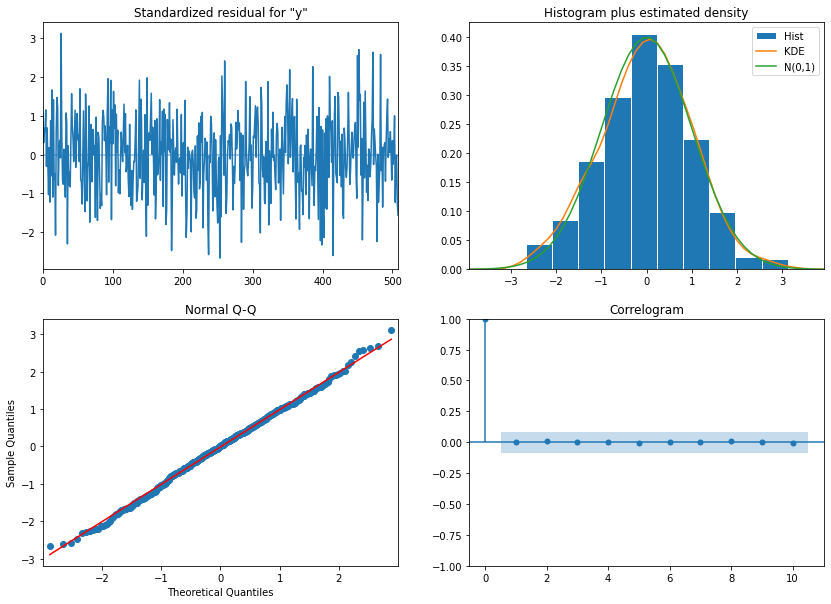

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.9176435492833119

Error a partir de la inversion de los datos estacionarios
MSE: 33.61017366522425 
RMSE: 5.797428194055037 
MAPE: 0.17635617858763397


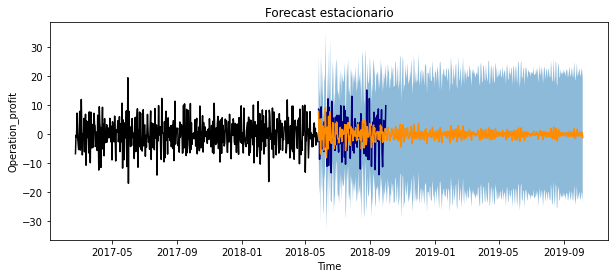

In [77]:
predicciones_st, predicciones_nst_originales, residuos, p_value = arma_forecast(n_preds = 500, steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Operation_profit', stationary = True, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = 'Monterrey', topic = 'profit', p=98, d=0, q=68)

### Caso 3: Hermosillo

Hipótesis 1: Comportamiento de compra diferenciado por tiendas.

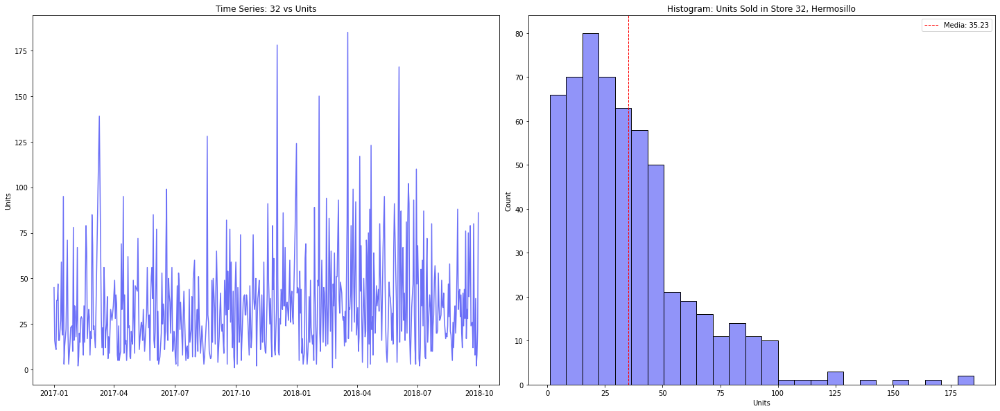

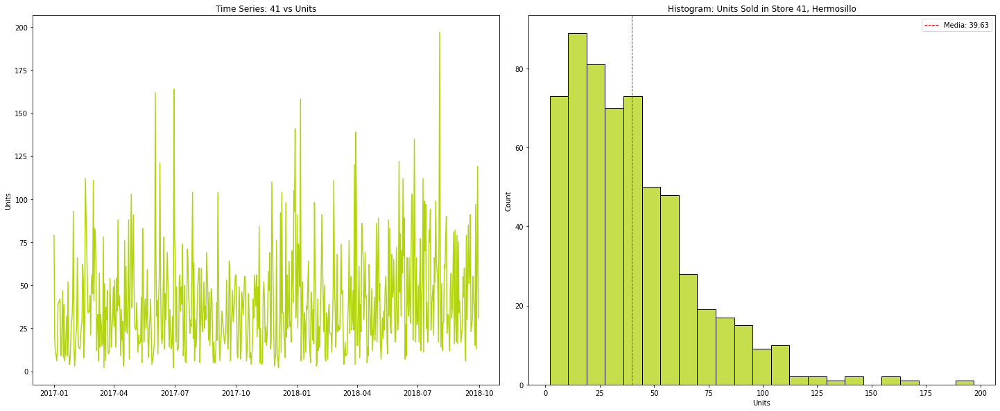

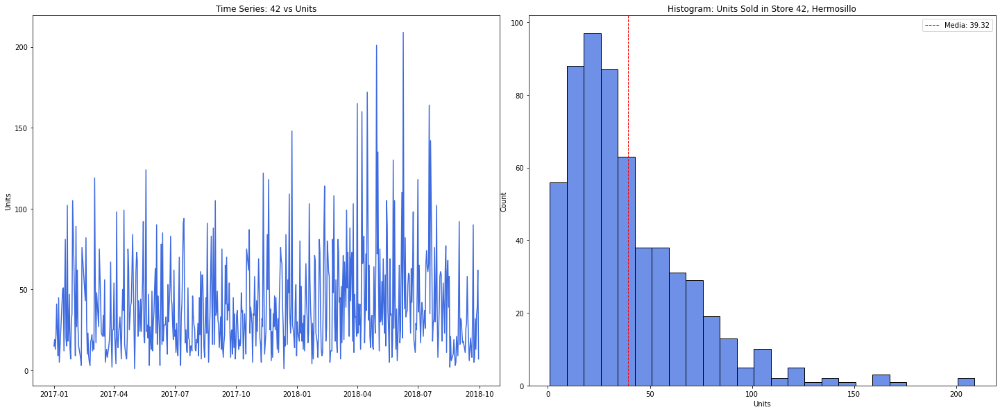

In [78]:
feature_name = 'Store_ID'
filter_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = 'Hermosillo'
df_graph = df_aux[df_aux[filter_name] == specific_value]
unique_values_feature = np.sort(df_graph[feature_name].unique())

for i in range(1,len(unique_values_feature)+1):
    
    #define subplots
    fig, ax = plt.subplots(1, 2, figsize=(20,8))
    fig.tight_layout()
    
    color = generar_color_hex_aleatorio()
    
    df_store = df_aux[df_aux[feature_name] == unique_values_feature[i-1]]
    
    unique_dates = sorted(df_store[time_column_name].unique())
    sum = df_store.groupby(time_column_name)[grouping_feature].sum()
    #print(promedio)

    #percent = round((len(df_state) / len(df)) * 100, 2)
    
    # Graficos
    ax[0].set(title=f"Time Series: {unique_values_feature[i-1]} vs {grouping_feature}")
    ax[1].set(title=f"Histogram: {grouping_feature} Sold in Store {unique_values_feature[i-1]}, {specific_value}")
    _ = sns.lineplot(x=unique_dates, y=sum, ax= ax[0], color = color)
    _ = sns.histplot(x=sum, ax= ax[1], color = color)
    #print(len(unique_dates))
    #print(len(sum))
    media = (np.sum(sum)/len(sum))
    ax[1].axvline(media, color='red', linestyle='dashed', linewidth=1, label = "Media")
    ax[1].legend(labels=['Media: {}'.format(round(media,2))])

    
#print(unique_values_feature[len(unique_values_feature)-1])
plt.show()

#### Propuesta de solución 1: Intentará ajustar un modelo que nos permita predecir las ganancias provenientes de Hermosillo en el futuro, de forma general.

#### División en conjunto de entrenamiento y de prueba

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             322.0
508 2018-05-24             281.0
509 2018-05-25             571.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             472.0
511 2018-05-27             879.0
512 2018-05-28             269.0


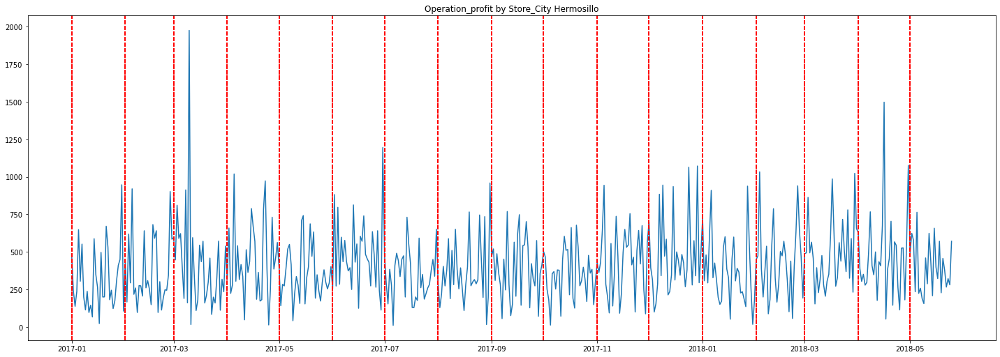

In [79]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)


#### Estabilización de la varianza de la serie de tiempo: Transformación de los datos

In [80]:
# Estabilizacion de la varianza

# Transformacion de raiz cuadrada
# df_train[grouping_feature] = np.sqrt(df_train[grouping_feature])
# df_test[grouping_feature] = np.sqrt(df_test[grouping_feature])

# Transformacion logaritmica
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Transformación de Box Cox
# Aplicar la transformación de Box-Cox
# datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
# df_train[grouping_feature] = datos_transformados 
# # Imprimir el valor óptimo de lambda
# print("Valor óptimo de lambda:", lambda_optimo)

# # Verificar si los datos transformados se asemejan a una distribución normal
# k2, p_valor = stats.normaltest(datos_transformados)
# print(p_valor)

# datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
# df_test[grouping_feature] = datos_transformados 

##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad, es decir, sí es estacionaria.


In [81]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 6.867091987167679e-05


#### Estacionariedad

In [82]:
# # Generación de Parámetros
# diff_type = ['inc']
# cycle = 0

# # Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
# df_train_st = make_stationary(df_train, diff_type)
# print(df_train_st.head(10))

In [83]:
# diff_type = ['inc']
# cycle = 0
# # Generamos una Serie Estacionaria para el Conjunto de Datos
# # Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
# df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [84]:
# # Recuerdemos que con una diferenciacion se pierde el primer registro
# print(len(df_train))
# print(len(df_train_st))

In [85]:
# print(len(pd.concat([df_train['Operation_profit'].iloc[-(cycle + 1):], df_test['Operation_profit']])))
# print(len(df_test_st))

#### Graficamos la serie estacionaria

In [86]:
# time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad, es decir, sí es estacionaria.


In [87]:
# result = adfuller(np.array(df_train_st[grouping_feature]))
# print('Valor p:', result[1])

In [88]:
ts_train = np.array(df_train[grouping_feature])

In [89]:
print(len(ts_train))

510


#### Determinación del orden p y q de la serie de tiempo

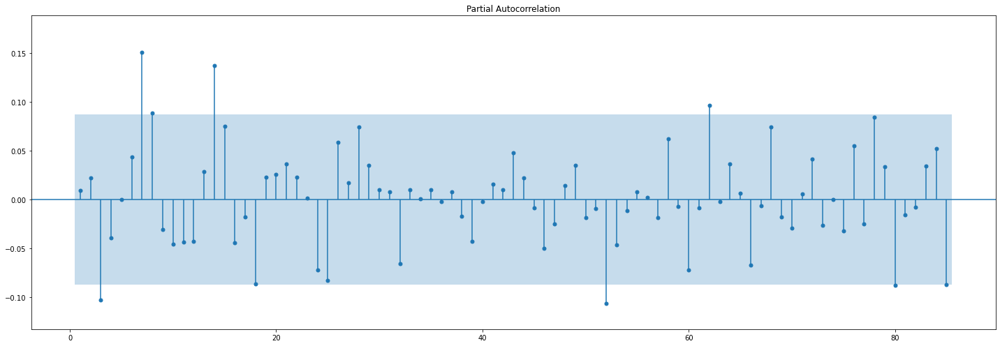

In [90]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=85, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

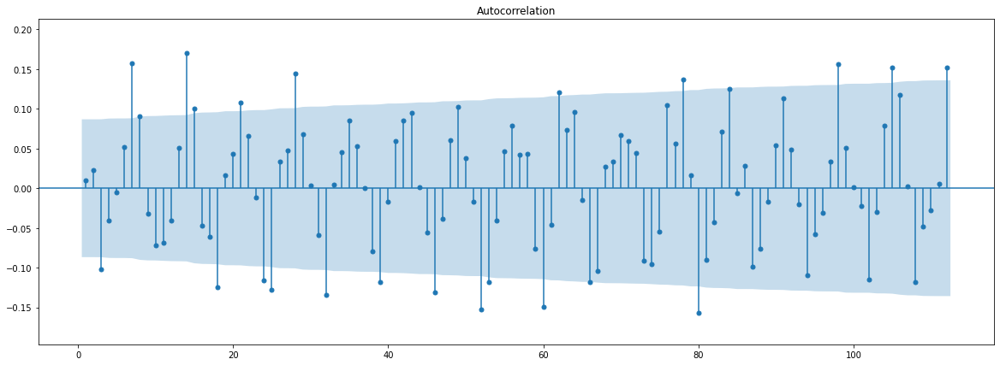

In [91]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=112, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [92]:
p = 85 
d = 0
q = 112 

In [93]:
model = ARIMA(ts_train, order=(p, d, q))

In [94]:
#arma = model.fit()

In [95]:
#arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

### Predicción

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             322.0
508 2018-05-24             281.0
509 2018-05-25             571.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             472.0
511 2018-05-27             879.0
512 2018-05-28             269.0


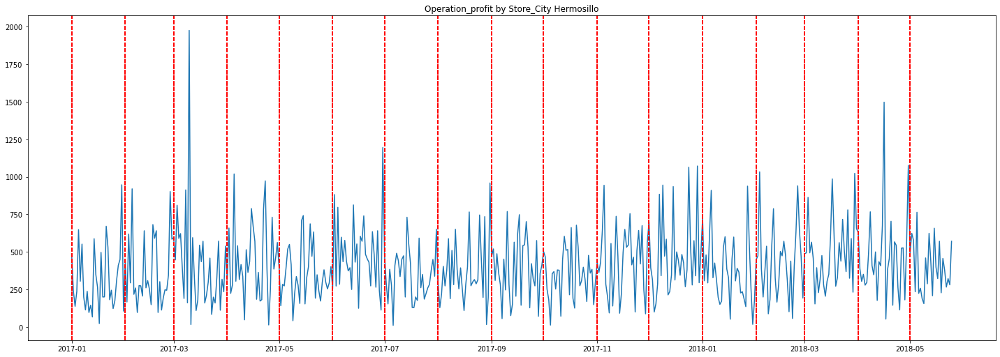

In [96]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [97]:
# # df_train[grouping_feature] = np.log(df_train[grouping_feature])
# # df_test[grouping_feature] = np.log(df_test[grouping_feature])

# # Aplicar la transformación de Box-Cox
# datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
# df_train[grouping_feature] = datos_transformados 
# # Imprimir el valor óptimo de lambda
# print("Valor óptimo de lambda:", lambda_optimo)

# # Verificar si los datos transformados se asemejan a una distribución normal
# k2, p_valor = stats.normaltest(datos_transformados)
# print(p_valor)

# datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
# df_test[grouping_feature] = datos_transformados 

In [98]:
p = 85
d = 0
q = 112

In [99]:
stationary = False

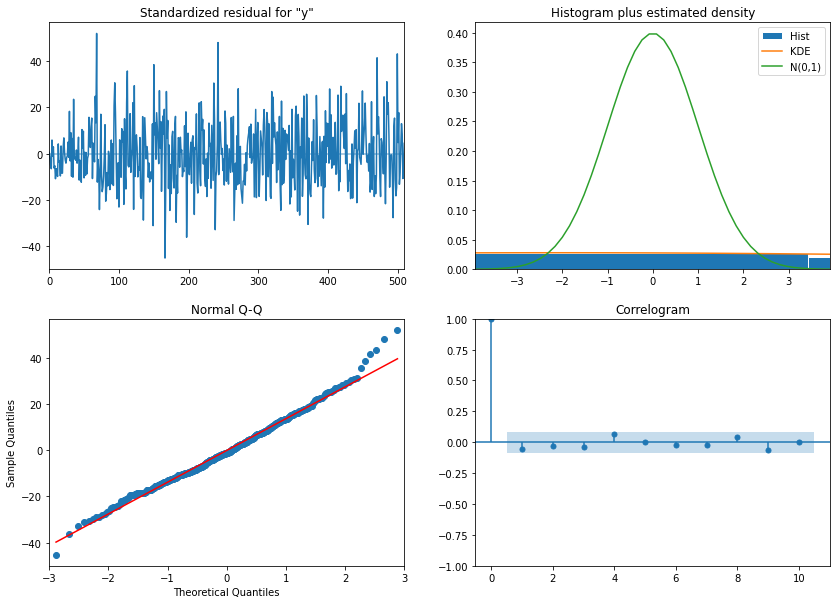

Evaluación de la normalidad de los residuales
Normal test results
p-value = 4.920608390165166e-06

Error a partir de la inversion de los datos estacionarios
MSE: 90128.75405725953 
RMSE: 300.2145134020997 
MAPE: 0.7003565605481321


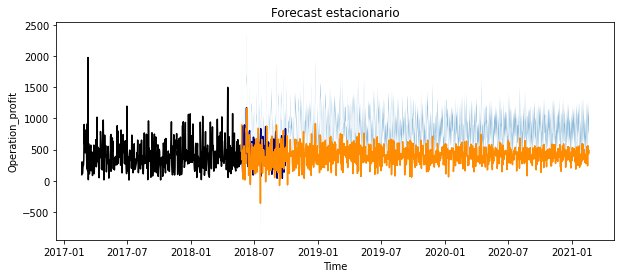

In [100]:
predicciones_st, predicciones_nst_originales, residuos, p_value = arma_forecast(1000, 50,  time_column_name, grouping_feature, stationary, ['inc'], 0, df_train, df_test, specific_value, topic, p, d, q)

Cuando el KDE está más aplastado y alargado en los laterales, generalmente indica que la distribución de los datos tiene colas pesadas o sesgos hacia los extremos. En otras palabras, un KDE más aplastado y alargado en los laterales indica que hay una mayor concentración de valores cerca del centro de la distribución y una disminución gradual de la densidad a medida que nos alejamos hacia los extremos. Esto significa que hay valores atípicos o extremos en los datos que están influyendo en la forma de la distribución.

Lo anterior tiene mucho sentido en este caso, donde los outliers no fueron neutralizados por considerarlos información importante de las ventas de cada ciudad y que forman parte del comportamiento de las ciudades.

Como se puede apreciar en los resultados obtenidos del test de normalidad de los residuos, estos parecen no seguir una distribucón normal. Por ende, se ajustará el modelo de los residuos para ajustarlos a una distribución normal y a aprtir de ellos, calcular predicciones confiables.

### Modelo de los residuales

In [101]:
data = {'Date': df_train['Date'], 'Residuos': residuos}
df_residuals = pd.DataFrame(data)
#df_residuals = df_residuals.sort_values('Date')
df_residuals

,Date,Residuos
0,2017-01-01,80.132717
1,2017-01-02,-120.946251
2,2017-01-03,-371.142047
3,2017-01-04,-365.033233
4,2017-01-05,294.500962
...,...,...
505,2018-05-21,186.459417
506,2018-05-22,122.536208
507,2018-05-23,-154.485774
508,2018-05-24,-124.451389


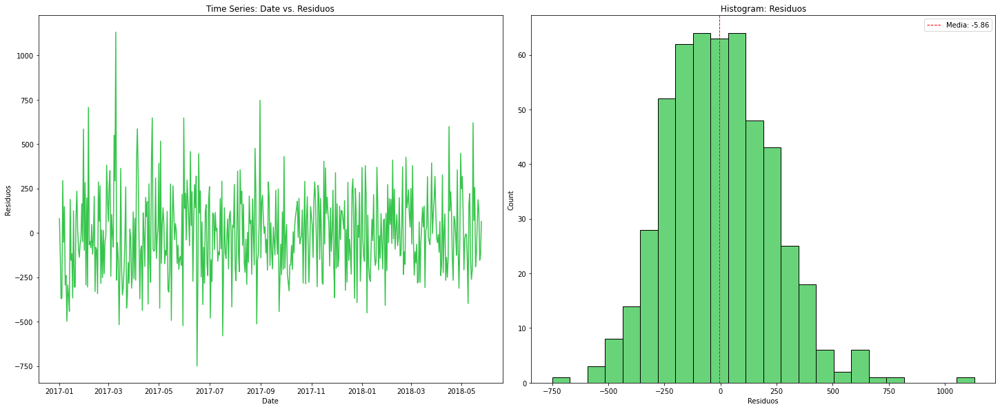

In [102]:
#Ploteo de los residuales
feature_name = 'Residuos'
time_column_name = 'Date'
grouping_feature = 'Residuos'
topic = 'residual'
specific_value = 'Hermosillo'

#define subplots
fig, ax = plt.subplots(1, 2, figsize=(20,8))
fig.tight_layout()

color = generar_color_hex_aleatorio()

# Graficos
ax[0].set(title=f"Time Series: {time_column_name} vs. {feature_name}")
ax[1].set(title=f"Histogram: {grouping_feature}")
_ = sns.lineplot(x=df_residuals[time_column_name], y=df_residuals[grouping_feature], ax= ax[0], color = color)
_ = sns.histplot(x=df_residuals[grouping_feature], ax= ax[1], color = color)

media = (np.sum(df_residuals[grouping_feature])/len(df_residuals[grouping_feature]))
ax[1].axvline(media, color='red', linestyle='dashed', linewidth=1, label = "Media")
ax[1].legend(labels=['Media: {}'.format(round(media,2))])


plt.show()

#### Estabilizacion de la varianza de los residuales

In [103]:
# serie_residual_log = np.log1p(df_residuals[grouping_feature]) 
# serie_transformada = np.real(serie_residual_log) 
# #df_residuals[grouping_feature] = serie_transformada

# Aplicar la transformación de Box-Cox
# datos_transformados, lambda_optimo = stats.boxcox(df_residuals[grouping_feature])
# df_residuals[grouping_feature] = datos_transformados

#### Separación en conjunto de entrenamiento y de prueba

In [104]:
# Separación en conjunto de entrenamiento y de prueba
test_perc = 0.2

# Porcentaje del Conjunto de Prueba.
test_perc = percent_test
total_obs = len(df_residuals)
# Obtención del índice final para el Conjunto de Entrenamiento.
limit_index = int((1 - test_perc) * total_obs)

# Partición del Conjunto de Datos.
df_train = df_residuals.iloc[:limit_index]
df_test = df_residuals.iloc[limit_index:]
print("Registros en el df_train: ", len(df_train))
print("Registros en el df_test: ", len(df_test))

# Visualización del Conjunto de Entrenamiento.
print("\nRegistros finales del conjunto de entrenamiento")
print(df_train.tail(3))

# Visualización del Conjunto de Prueba.
print("\nRegistros iniciales del conjunto de prueba")
print(df_test.head(3))

Registros en el df_train:  408
Registros en el df_test:  102

Registros finales del conjunto de entrenamiento
          Date    Residuos
405 2018-02-10  -91.515003
406 2018-02-11   27.760555
407 2018-02-12  103.415913

Registros iniciales del conjunto de prueba
          Date    Residuos
408 2018-02-13  -72.048013
409 2018-02-14  -27.369693
410 2018-02-15  198.387141


In [105]:
ts_train = np.array(df_train[grouping_feature])

In [106]:
len(ts_train)

408

#### Determinación del orden p y q para el modelo de residuos

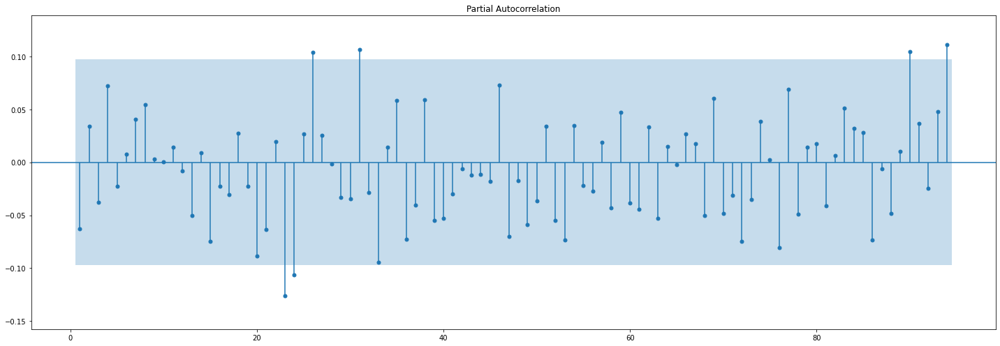

In [107]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=94, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

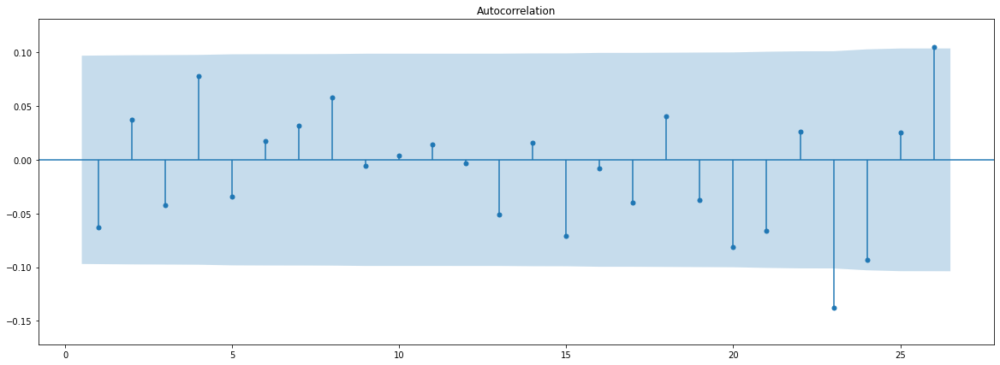

In [108]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=26, zero = False, auto_ylims=True, ax=ax)
plt.show()

#### Ajuste del modelo residual

In [109]:
p = 94
d = 0
q = 26

In [110]:
model = ARIMA(ts_train, order=(p, d, q))

In [111]:
#arma = model.fit()

In [112]:
#arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

In [113]:
def arma_forecast_residual(n_preds = 100, steps_before = 50, time_column_name = 'Date', grouping_feature = 'Operation_profit', df_train_ = df_train, df_test_ = df_test, specific_value = 'CDMX', p = 45, d = 0, q = 120):
    
    # Recuperamos modelo
    # NOTA: Hay que guardar los posibles modelos para cada una.
    try: 
        with open('{}_residual_{}_{}_{}.pkl'.format(specific_value, p, d, q), 'rb') as archivo:
            loaded_arma = pickle.load(archivo)
    except: 
        print("No existe modelo para el topic o los ordenes ingresados. Favor de revisar los valores ingresados.")

    # Realizamos diagnóstico
    loaded_arma.plot_diagnostics(figsize=(14,10))
    plt.show()
    
    # Obtenemos los residuales y sometemos a prueba de normalidad
    resid = loaded_arma.resid
    statistic, p_value = stats.normaltest(resid)
    #alpha = 0.01  # Umbral de significancia, el valor del normal test debe ser mayor a este
    print('Normal test results\np-value =', p_value)
    
    # Realizamos predicciones a futuro
    preds = loaded_arma.forecast(steps = n_preds)
    preds
    # Se obtienen los intervalos de confianza para las predicciones realizadas. 
    # get_forecast(steps) devuelve un objeto que contiene información sobre las predicciones y los intervalos de confianza. 
    # summary_frame() se utiliza para extraer los intervalos de confianza.
    conf_int = loaded_arma.get_forecast(steps = n_preds).summary_frame()
    
    # Almacenamos de forma conveniente las predicciones
    init_date = (df_train_[time_column_name].iloc[-1]).to_pydatetime() # Se obtiene el ultimo indice que es la fecha más reciente y la convierte en un datetime
    next_dates = pd.date_range(start=init_date+pd.DateOffset(days=1), periods=n_preds, freq='D')
    #next_dates = [(init_date + relativedelta(months = i)).replace(day = 1) for i in range(1, n_preds + 1)]
    #df_preds = pd.DataFrame(preds, columns = ['Units'], index = next_dates)
    # Crear un diccionario con los datos
    data = {f'{time_column_name}': next_dates, f'{grouping_feature}': preds}
    # Crear el DataFrame
    df_preds = pd.DataFrame(data)

    # Obtenemos errores
    # Si se calcularon más predicciones, el error solo se calcula solo con el numero de predicciones = df_test.
    # Si se pidieron menos prediccoines, el error se limita a evaluar la diferencia entre el numero de predicciones = numero de test a usar para calcular el error
    if len(preds) >= len(df_test):
        df_test_aux = df_test[:len(df_test)]
        df_preds_aux = df_preds.iloc[:len(df_test)]
        #print(df_preds_aux)
    else:
        df_test_aux = df_test[len(preds)]
        df_preds_aux = df_preds.iloc[:len(preds)]
        #print(df_preds_aux)
    mse = mean_squared_error(np.array(df_test_aux[grouping_feature]), np.array(df_preds_aux[grouping_feature]))
    mape = mean_absolute_percentage_error(np.array(df_test_aux[grouping_feature]), np.array(df_preds_aux[grouping_feature]))
    print('MSE:', mse, '\nRMSE:', mse**0.5, '\nMAPE:', mape)
    
    # Graficamos forecast estacionario
    c = 2 # Para que los intervalos de confianza estén dados en funcion de dos desviaciones estandar
    plt.subplots(1, figsize=(10, 4))
    plt.plot(df_train[time_column_name].iloc[steps_before:], df_train[grouping_feature].iloc[steps_before:], color='black')
    plt.plot(df_test[time_column_name], df_test[grouping_feature], color='navy')
    plt.plot(df_preds[time_column_name], df_preds[grouping_feature], color='#ff8b00')
    plt.fill_between(next_dates, c * conf_int['mean_ci_lower'], c * conf_int['mean_ci_upper'], alpha = 0.5)
    plt.xlabel('Time')
    plt.ylabel(f'{grouping_feature}')
    plt.title('Forecast estacionario')
    plt.show()

    return resid, p_value

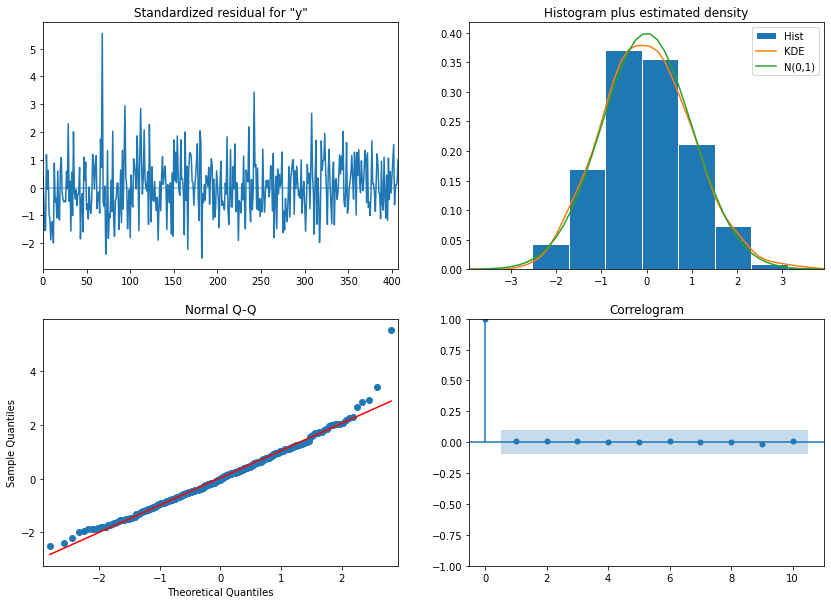

Normal test results
p-value = 4.8619512094339595e-12
MSE: 55035.974150443086 
RMSE: 234.59747260028846 
MAPE: 2.135245831125825


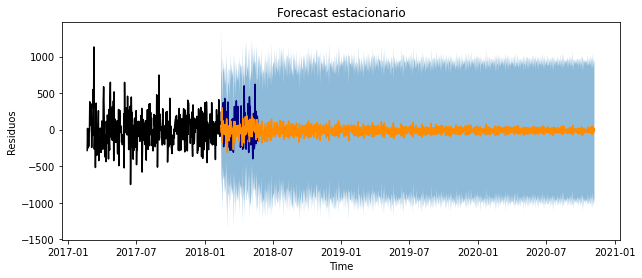

In [114]:
residuals_predicted, p_value_residuals = arma_forecast_residual(1000, 50, 'Date', 'Residuos', df_train, df_test, specific_value, p, d, q)

Si los residuales no son normales, se deben ajustar nuevos modelos para los residuos hasta que se garantice la normalidad de los mismos. Si este modelo ajusta los residuos a la normalidad se debe serguir el siguiente procedimiento para realiazr forecast.

#### Forma de hacer forecast una vez encontrado el modelo de los residuos que los apegue a la normalidad

El procedimiento para hacer predicciones con ambos modelos sería el siguiente:

1) Realiza la predicción inicial con el modelo ARIMA: Utilizar el modelo ARIMA entrenado en tus datos para hacer una predicción inicial de los valores futuros. Esto implica utilizar los valores pasados de la serie para predecir los valores futuros.

2) Calcula los residuos de la predicción inicial: Una vez que hayas obtenido la predicción inicial con el modelo ARIMA, calcula los residuos restando los valores predichos de los valores reales.

3) Aplica el modelo de residuos de los residuos: Utiliza el modelo de residuos de los residuos para hacer una predicción de los residuos futuros.

4) Combina las predicciones del modelo ARIMA y el modelo de residuos de los residuos: Suma las predicciones del modelo ARIMA y las predicciones del modelo de residuos de los residuos para obtener las predicciones finales de los valores futuros.

#### Intento 2: Modelo con estabilización de la varianza y proceso de estacionariedad

#### División en conjunto de entrenamiento y de prueba

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             322.0
508 2018-05-24             281.0
509 2018-05-25             571.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             472.0
511 2018-05-27             879.0
512 2018-05-28             269.0


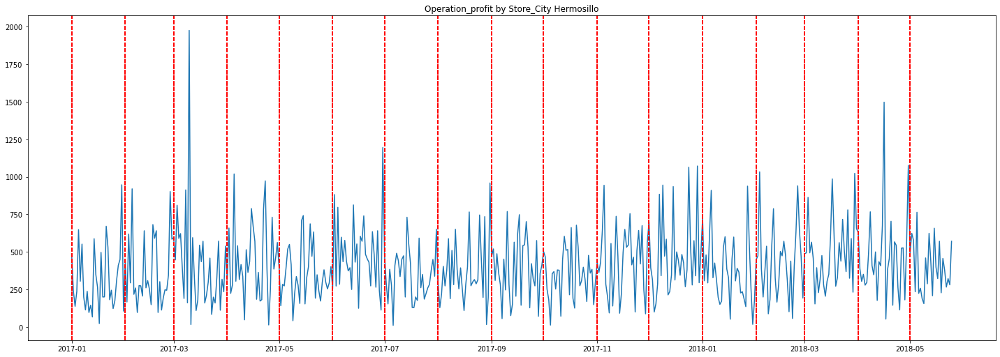

In [115]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)


#### Estabilización de la varianza de la serie de tiempo: Transformación de los datos

In [116]:
# Estabilizacion de la varianza

# Transformacion de raiz cuadrada
# df_train[grouping_feature] = np.sqrt(df_train[grouping_feature])
# df_test[grouping_feature] = np.sqrt(df_test[grouping_feature])

# Transformacion logaritmica
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Transformación de Box Cox
# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.4642481189331626
0.09367797522686117


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad, es decir, sí es estacionaria.


In [117]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 0.00016895547697611313


#### Estacionariedad

In [118]:
# Generación de Parámetros
diff_type = ['inc']
cycle = 0

# Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
df_train_st = make_stationary(df_train, diff_type)
print(df_train_st.head(10))

         Date  Operation_profit
1  2017-01-02        -10.615385
2  2017-01-03         -6.268031
3  2017-01-04          6.055299
4  2017-01-05         16.230571
5  2017-01-06        -12.842253
6  2017-01-07          9.721542
7  2017-01-08        -15.176498
8  2017-01-09         -5.789504
9  2017-01-10          7.909504
10 2017-01-11         -9.311914


In [119]:
diff_type = ['inc']
cycle = 0
# Generamos una Serie Estacionaria para el Conjunto de Datos
# Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

#### Graficamos la serie estacionaria

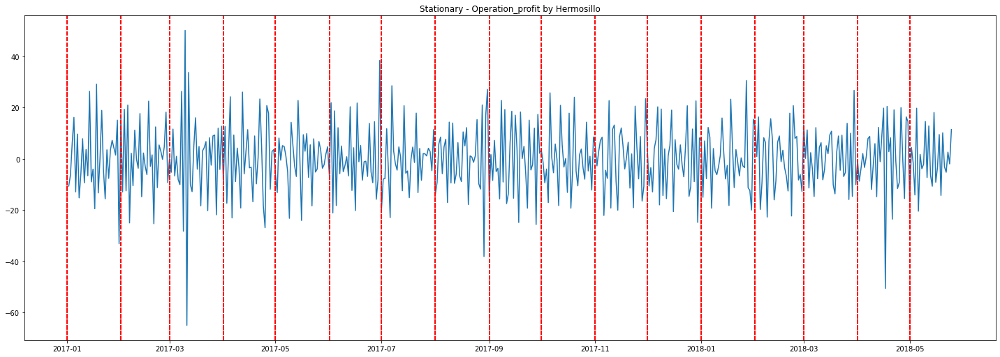

In [120]:
time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad, es decir, sí es estacionaria.


In [121]:
result = adfuller(np.array(df_train_st[grouping_feature]))
print('Valor p:', result[1])

Valor p: 1.8065212172182282e-22


In [122]:
ts_train = np.array(df_train_st[grouping_feature])

In [123]:
print(len(ts_train))

509


#### Determinación del orden p y q de la serie de tiempo

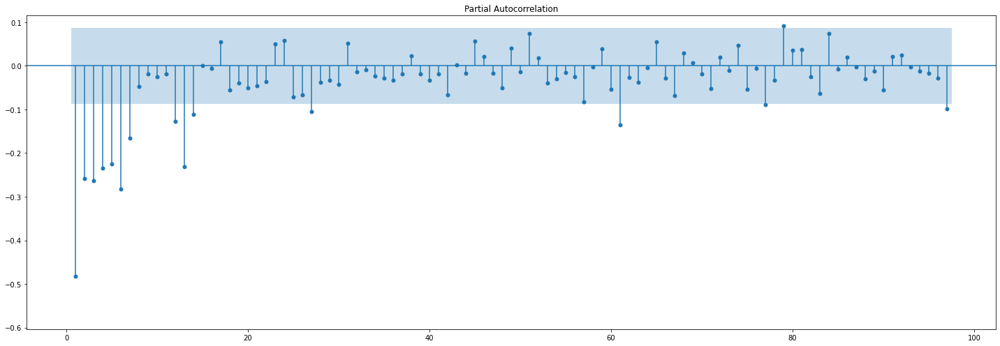

In [124]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=97, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

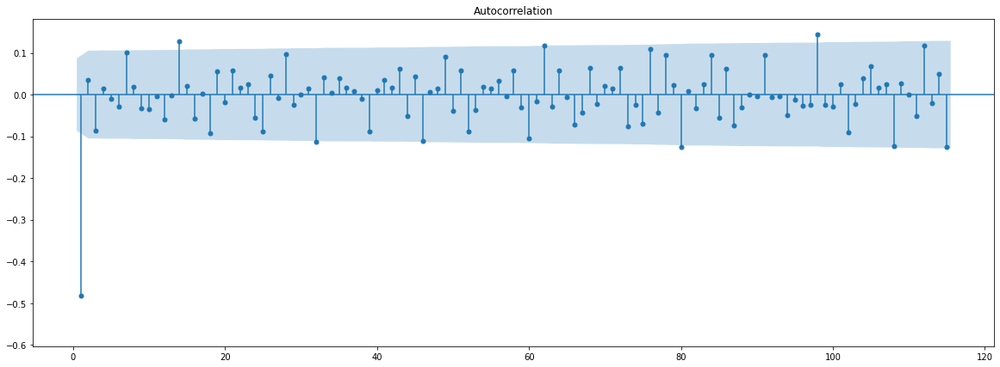

In [125]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=115, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [126]:
p = 97 
d = 0
q = 115

In [127]:
model = ARIMA(ts_train, order=(p, d, q))

In [128]:
# arma = model.fit()

In [129]:
# arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

### Predicción

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             322.0
508 2018-05-24             281.0
509 2018-05-25             571.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             472.0
511 2018-05-27             879.0
512 2018-05-28             269.0


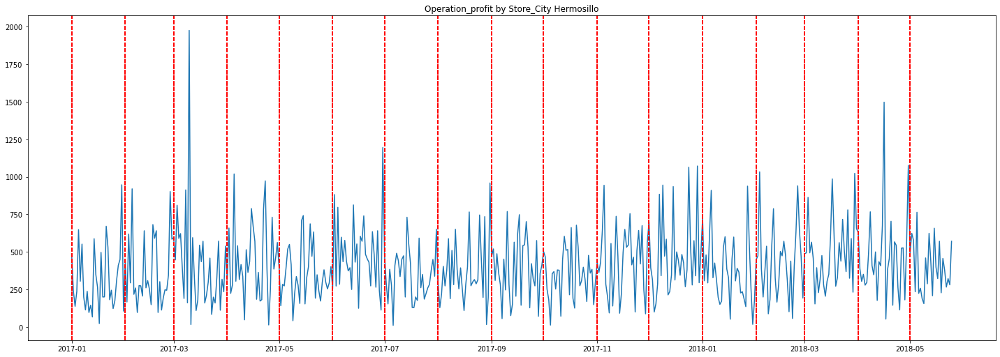

In [130]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [131]:
# # df_train[grouping_feature] = np.log(df_train[grouping_feature])
# # df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.4642481189331626
0.09367797522686117


In [132]:
p = 97
d = 0
q = 115

In [133]:
stationary = True

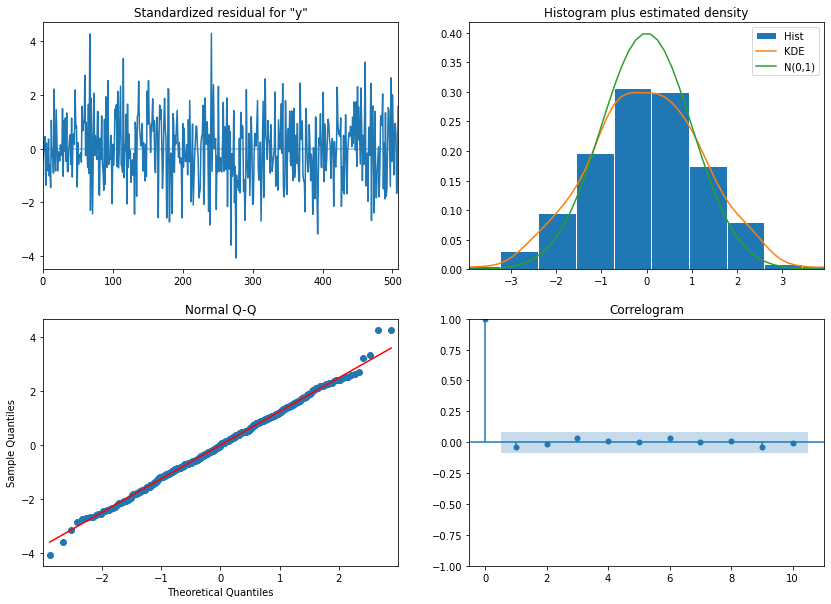

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.08003704848766117

Error a partir de la inversion de los datos estacionarios
MSE: 1416.5727769025657 
RMSE: 37.63738536219759 
MAPE: 0.47591038673922004


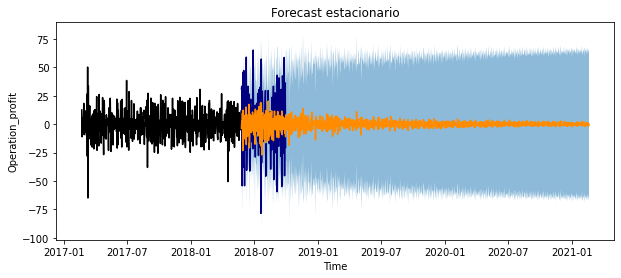

In [134]:
predicciones_st, predicciones_nst_originales, residuos, p_value = arma_forecast(1000, 50,  time_column_name, grouping_feature, stationary, ['inc'], 0, df_train, df_test, specific_value, topic, p, d, q)

En este caso, se puede apreciar como al aplicar una transformación para ajustar la varianza y reducir el sesgo, y aplicar la diferenciación de los datos para volver la distribución estacionaria, se logró ajustar un modelo cuyos residuos son ruido blanco. De esta manera, las predicciones generadas representarán de forma fidedigna el comportamiento de los datos, ya que el hecho de que los residuales sean ruido blanco implica que el modelo ha capturado toda la información importante y que no hay patrones sistemáticos o estructuras remanentes en los datos. 

In [135]:
predicciones_nst_originales

,Date,Operation_profit
0,2018-05-26,35.326418
1,2018-05-27,38.149362
2,2018-05-28,34.638405
3,2018-05-29,44.105068
4,2018-05-30,20.780786
...,...,...
995,2021-02-14,40.624522
996,2021-02-15,39.153117
997,2021-02-16,39.227645
998,2021-02-17,39.909877


### Propuesta de solución 2: Generacion de un nuevo modelo eliminando los outliers

#### Ajuste de un nuevo modelo ARIMA

Justificación:
    
Como se puede apreciar en la distribucion de unidades vendidas por tiendas, existen outliers en cada una las tiendas. Por ende, a fin de hacer una estimación confiable sobre las ganancias a futuro provenientes de Hermosillo habría que neutralizar los outliers de esta ciudad. Dicho proceso se hará a nivel ciudad, ya que esto permitirá describir el comportamiento general de las tiendas por su contexto geográfico. Además esta neutralizacion de outliers por estado o en este caso ciudad, nos permite respetar el comportamiento segmentado que tienen las ventas en cada ciudad o estado de un país. Si se optara por neutralizar los outliers de forma general, se perdería información sobre el comportamiento de venta del cliente en cada estado de un país. En el otro extremo, si se hiciera el manejo de outliers por tienda, el tiempo de procesamiento y de análisis estadístíco crecería muchísimo, además  que se requeriría de un gran poder de cómputo.

In [136]:
# Filtrado de los registros por estado
specific_value = 'Hermosillo'
feature_column = 'Store_City'
grouping_feature = 'Units'

df_grouped = df_aux[df_aux[feature_column] == specific_value]
df_grouped = df_grouped.reset_index(drop=True)
df_grouped

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit,Operation_profit
0,26,2017-01-01,41,8,1,Hermosillo,3.0,3.0
1,45,2017-01-01,41,8,3,Hermosillo,3.0,9.0
2,38,2017-01-01,32,8,4,Hermosillo,3.0,12.0
3,56,2017-01-01,41,8,2,Hermosillo,3.0,6.0
4,59,2017-01-01,41,1,1,Hermosillo,6.0,6.0
...,...,...,...,...,...,...,...,...
49830,829043,2018-09-30,41,11,1,Hermosillo,10.0,10.0
49831,829082,2018-09-30,41,6,1,Hermosillo,8.0,8.0
49832,829107,2018-09-30,41,6,1,Hermosillo,8.0,8.0
49833,829229,2018-09-30,32,12,1,Hermosillo,3.0,3.0


In [137]:
# Verificación del número de compras por unidades vendidas
df_grouped[grouping_feature].value_counts()

1    40426
3     4407
2     3822
4      736
6      196
5      172
7       66
8        7
9        3
Name: Units, dtype: int64

Feature :  Units


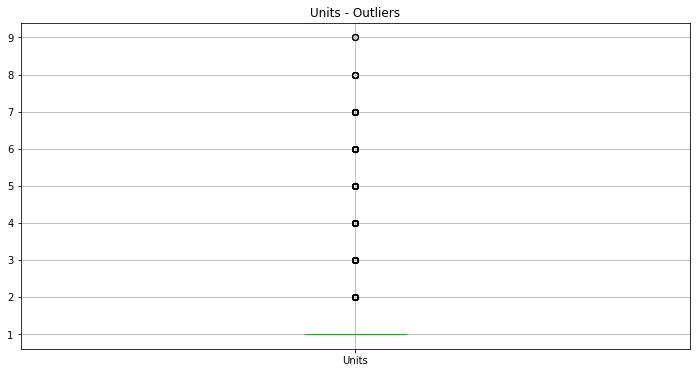

Cuartiles: 
0.25    1.0
0.50    1.0
0.75    1.0
Name: Units, dtype: float64
Percentiles: 
[1. 1. 1. 1. 1. 1. 1. 1. 3.]
Limites intercuartilicos
lof:  1.0
lif:  1.0
uif:  1.0
uof:  1.0
Outliers moderados:  []
Hay 0 registros correspondientes a los outliers moderados
Outliers extremos:  [2, 3, 4, 5, 6, 7, 8, 9]
Hay 9409 registros correspondientes a los outliers extremos.


In [138]:
moderate, extreme = eda.checkOutliers(df_grouped, 'Units')

In [139]:
print(f"Numero de registros de {specific_value}: ", len(df_grouped))

Numero de registros de Hermosillo:  49835



 UNITS 

Quartiles: [1. 1. 1.]
Percentiles:  [1. 1. 1. 1. 1. 1. 1. 1. 3.]
Lower outer fence:  1.0
Lower inner fence:  1.0
Upper inner fence:  1.0
Upper outer fence:  1.0
╒══════════════════════╤══════════╤═════════╕
│                      │  Before  │  After  │
╞══════════════════════╪══════════╪═════════╡
│ # Moderated outliers │    0     │    0    │
├──────────────────────┼──────────┼─────────┤
│ # Extreme outliers   │   9409   │  9409   │
╘══════════════════════╧══════════╧═════════╛


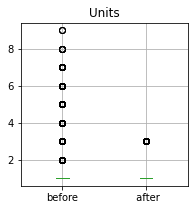

In [140]:
# Neutralizacion de outliers
df_grouped[grouping_feature] = eliminacion_outliers(df_grouped[grouping_feature])

Para neutralizar los outliers, se usó el primer y decimo percentil, en lugar de la media, a fin de mantener lo mejor posible los registros de las tiendas que más venden. Parece que se dejaron los residuos extremos porque el noveno percentil es el valor 3, por tanto,siguen apareciendo como valores extremos, pero ya se redujeron las unidades superiores a 3.

In [141]:
# Recalculo del Operating_profit
df_grouped['Operation_profit'] = df_grouped['Units'] * df_grouped['Profit_per_unit']

In [142]:
df_grouped

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit,Operation_profit
0,26,2017-01-01,41,8,1,Hermosillo,3.0,3.0
1,45,2017-01-01,41,8,3,Hermosillo,3.0,9.0
2,38,2017-01-01,32,8,3,Hermosillo,3.0,9.0
3,56,2017-01-01,41,8,3,Hermosillo,3.0,9.0
4,59,2017-01-01,41,1,1,Hermosillo,6.0,6.0
...,...,...,...,...,...,...,...,...
49830,829043,2018-09-30,41,11,1,Hermosillo,10.0,10.0
49831,829082,2018-09-30,41,6,1,Hermosillo,8.0,8.0
49832,829107,2018-09-30,41,6,1,Hermosillo,8.0,8.0
49833,829229,2018-09-30,32,12,1,Hermosillo,3.0,3.0


#### División en conjunto de entrenamiento y de prueba

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             326.0
508 2018-05-24             286.0
509 2018-05-25             591.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             488.0
511 2018-05-27            1002.0
512 2018-05-28             269.0


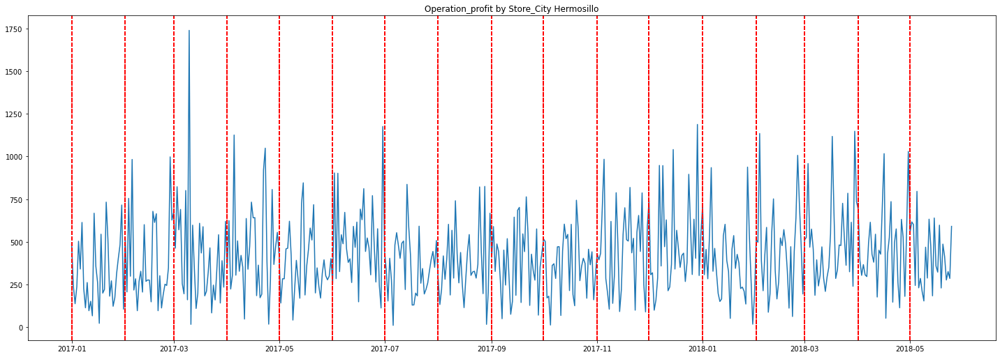

In [143]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit_nout'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_grouped, feature_name, time_column_name, grouping_feature, specific_value, percent_test)


#### Estabilización de la varianza

In [144]:
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.4944431816603318
0.5443101975360667


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [145]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 0.0001596040412147039


#### Estacionariedad

In [146]:
# # Generación de Parámetros
# diff_type = ['inc']
# cycle = 0

# # Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
# df_train_st = make_stationary(df_train, diff_type)
# print(df_train_st.head(10))

In [147]:
# diff_type = ['inc']
# cycle = 0
# # Generamos una Serie Estacionaria para el Conjunto de Datos
# # Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
# df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [148]:
# # Recuerdemos que con una diferenciacion se pierde el primer registro
# print(len(df_train))
# print(len(df_train_st))

In [149]:
# print(len(pd.concat([df_train['Operation_profit'].iloc[-(cycle + 1):], df_test['Operation_profit']])))
# print(len(df_test_st))

#### Graficamos la serie estacionaria

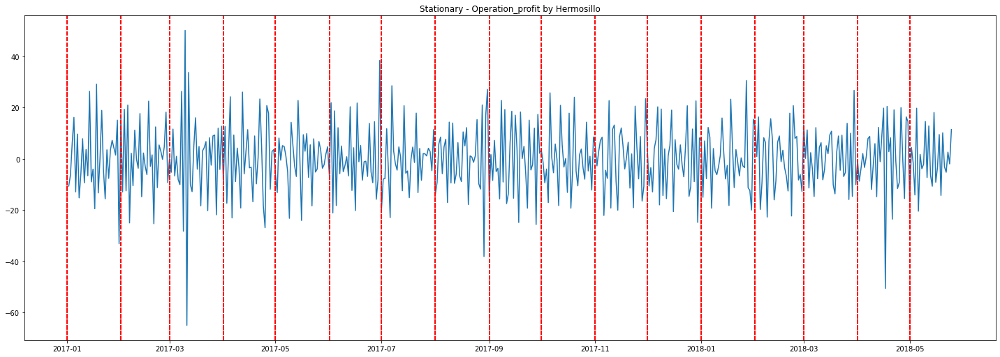

In [150]:
time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [151]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 0.0001596040412147039


In [152]:
ts_train = np.array(df_train[grouping_feature])

In [153]:
print(len(ts_train))

510


#### Determinación del orden p y q de la serie de tiempo

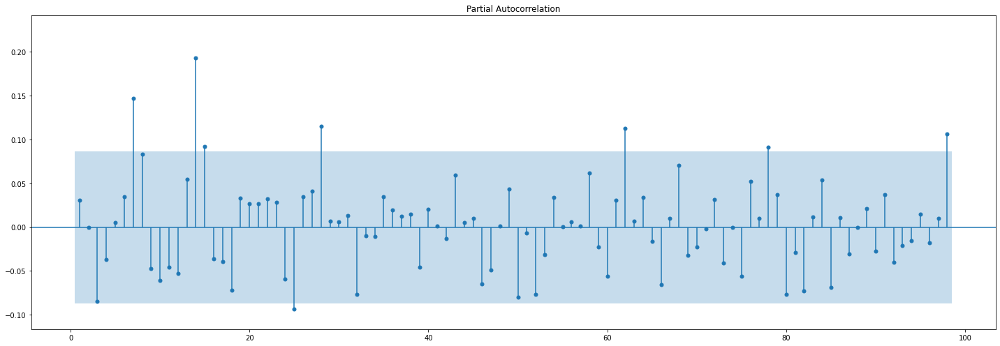

In [154]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=98, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

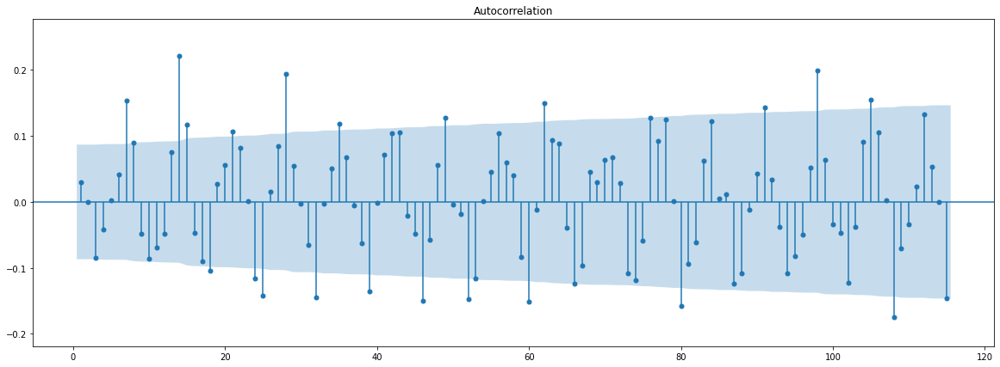

In [155]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=115, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [156]:
p = 97
d = 0
q = 115

In [157]:
model = ARIMA(ts_train, order=(p, d, q))

In [158]:
#arma = model.fit()

In [159]:
#arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

### Predicción

Registros en el df_train:  510
Registros en el df_test:  128

Registros finales del conjunto de entrenamiento
          Date  Operation_profit
507 2018-05-23             326.0
508 2018-05-24             286.0
509 2018-05-25             591.0

Registros iniciales del conjunto de prueba
          Date  Operation_profit
510 2018-05-26             488.0
511 2018-05-27            1002.0
512 2018-05-28             269.0


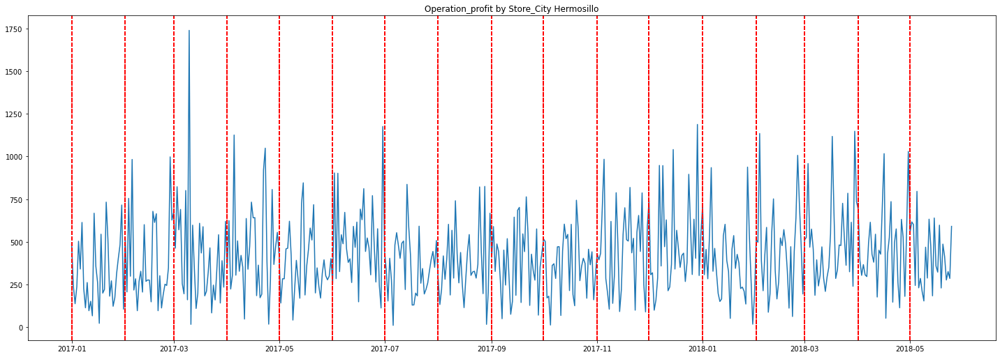

In [160]:
#Parametros de la st buscada
feature_name = 'Store_City'
time_column_name = 'Date'
grouping_feature = 'Operation_profit'
specific_value = 'Hermosillo'
topic = 'profit_nout'
percent_test = 0.2
    
df_train, df_test = time_series_nst_plot(df_grouped, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

In [161]:
# Estabilizacion de la varianza
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.4944431816603318
0.5443101975360667


In [162]:
p = 97
d = 0
q = 115

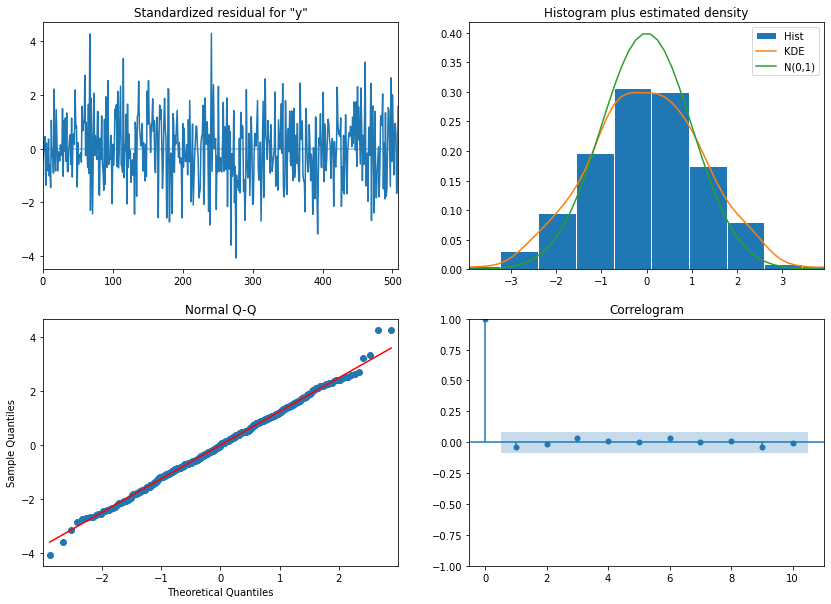

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.08003704848766117

Error a partir de la inversion de los datos estacionarios
MSE: 4426.805388455379 
RMSE: 66.53424222500306 
MAPE: 1.0099655013749693


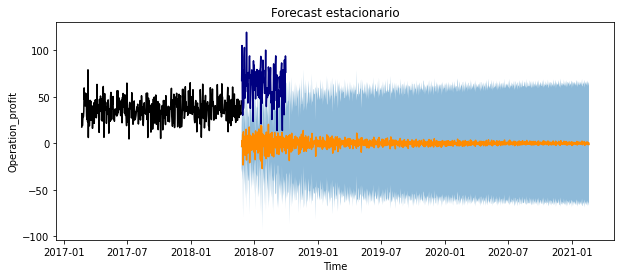

In [163]:
predicciones_st, predicciones_nst_originales, residuos, p_value = arma_forecast(1000, 50,  time_column_name, grouping_feature, False, ['inc'], 0, df_train, df_test, specific_value, topic, p, d, q)

#### Observación

Como se puede apreciar, a partir del resultado del test de normalidad, los residuos del modelo ARMA ajustado para estimar las ganancias de Hermosillo con p=97, d=0 y q=115 generan residuos con distribución normal, es decir, son ruido blanco. Cuando esto sucede, se considera que el modelo ha logrado eliminar la autocorrelación en los datos y que no quedan patrones significativos en los residuos que puedan ser explotados para mejorar las predicciones. Esto es importante porque si los residuos no son ruido blanco pueden indicar que el modelo ARIMA no está capturando adecuadamente alguna estructura en los datos o que aún queda información por explotar. 

Es importante apreciar como este modelo ajustado a una serie de tiempo donde se han neutralizado los outliers es equivalente al modelo obtenido donde se hizo una transformación de los datos para reducir el sesgo de la varianza. En este caso, ambas técnicas generaron resultados muy similares, aunque esto usualmente no suceda.

Las predicciones obtenidas por el modelo son las siguientes:

In [164]:
print(predicciones_nst_originales)

          Date  Operation_profit
0   2018-05-26         -3.541197
1   2018-05-27          2.822944
2   2018-05-28         -3.510957
3   2018-05-29          9.466664
4   2018-05-30        -23.324283
..         ...               ...
995 2021-02-14          0.155008
996 2021-02-15         -1.471405
997 2021-02-16          0.074528
998 2021-02-17          0.682232
999 2021-02-18         -1.258787

[1000 rows x 2 columns]


## Tema 3: Juguetes

- ¿Cuáles son los juguetes que deberían ser reemplazados en las tiendas?

Objetivo  
- Conocer cómo son las ventas que mayor y más baja demanda tienen en la tienda a fin de tomar medidas en la adquisición o renovación de productos disponibles.   

In [165]:
df_aux

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit,Operation_profit
0,1,2017-01-01,24,4,1,Aguascalientes,3.0,3.0
1,2,2017-01-01,28,1,1,Puebla,6.0,6.0
2,3,2017-01-01,6,8,1,Mexicali,3.0,3.0
3,4,2017-01-01,48,7,1,Saltillo,4.0,4.0
4,5,2017-01-01,44,18,1,Puebla,5.0,5.0
...,...,...,...,...,...,...,...,...
829257,829258,2018-09-30,24,19,1,Aguascalientes,2.0,2.0
829258,829259,2018-09-30,16,35,1,San Luis Potosi,4.0,4.0
829259,829260,2018-09-30,22,19,1,Guanajuato,2.0,2.0
829260,829248,2018-09-30,44,25,1,Puebla,1.0,1.0


In [166]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Products"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
selected_features = products[['Product_ID', 'Product_Category']]

# Importar las columnas seleccionadas basadas en el Store_id
df_aux = pd.merge(df_aux, selected_features, on='Product_ID', how='left')

# Consulta de la información de las 10 tiendas que más venden
df_aux.head(10)

,Sale_ID,Date,Store_ID,Product_ID,Units,Store_City,Profit_per_unit,Operation_profit,Product_Category
0,1,2017-01-01,24,4,1,Aguascalientes,3.0,3.0,Games
1,2,2017-01-01,28,1,1,Puebla,6.0,6.0,Toys
2,3,2017-01-01,6,8,1,Mexicali,3.0,3.0,Games
3,4,2017-01-01,48,7,1,Saltillo,4.0,4.0,Sports & Outdoors
4,5,2017-01-01,44,18,1,Puebla,5.0,5.0,Toys
5,6,2017-01-01,1,31,1,Guadalajara,1.0,1.0,Sports & Outdoors
6,7,2017-01-01,40,7,1,Toluca,4.0,4.0,Sports & Outdoors
7,8,2017-01-01,19,2,1,Puebla,3.0,3.0,Toys
8,9,2017-01-01,38,21,1,Chihuahua,3.0,3.0,Sports & Outdoors
9,10,2017-01-01,21,8,1,Santiago,3.0,3.0,Games


Product_Category
Art & Crafts         325574
Toys                 267200
Games                194673
Sports & Outdoors    169043
Electronics          134075
Name: Units, dtype: int64


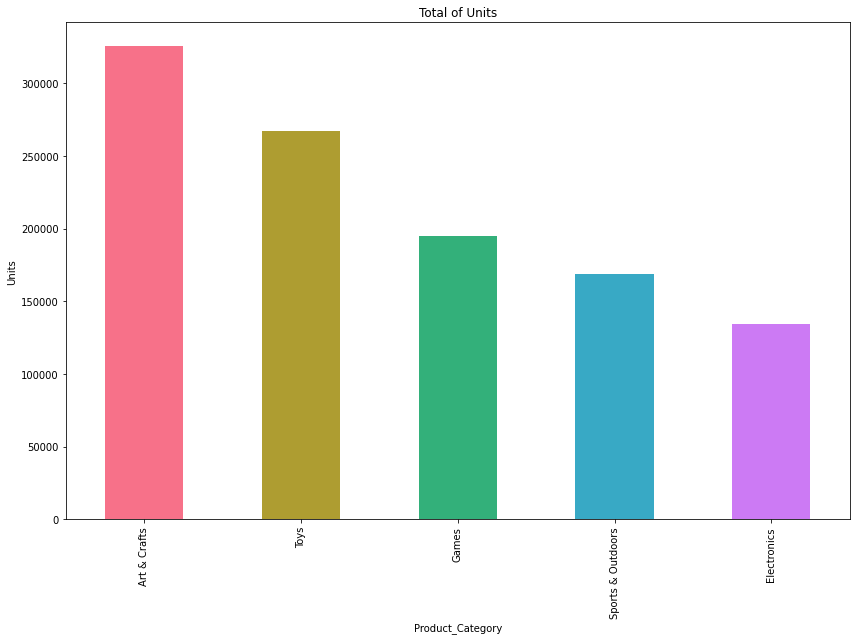

In [167]:
# Juguetes con más unidades vendidas
df_grouped = eda.grouping(df_aux, 'Product_Category', 'Units', procedure = 1, graph = 1)
df_grouped = df_grouped.reset_index()

Product_Category
Toys                 1079527.0
Electronics          1001437.0
Art & Crafts          753354.0
Games                 673993.0
Sports & Outdoors     505718.0
Name: Operation_profit, dtype: float64


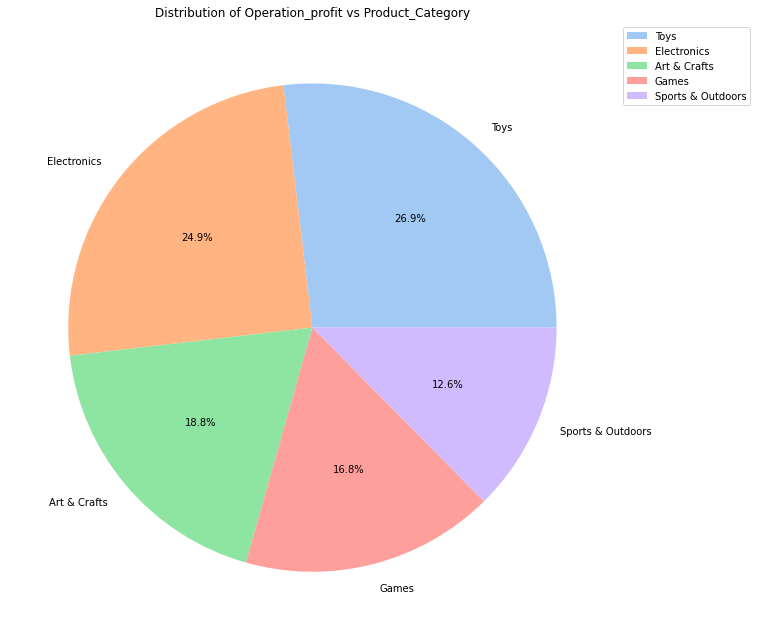

In [168]:
# Ganancias por venta de cada categoría de juguete
df_grouped = eda.grouping(df_aux, 'Product_Category', 'Operation_profit', procedure = 1, graph = 2)
df_grouped = df_grouped.reset_index()

In [169]:
# Productos disponibles por categoría
frequency_unique = products['Product_Category'].value_counts()
frequency_unique = frequency_unique.reset_index()
frequency_unique.columns = ['Product_Category', 'Products_per_category']
frequency_unique

,Product_Category,Products_per_category
0,Toys,9
1,Art & Crafts,8
2,Games,8
3,Sports & Outdoors,7
4,Electronics,3


In [170]:
# Importamos la información complementaria de las tiendas contenida en la tabla de dimension "Products"
# Seleccionar las columnas deseadas del dataframe df_info_adicional
selected_features = frequency_unique[['Product_Category', 'Products_per_category']]

# Importar las columnas seleccionadas basadas en el Store_id
df_mean_profit = pd.merge(df_grouped, selected_features, on='Product_Category', how='left')

#Calculo de la ganancia promedio por categoria de producto
mean_profit = [(df_mean_profit['Operation_profit'][i] / df_mean_profit['Products_per_category'][i]) for i in range(len(df_mean_profit))] 

# Agregar una columna de la ganancia media por categoría 
df_mean_profit['mean_profit'] = mean_profit

# Ordenar el DataFrame por la columna "columna_numerica" en orden ascendente
df_mean_profit = df_mean_profit.sort_values(by='mean_profit', ascending = False)

# Eliminar la columna "columna_eliminar"
#df_mean_profit = df_mean_profit.drop('index', axis=1)

# Consulta de la información de las 10 tiendas que más venden
df_mean_profit.head(10)

,Product_Category,Operation_profit,Products_per_category,mean_profit
1,Electronics,1001437.0,3,333812.333333
0,Toys,1079527.0,9,119947.444444
2,Art & Crafts,753354.0,8,94169.250000
3,Games,673993.0,8,84249.125000
4,Sports & Outdoors,505718.0,7,72245.428571


Product_ID  Product_Category 
6           Electronics          72988
8           Games                68083
25          Art & Crafts         64834
3           Art & Crafts         54078
1           Toys                 48497
18          Toys                 48030
31          Sports & Outdoors    41559
19          Art & Crafts         39293
30          Games                38703
2           Toys                 32250
9           Toys                 28181
7           Sports & Outdoors    26203
14          Games                24507
21          Sports & Outdoors    24378
10          Toys                 24311
24          Sports & Outdoors    23709
17          Art & Crafts         21648
15          Toys                 20776
27          Art & Crafts         20736
13          Electronics          15543
Name: Units, dtype: int64


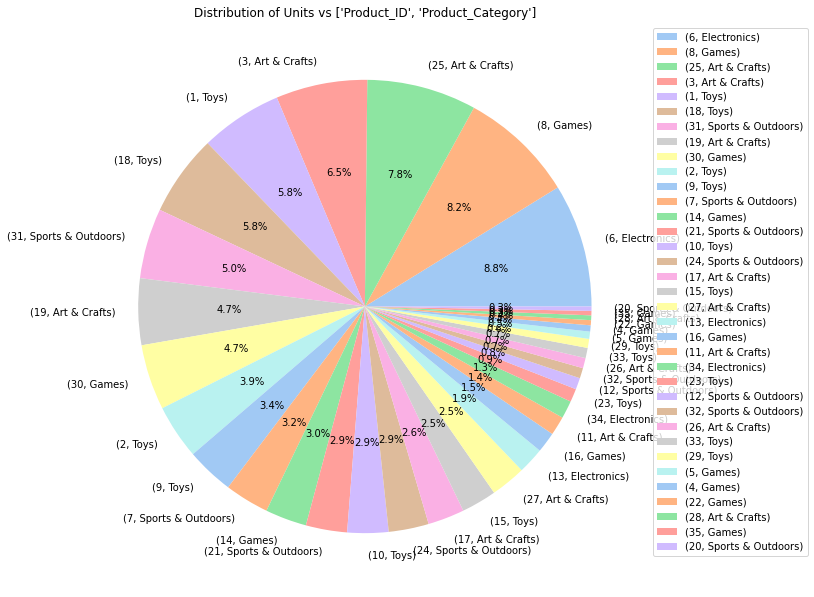

In [171]:
# Venta de cada uno de los productos por categoría
df_grouped = eda.grouping(df_aux, ['Product_ID','Product_Category'], 'Units', procedure = 2, graph = 2)
df_grouped = df_grouped.reset_index()

Product_ID  Product_Category 
6           Electronics          104368
25          Art & Crafts         103128
3           Art & Crafts          91663
8           Games                 84034
19          Art & Crafts          60598
31          Sports & Outdoors     60248
18          Toys                  59737
1           Toys                  57958
30          Games                 45672
2           Toys                  39089
9           Toys                  38236
14          Games                 37518
21          Sports & Outdoors     33604
7           Sports & Outdoors     31588
10          Toys                  29012
24          Sports & Outdoors     26543
17          Art & Crafts          24433
27          Art & Crafts          23128
15          Toys                  22659
13          Electronics           17958
Name: Units, dtype: int64


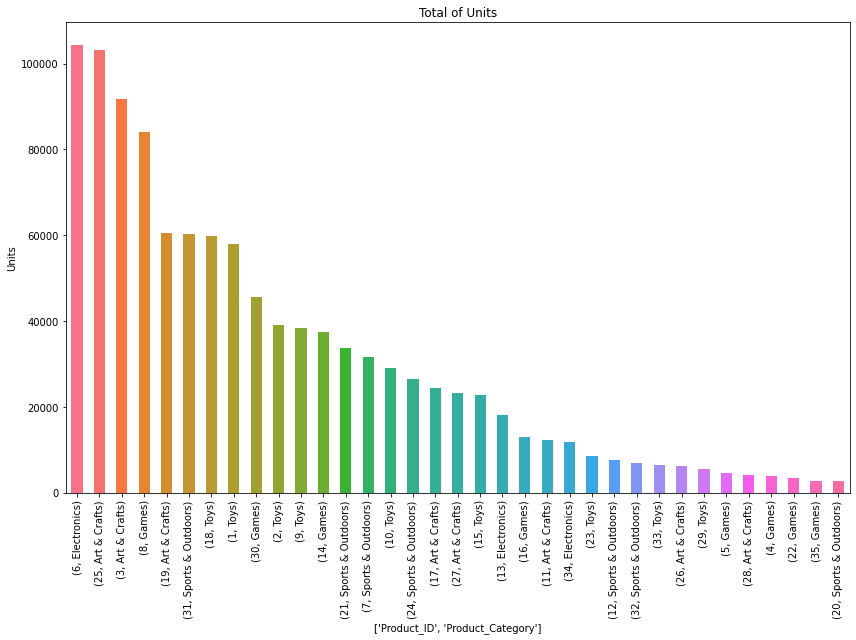

In [172]:
df_grouped = eda.grouping(df_aux, ['Product_ID','Product_Category'], 'Units', procedure = 1, graph = 1)
df_grouped = df_grouped.reset_index()

Como se puede apreciar, aunque a primera impresión los juguetes electrónicos parecería que son los que menos ganancias generan a la empresa, la realidad, es que su baja retribución obedece a la poca variedad de productos de esta categoría, porque la ganancia de esos tres productso es mayor que la obtenida por productos deportivos por ejemplo. De tal suerte que incrementar la variedad de productos de esta categoría probablemente resultaría en un incremento en las ganancias de la empresa.

Por otro lado, se puede apreciar que el número de unidades vendidas está fuertemente correlacionado con el número de ganancias obtenidas.

Sin embargo, algo que también se puede apreciar con estas medidas de agregación es cuales son los productso menos vendidos por la empresa, como se puede apreciar en la última tabla. Para comprender mejor como sería continuar con estos productos en las estanterías, se ajustará un modelo ARIMA. Este modelo nos permitirá visualizar con cierto margen de precisión como se espera que sean las ventas de este tipo de productso en los sigiuentes días, de tal suerte que los encargados de adquirir estos productos puedan determinar si conviene seguir con la venta de estos productos u optar por otros nuevos de la misma categoría u otros artículos de cartegorías totalmente diferentes.

In [173]:
df_grouped = df_grouped.tail(5)
df_grouped

,Product_ID,Product_Category,Units
30,28,Art & Crafts,4158
31,4,Games,3829
32,22,Games,3385
33,35,Games,2710
34,20,Sports & Outdoors,2647


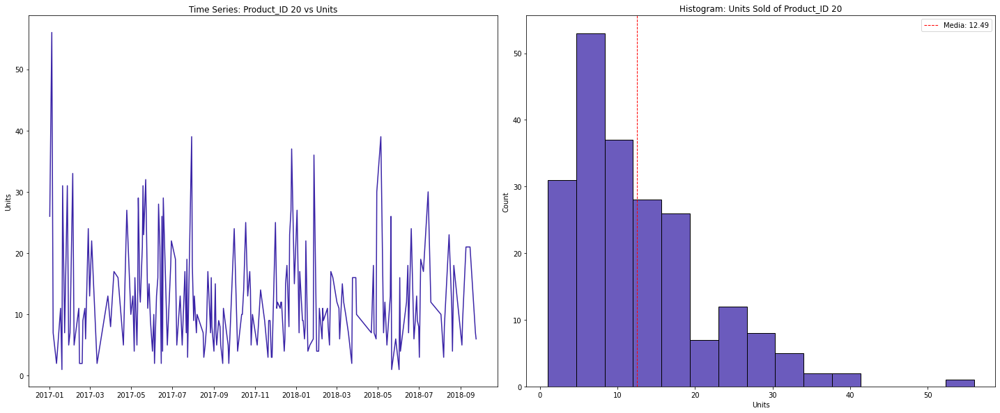

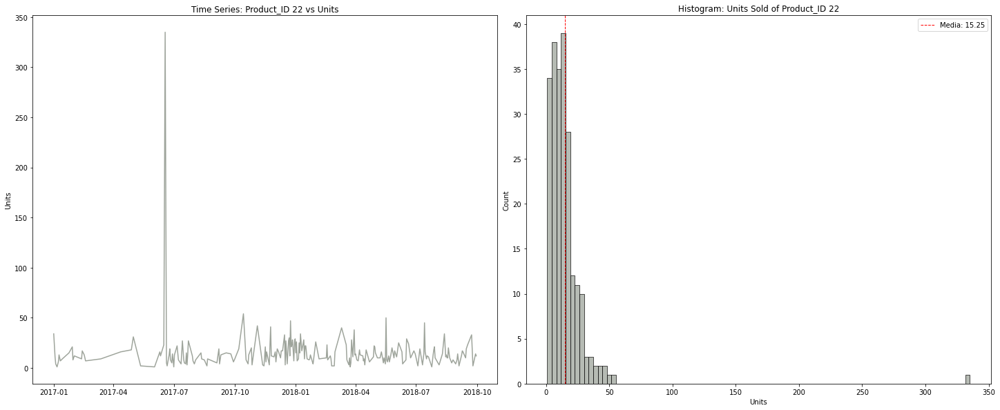

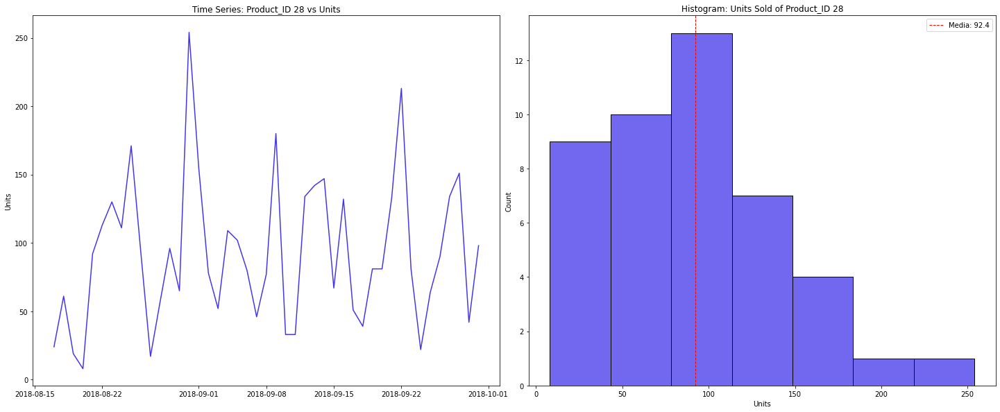

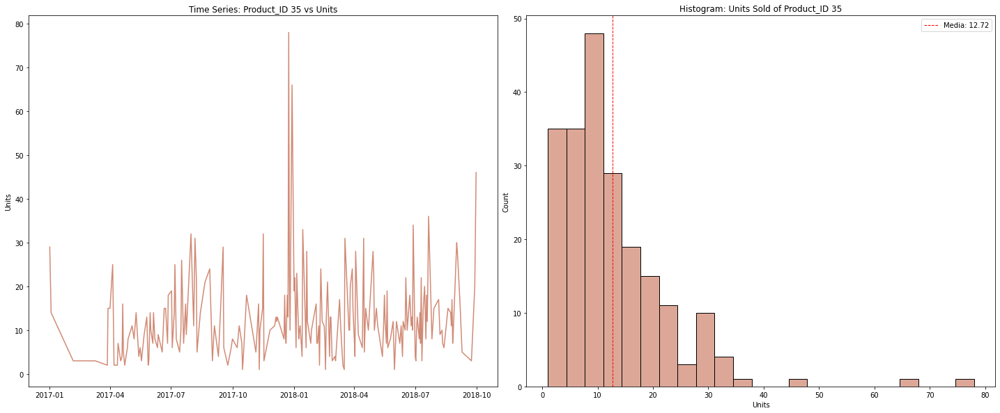

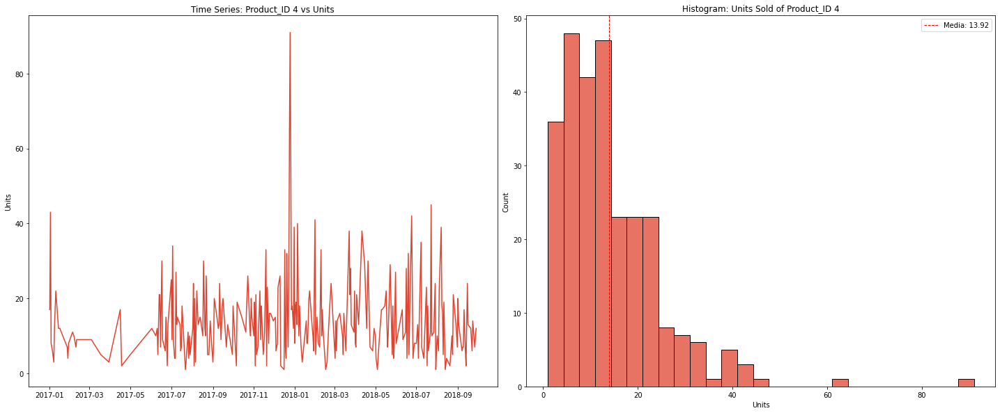

In [174]:
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
df_graph = df_grouped.tail(5)
unique_values_feature = np.sort(df_graph[feature_name].unique())

for i in range(1,len(unique_values_feature)+1):
    
    #define subplots
    fig, ax = plt.subplots(1, 2, figsize=(20,8))
    fig.tight_layout()
    
    color = generar_color_hex_aleatorio()
    
    df_store = df_aux[df_aux[feature_name] == unique_values_feature[i-1]]
    
    unique_dates = sorted(df_store[time_column_name].unique())
    sum = df_store.groupby(time_column_name)[grouping_feature].sum()
    #print(promedio)

    #percent = round((len(df_state) / len(df)) * 100, 2)
    
    # Graficos
    ax[0].set(title=f"Time Series: {feature_name} {unique_values_feature[i-1]} vs {grouping_feature}")
    ax[1].set(title=f"Histogram: {grouping_feature} Sold of {feature_name} {unique_values_feature[i-1]}")
    _ = sns.lineplot(x=unique_dates, y=sum, ax= ax[0], color = color)
    _ = sns.histplot(x=sum, ax= ax[1], color = color)
    #print(len(unique_dates))
    #print(len(sum))
    media = (np.sum(sum)/len(sum))
    ax[1].axvline(media, color='red', linestyle='dashed', linewidth=1, label = "Media")
    ax[1].legend(labels=['Media: {}'.format(round(media,2))])

    
#print(unique_values_feature[len(unique_values_feature)-1])
plt.show()

#### ¿Se debería seguir inviertiendo en tales productos o considerar en incorporar otro tipo de jueguetes?

### Producto: 28

Registros en el df_train:  36
Registros en el df_test:  9

Registros finales del conjunto de entrenamiento
         Date  Units
33 2018-09-19     81
34 2018-09-20     81
35 2018-09-21    133

Registros iniciales del conjunto de prueba
         Date  Units
36 2018-09-22    213
37 2018-09-23     81
38 2018-09-24     22


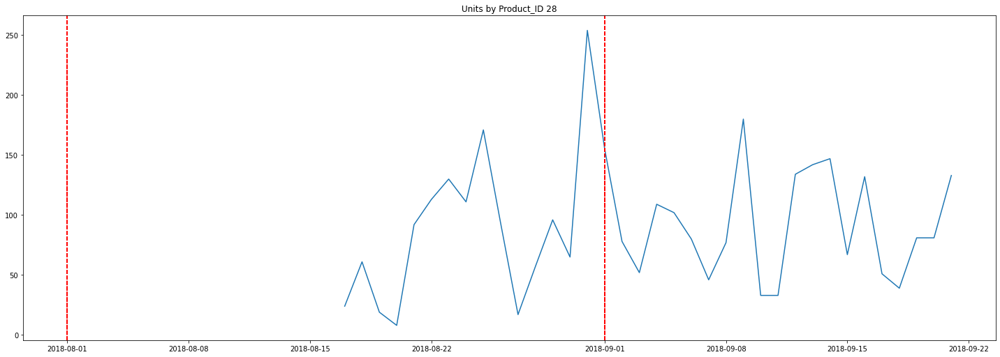

In [175]:
#Parametros de la st buscada
# 28, 4, 22, 35, 20
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = '28'
percent_test = 0.2
topic = 'product'
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [176]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 6.919030271980516e-05


In [177]:
# Generación de Parámetros
diff_type = ['inc']
cycle = 0

# Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
df_train_st = make_stationary(df_train, diff_type)
print(df_train_st.head(10))


         Date  Units
1  2018-08-18   37.0
2  2018-08-19  -42.0
3  2018-08-20  -11.0
4  2018-08-21   84.0
5  2018-08-22   21.0
6  2018-08-23   17.0
7  2018-08-24  -19.0
8  2018-08-25   60.0
9  2018-08-26  -78.0
10 2018-08-27  -76.0


In [178]:
diff_type = ['inc']
cycle = 0
# Generamos una Serie Estacionaria para el Conjunto de Datos
# Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [179]:
print(df_train_st.tail(10))

         Date  Units
26 2018-09-12  101.0
27 2018-09-13    8.0
28 2018-09-14    5.0
29 2018-09-15  -80.0
30 2018-09-16   65.0
31 2018-09-17  -81.0
32 2018-09-18  -12.0
33 2018-09-19   42.0
34 2018-09-20    0.0
35 2018-09-21   52.0


In [180]:
print(df_train_st.isnull().sum())

Date     0
Units    0
dtype: int64


In [181]:
print(df_test_st.head(10))

         Date  Units
36 2018-09-22   80.0
37 2018-09-23 -132.0
38 2018-09-24  -59.0
39 2018-09-25   42.0
40 2018-09-26   26.0
41 2018-09-27   44.0
42 2018-09-28   17.0
43 2018-09-29 -109.0
44 2018-09-30   56.0


In [182]:
print(df_test_st.isnull().sum())

Date     0
Units    0
dtype: int64


In [183]:
# Recuerdemos que con una diferenciacion se pierde el primer registro
print(len(df_train))
print(len(df_train_st))

36
35


In [184]:
print(len(pd.concat([df_train['Units'].iloc[-(cycle + 1):], df_test['Units']])))
print(len(df_test_st))

10
9


#### Graficamos la serie estacionaria

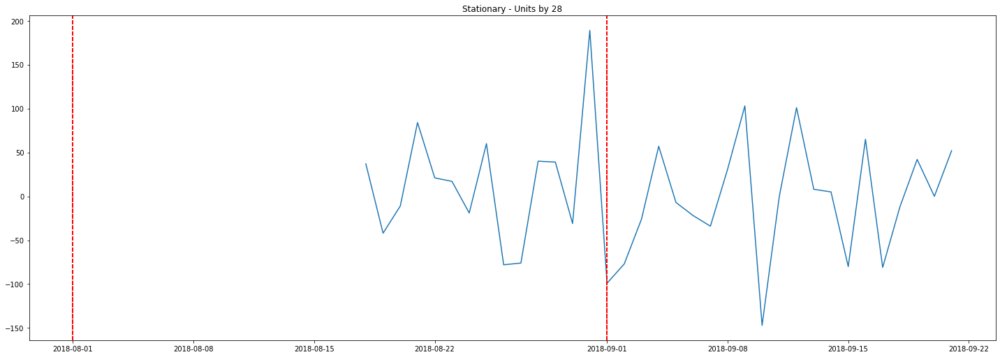

In [185]:
time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)
#time_series_st_plot(df_train_st['Operation_profit'], 'Date', 'Cuidad de Mexico')

##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [186]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 6.919030271980516e-05


In [187]:
ts_train = np.array(df_train_st[grouping_feature])

In [188]:
print(len(ts_train))

35


#### Determinación del orden p y q de la serie de tiempo

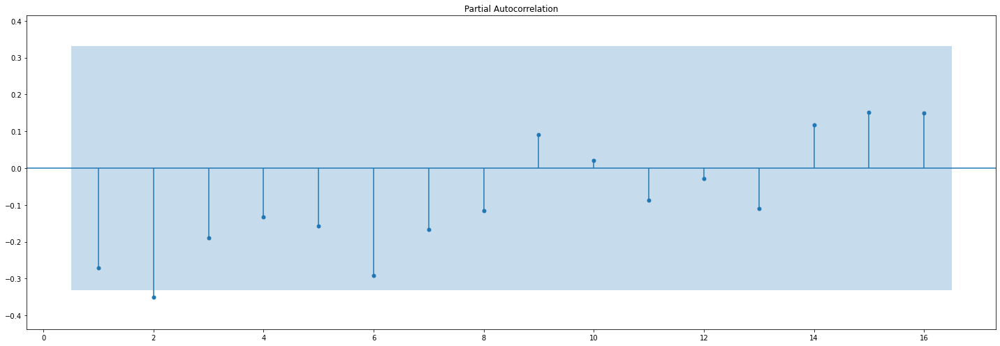

In [189]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=16, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

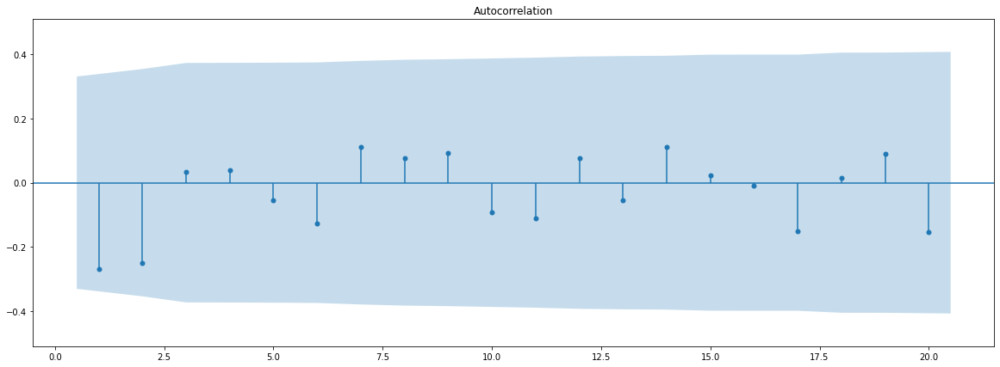

In [190]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=20, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [191]:
p = 2
d = 0
q = 0

In [192]:
model = ARIMA(ts_train, order=(p, d, q))

In [193]:
# arma = model.fit()

In [194]:
# arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

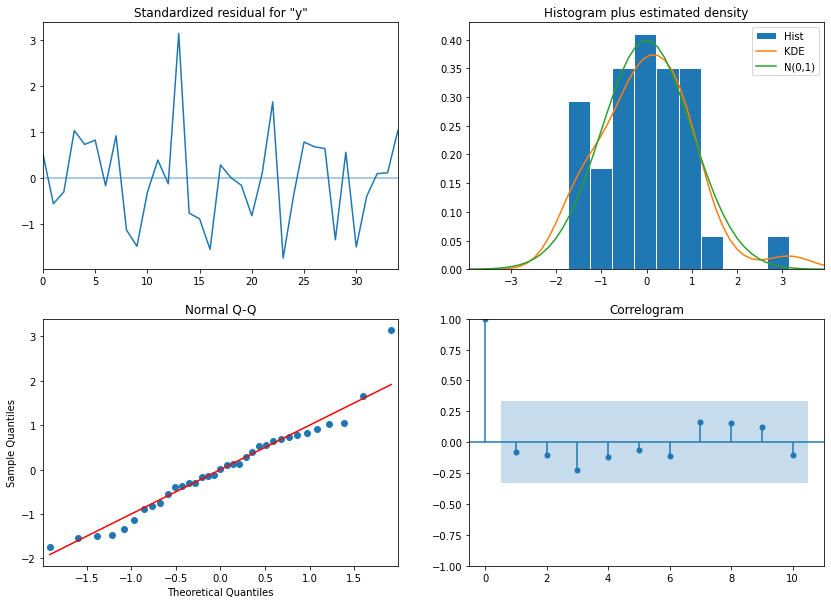

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.09464991603883272

Error a partir de la inversion de los datos estacionarios
MSE: 3833.6480765403594 
RMSE: 61.9164604652136 
MAPE: 1.0408472063508087


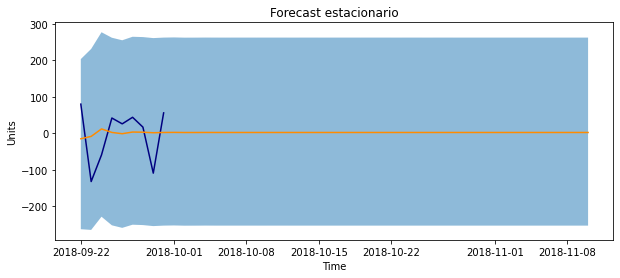

In [195]:
predicciones_st, predicciones_nst_originales, residuales, p_value = arma_forecast(n_preds = 50, steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Units', stationary = True, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = '28', topic = 'product', p = 2, d = 0, q = 0)

### Producto: 4

Registros en el df_train:  220
Registros en el df_test:  55

Registros finales del conjunto de entrenamiento
          Date  Units
217 2018-06-15     11
218 2018-06-16     28
219 2018-06-17      4

Registros iniciales del conjunto de prueba
          Date  Units
220 2018-06-19     32
221 2018-06-20      5
222 2018-06-22     25


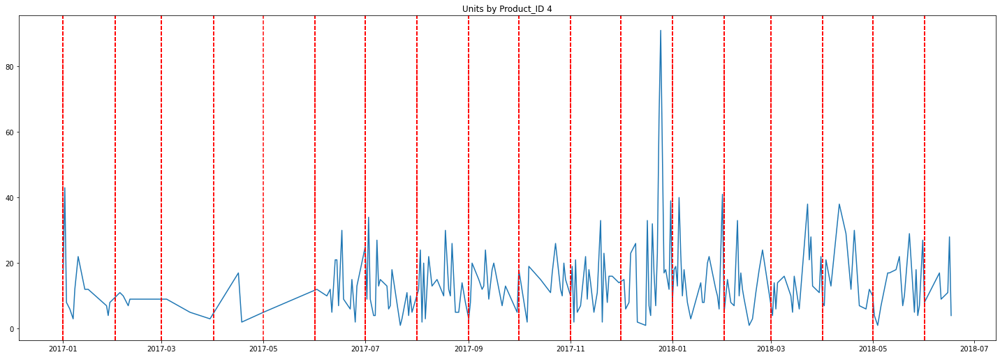

In [196]:
#Parametros de la st buscada
# 28, 4, 22, 35, 20
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = '4'
percent_test = 0.2
topic = 'product'
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [197]:
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.23164820187219132
0.4799754699332701


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [198]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 6.164469979838077e-27


Estacionariedad

In [199]:
# # Generación de Parámetros
# diff_type = ['inc']
# cycle = 0

# # Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
# df_train_st = make_stationary(df_train, diff_type)
# print(df_train_st.head(10))


In [200]:
# diff_type = ['inc']
# cycle = 0
# # Generamos una Serie Estacionaria para el Conjunto de Datos
# # Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
# df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [201]:
# print(df_train_st.tail(10))

In [202]:
# print(df_train_st.isnull().sum())

In [203]:
# print(df_test_st.isnull().sum())

#### Graficamos la serie tras la transformación

In [204]:
# time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [205]:
# result = adfuller(np.array(df_train[grouping_feature]))
# print('Valor p:', result[1])

In [206]:
ts_train = np.array(df_train[grouping_feature])

In [207]:
print(len(ts_train))

220


#### Determinación del orden p y q de la serie de tiempo

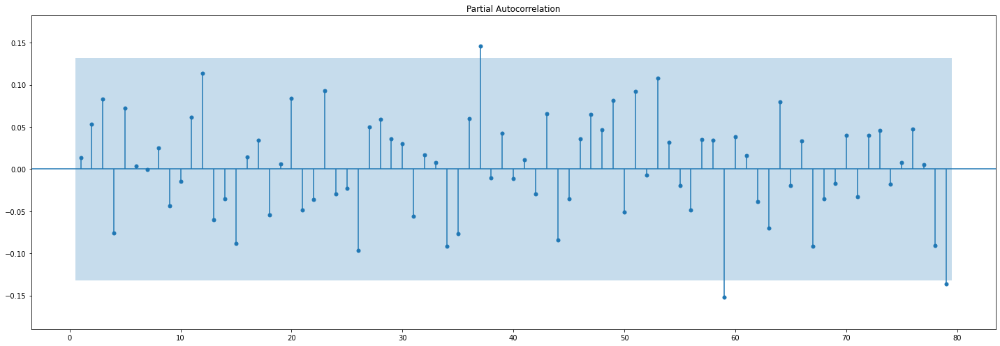

In [208]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=79, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

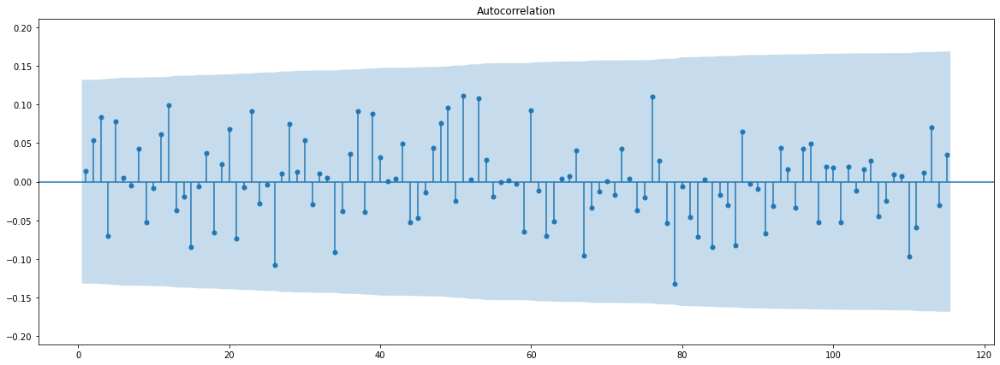

In [209]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=115, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [210]:
p = 79
d = 0
q = 0

In [211]:
model = ARIMA(ts_train, order=(p, d, q))

In [212]:
# arma = model.fit()

In [213]:
# arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

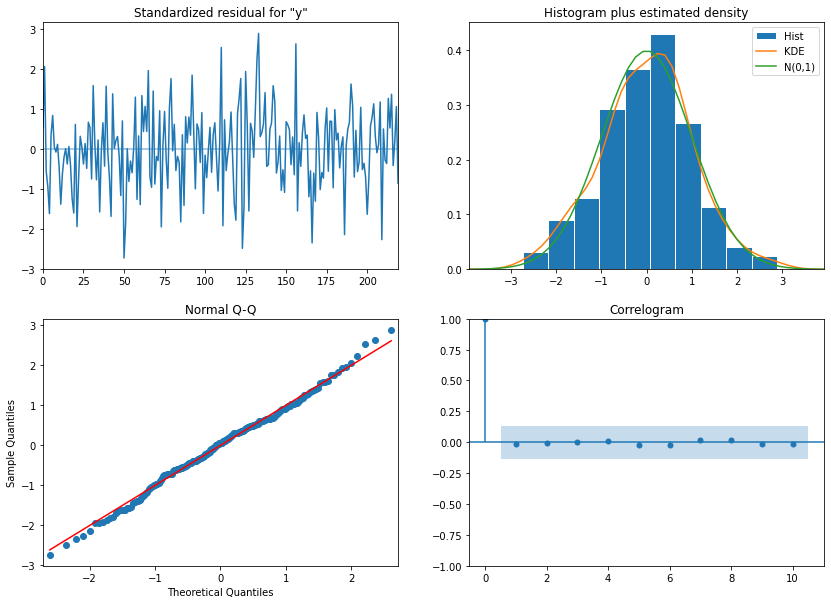

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.7122176034629314

Error a partir de la inversion de los datos estacionarios
MSE: 2.480129259544689 
RMSE: 1.5748426142140963 
MAPE: 527204885814133.94


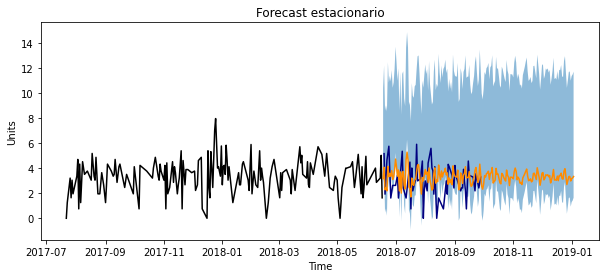

In [214]:
predicciones_st, predicciones_nst_originales, residuales, p_value = arma_forecast(n_preds = 200, steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Units', stationary = False, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = '4', topic = 'product', p = 79, d = 0, q = 0)

### Producto: 22

Registros en el df_train:  177
Registros en el df_test:  45

Registros finales del conjunto de entrenamiento
          Date  Units
174 2018-06-05     25
175 2018-06-10     16
176 2018-06-11      4

Registros iniciales del conjunto de prueba
          Date  Units
177 2018-06-16      8
178 2018-06-17     29
179 2018-06-20     24


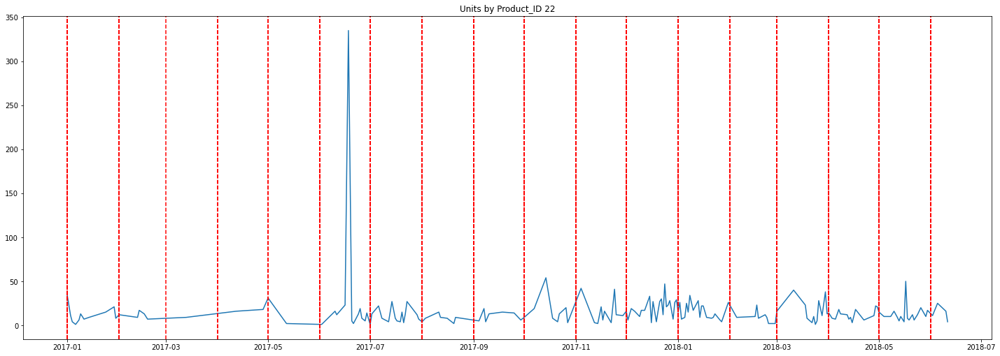

In [215]:
#Parametros de la st buscada
# 28, 4, 22, 35, 20
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = '22'
percent_test = 0.2
topic = 'product'
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [216]:
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.05572597550541876
0.004420731009407468


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [217]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 9.470483976070351e-24


Estacionariedad

In [218]:
# # Generación de Parámetros
# diff_type = ['inc']
# cycle = 0

# # Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
# df_train_st = make_stationary(df_train, diff_type)
# print(df_train_st.head(10))


In [219]:
# diff_type = ['inc']
# cycle = 0
# # Generamos una Serie Estacionaria para el Conjunto de Datos
# # Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
# df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [220]:
# print(df_train_st.tail(10))

In [221]:
print(df_train.isnull().sum())

Date     0
Units    0
dtype: int64


In [222]:
print(df_test.isnull().sum())

Date     0
Units    0
dtype: int64


#### Graficamos la serie estacionaria

In [223]:
# time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)
# #time_series_st_plot(df_train_st['Operation_profit'], 'Date', 'Cuidad de Mexico')

##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [224]:
# result = adfuller(np.array(df_train[grouping_feature]))
# print('Valor p:', result[1])

In [225]:
ts_train = np.array(df_train[grouping_feature])

In [226]:
print(len(ts_train))

177


#### Determinación del orden p y q de la serie de tiempo

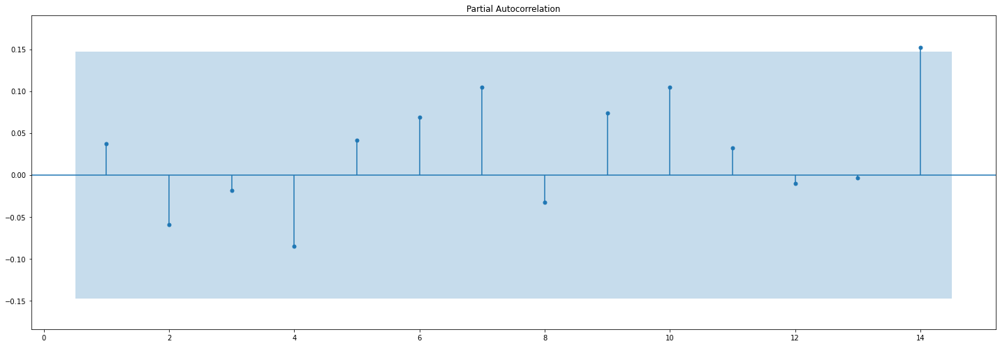

In [227]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=14, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

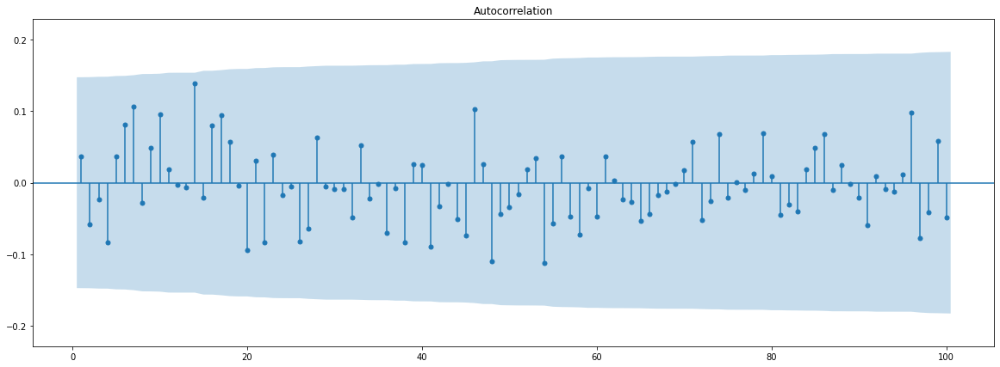

In [228]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=100, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [229]:
p = 14
d = 0
q = 0

In [230]:
model = ARIMA(ts_train, order=(p, d, q))

In [231]:
# arma = model.fit()

In [232]:
# arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

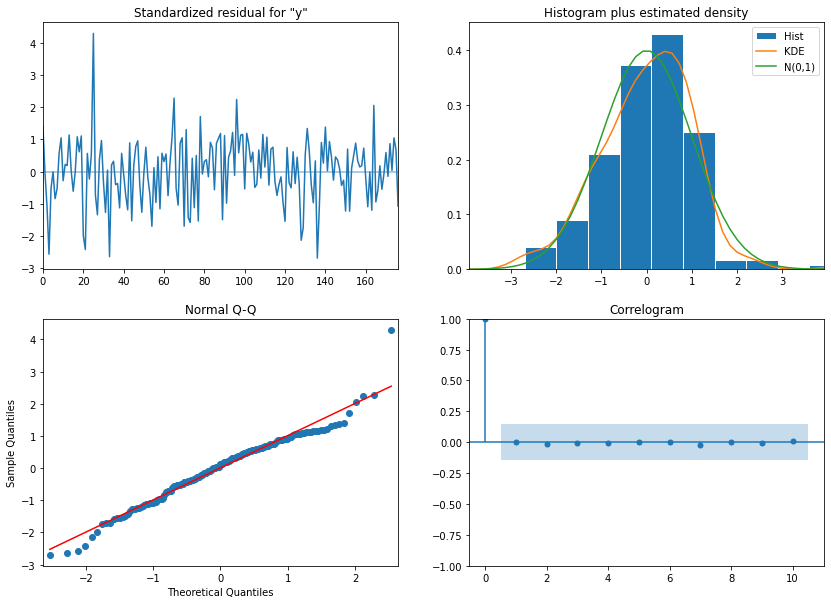

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.020780937442150937

Error a partir de la inversion de los datos estacionarios
MSE: 8.24377992989238 
RMSE: 2.871198343878803 
MAPE: 252326325029811.2


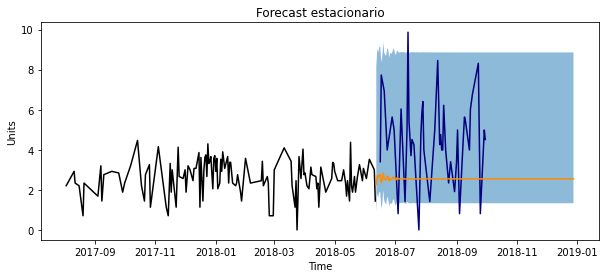

In [233]:
predicciones_st, predicciones_nst_originales, residuales, p_value = arma_forecast(n_preds = 200, steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Units', stationary = False, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = '22', topic = 'product', p = 14, d = 0, q = 0)

### Producto: 35

Registros en el df_train:  170
Registros en el df_test:  43

Registros finales del conjunto de entrenamiento
          Date  Units
167 2018-06-12      4
168 2018-06-13     12
169 2018-06-16     10

Registros iniciales del conjunto de prueba
          Date  Units
170 2018-06-17     22
171 2018-06-19     10
172 2018-06-23     18


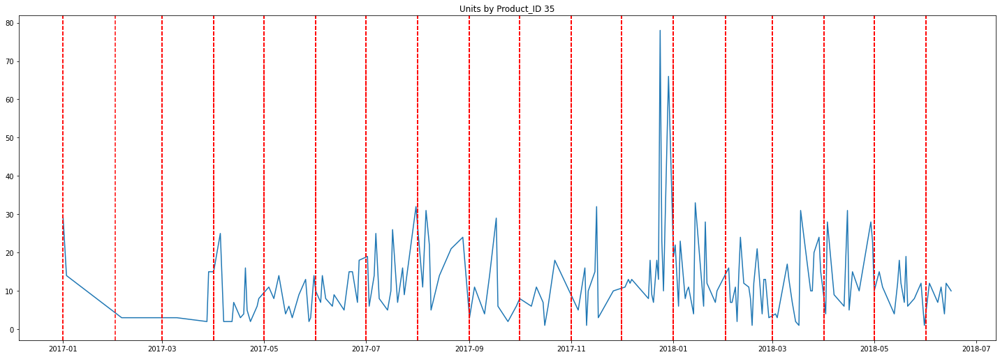

In [234]:
#Parametros de la st buscada
# 28, 4, 22, 35, 20
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = '35'
percent_test = 0.2
topic = 'product'
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [235]:
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.20386891108535907
0.5618100892407027


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [236]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 0.011207241307506825


Estacionariedad

In [237]:
# Generación de Parámetros
diff_type = ['inc']
cycle = 0

# Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
df_train_st = make_stationary(df_train, diff_type)
print(df_train_st.head(10))


         Date     Units
1  2017-01-03 -1.344532
2  2017-02-05 -2.264094
3  2017-03-10  0.000000
4  2017-03-28 -0.486853
5  2017-03-29  2.869940
6  2017-04-01  0.000000
7  2017-04-05  0.935086
8  2017-04-07 -3.805026
9  2017-04-12  0.000000
10 2017-04-13  1.643912


In [238]:
diff_type = ['inc']
cycle = 0
# Generamos una Serie Estacionaria para el Conjunto de Datos
# Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [239]:
# print(df_train_st.tail(10))

In [240]:
print(df_train.isnull().sum())

Date     0
Units    0
dtype: int64


In [241]:
print(df_test.isnull().sum())

Date     0
Units    0
dtype: int64


#### Graficamos la serie estacionaria

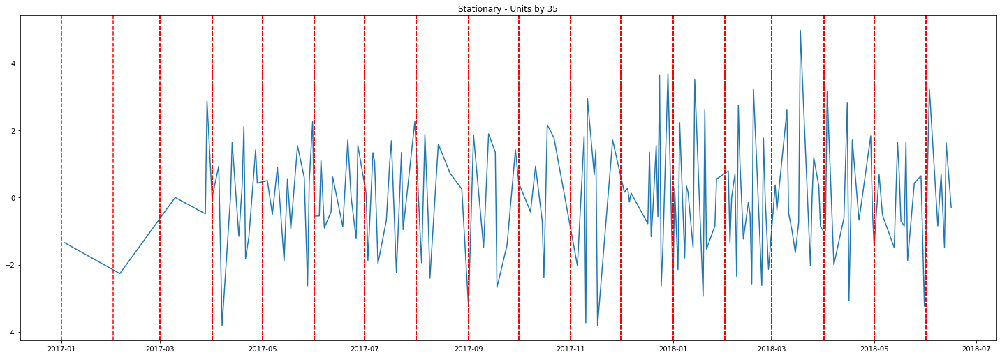

In [242]:
time_series_st_plot(df_train_st, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [243]:
result = adfuller(np.array(df_train_st[grouping_feature]))
print('Valor p:', result[1])

Valor p: 2.954023647086504e-17


In [244]:
ts_train = np.array(df_train_st[grouping_feature])

In [245]:
print(len(ts_train))

169


#### Determinación del orden p y q de la serie de tiempo

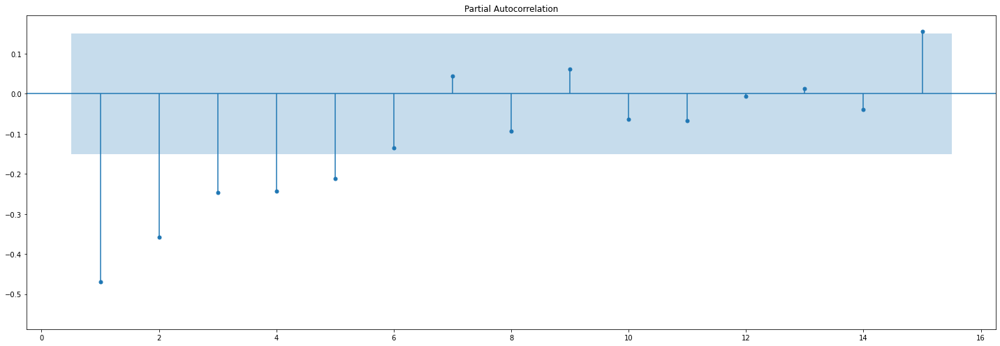

In [246]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=15, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

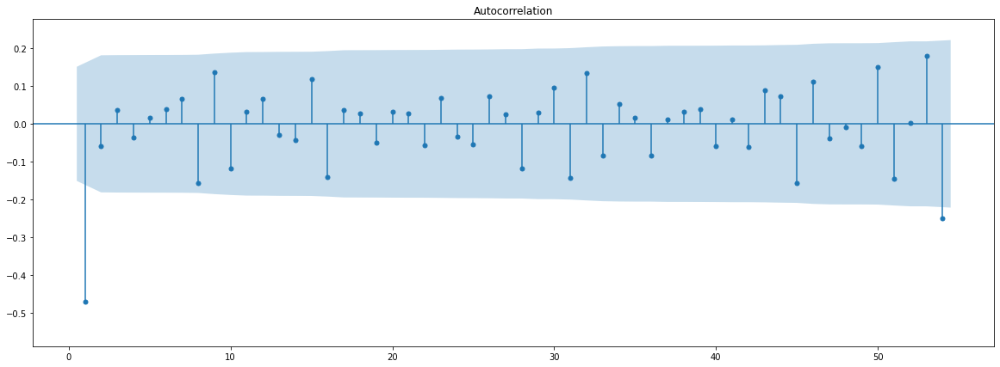

In [247]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=54, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [248]:
p = 15
d = 0
q = 1

In [249]:
model = ARIMA(ts_train, order=(p, d, q))

In [250]:
# arma = model.fit()

In [251]:
# arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

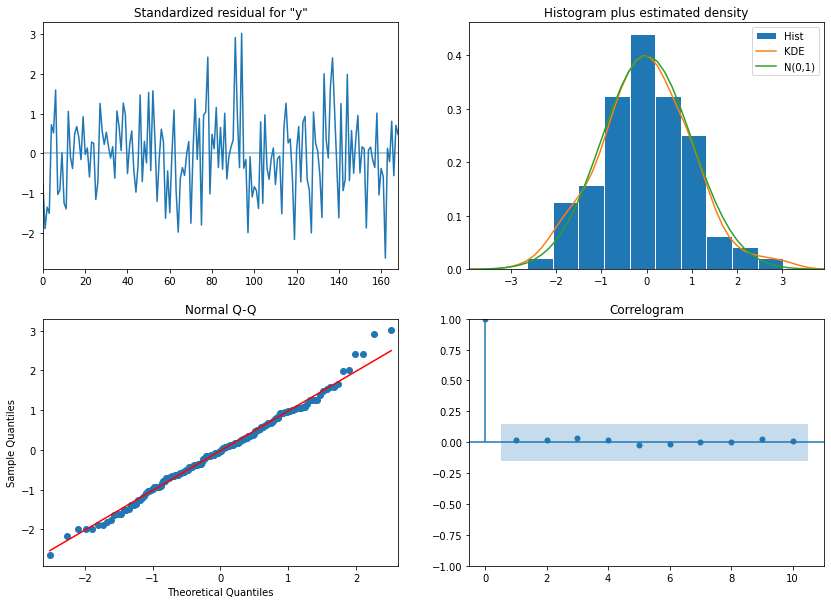

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.5190607131569442

Error a partir de la inversion de los datos estacionarios
MSE: 1.3302355533303036 
RMSE: 1.1533583802662135 
MAPE: 0.30744469121932017


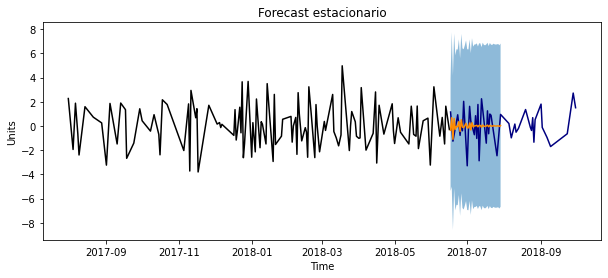

In [252]:
predicciones_st, predicciones_nst_originales, residuales, p_value = arma_forecast(n_preds = len(df_test), steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Units', diff_type = ['inc'], stationary = True, cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = '35', topic = 'product', p = 15, d = 0, q = 1)

### Producto: 20

Registros en el df_train:  169
Registros en el df_test:  43

Registros finales del conjunto de entrenamiento
          Date  Units
166 2018-03-30     16
167 2018-03-31     10
168 2018-04-22      7

Registros iniciales del conjunto de prueba
          Date  Units
169 2018-04-25     18
170 2018-04-26      7
171 2018-04-29      6


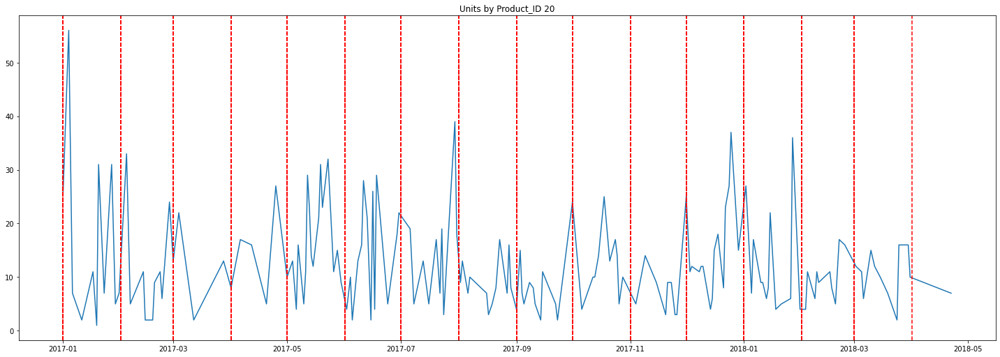

In [253]:
#Parametros de la st buscada
# 28, 4, 22, 35, 20
feature_name = 'Product_ID'
time_column_name = 'Date'
grouping_feature = 'Units'
specific_value = '20'
percent_test = 0.2
topic = 'product'
    
df_train, df_test = time_series_nst_plot(df_aux, feature_name, time_column_name, grouping_feature, specific_value, percent_test)

#### Estabilización de la varianza

In [254]:
# df_train[grouping_feature] = np.log(df_train[grouping_feature])
# df_test[grouping_feature] = np.log(df_test[grouping_feature])

# Aplicar la transformación de Box-Cox
datos_transformados, lambda_optimo = stats.boxcox(df_train[grouping_feature])
df_train[grouping_feature] = datos_transformados 
# Imprimir el valor óptimo de lambda
print("Valor óptimo de lambda:", lambda_optimo)

# Verificar si los datos transformados se asemejan a una distribución normal
k2, p_valor = stats.normaltest(datos_transformados)
print(p_valor)

datos_transformados, lambda_optimo = stats.boxcox(df_test[grouping_feature])
df_test[grouping_feature] = datos_transformados 

Valor óptimo de lambda: 0.19596991395961846
0.733194308476038


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [255]:
result = adfuller(np.array(df_train[grouping_feature]))
print('Valor p:', result[1])

Valor p: 7.558104908383627e-06


Estacionariedad

In [256]:
# # Generación de Parámetros
# diff_type = ['inc']
# cycle = 0

# # Generamos una Serie Estacionaria para el Conjunto de Entrenamiento
# df_train_st = make_stationary(df_train, diff_type)
# print(df_train_st.head(10))


In [257]:
# diff_type = ['inc']
# cycle = 0
# # Generamos una Serie Estacionaria para el Conjunto de Datos
# # Se le agregan los cycles+1 pasos hacia a tras para no perder predicciones al hacer las diferenciaciones
# df_test_st = make_stationary(pd.concat([df_train.iloc[-(cycle + 1):], df_test]), diff_type, cycle)

In [258]:
# print(df_train_st.tail(10))

In [259]:
print(df_train.isnull().sum())

Date     0
Units    0
dtype: int64


In [260]:
print(df_test.isnull().sum())

Date     0
Units    0
dtype: int64


#### Graficamos la serie estacionaria

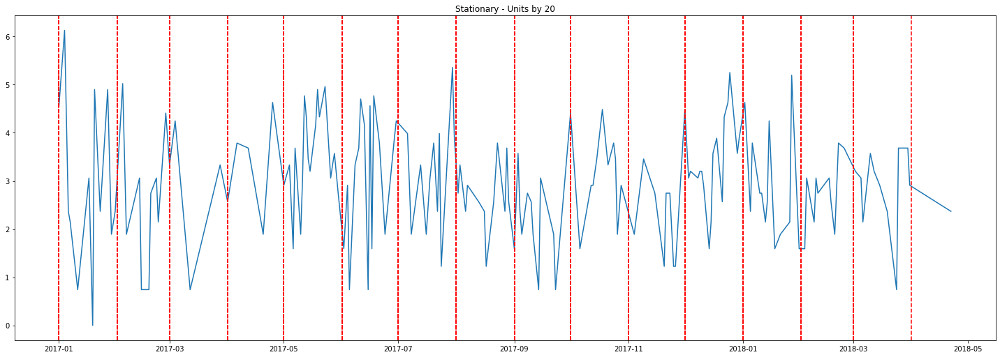

In [261]:
time_series_st_plot(df_train, time_column_name, grouping_feature, specific_value)


##### Validacion de la estacionariedad
##### Prueba de Dickey-Fuller aumentada (ADF)
La prueba de Dickey-Fuller aumentada es una prueba estadística común para verificar la estacionariedad de una serie de tiempo. Esta prueba evalúa si existe una raíz unitaria en la serie, lo que indica la presencia de una tendencia y, por lo tanto, no estacionariedad. Si el valor p obtenido en la prueba es menor que un umbral predefinido (generalmente 0.05), se rechaza la hipótesis nula de no estacionariedad.


In [262]:
# result = adfuller(np.array(df_train[grouping_feature]))
# print('Valor p:', result[1])

In [263]:
ts_train = np.array(df_train[grouping_feature])

In [264]:
print(len(ts_train))

169


#### Determinación del orden p y q de la serie de tiempo

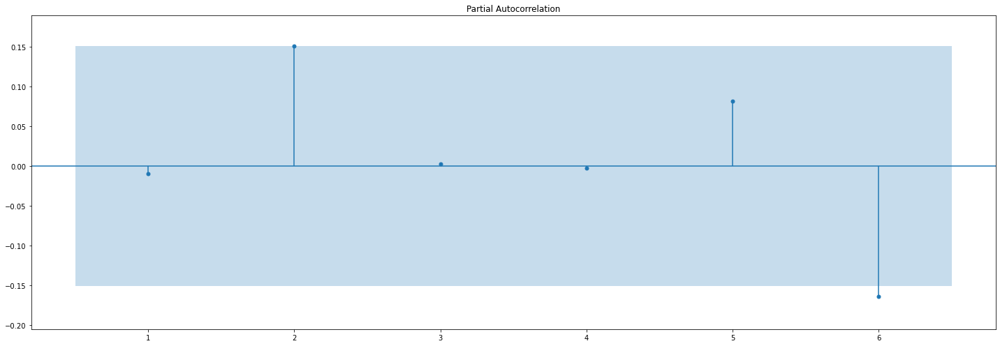

In [265]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_pacf(ts_train, lags=6, zero = False, auto_ylims=True, method='ywm', ax=ax)
plt.tight_layout()
plt.show()

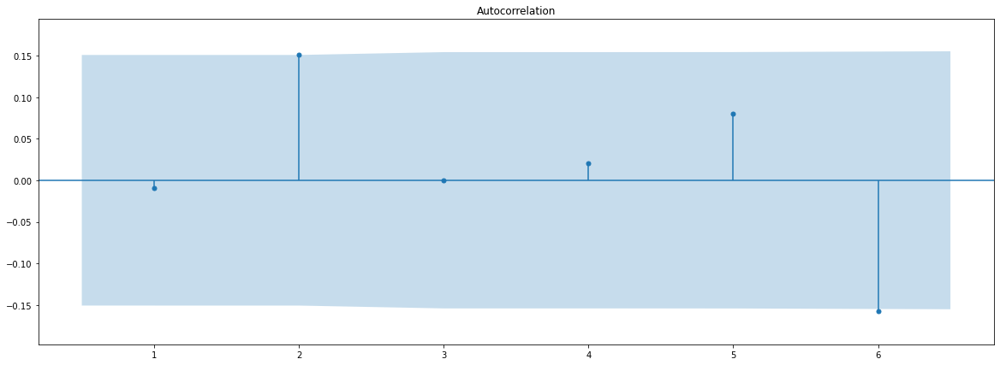

In [266]:
fig, ax = plt.subplots(figsize=(20, 7))
sm.graphics.tsa.plot_acf(ts_train, lags=6, zero = False, auto_ylims=True, ax=ax)
plt.show()

### Ajuste del modelo

In [267]:
p = 6
d = 0
q = 6

In [268]:
model = ARIMA(ts_train, order=(p, d, q))

In [269]:
#arma = model.fit()

In [270]:
#arma.save('{}_{}_{}_{}_{}.pkl'.format(specific_value, topic, p, d, q))

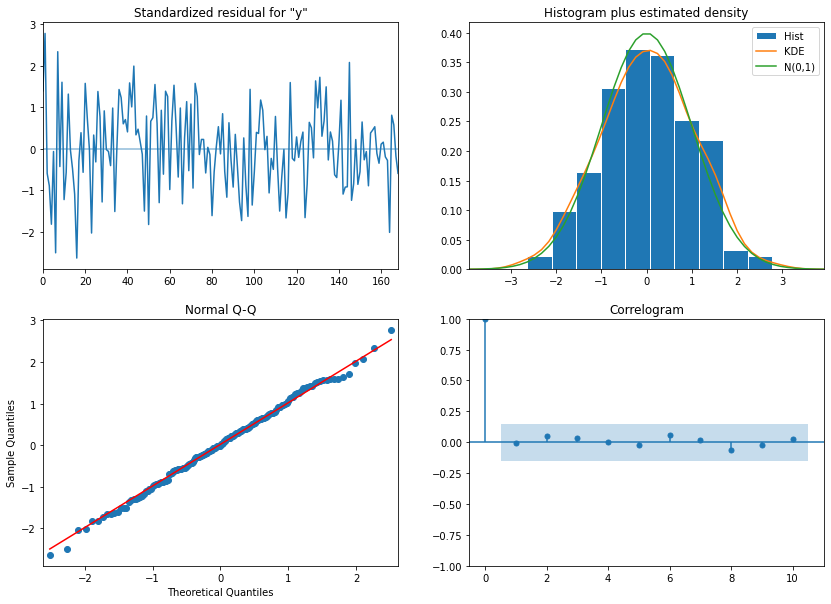

Evaluación de la normalidad de los residuales
Normal test results
p-value = 0.9786968258482264

Error a partir de la inversion de los datos estacionarios
MSE: 2.5090989692493175 
RMSE: 1.5840135634675978 
MAPE: 624204989892615.1


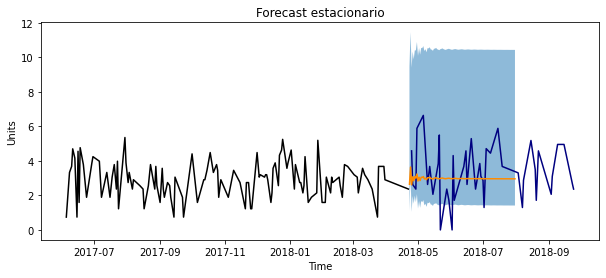

In [271]:
predicciones_st, predicciones_nst_originales, residuales, p_value = arma_forecast(n_preds = 100, steps_before = 50,  time_column_name = 'Date', grouping_feature = 'Units', stationary = False, diff_type = ['inc'], cycle = 0, df_train_ = df_train, df_test_ = df_test, specific_value = '20', topic = 'product', p = 6, d = 0, q = 6)